<div style="background-color: #CCFFCC; padding: 10px;">

<center>
    <font size="10"><strong>Data Science and Engineering</strong></font>
</cente r>
<center>
    <font size="6"><strong>Cybersecurity Analytics and Threat Simulation</strong></font>
</center>


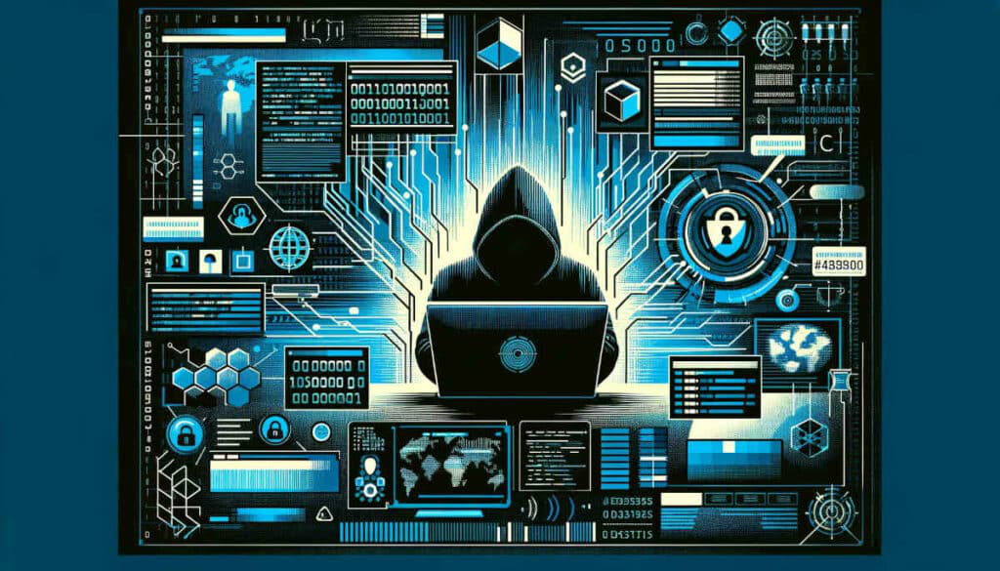

In [1]:
from PIL import Image
Image.open('cyberattak.jpg')

<div style="background-color: #FFEE77; padding: 10px;">

# ***`Column Names and Description`***

<div style="background-color: #000080; padding: 10px;">

**srcip**:	            Source IP address

**sport**:	            Source port number

**dstip**:	            Destination IP address

**dsport**:	            Destination port number

**proto**:	            Transaction protocol

**state**:	            Indicates to the state and its dependent protocol, e.g. ACC, CLO, CON, ECO, ECR, FIN, INT, MAS, PAR, REQ, RST, TST, TXD,                                URH, URN, and (-)(if not used state)

**dur**:		        Record total duration

**sbytes**:	            Source to destination transaction bytes 

**dbytes**:	            Destination to source transaction bytes

**sttl**:	            Source to destination time to live value 

**dttl**:	            Destination to source time to live value

**sloss**:	            Source packets retransmitted or dropped 

**dloss**:	            Destination packets retransmitted or dropped

**service**:	        http, ftp, smtp, ssh, dns, ftp-data ,irc  and (-) if not much used service

**Sload**:	            Source bits per second

**Dload**:	            Destination bits per second

**Spkts**:	            Source to destination packet count 

**Dpkts**:	            Destination to source packet count

**swin**:               Source TCP window advertisement value

**dwin**:	            Destination TCP window advertisement value

**stcpb**:	            Source TCP base sequence number

**dtcpb**:	            Destination TCP base sequence number

**smeansz**:	        Mean of the ?ow packet size transmitted by the src 

**dmeansz**:	        Mean of the ?ow packet size transmitted by the dst

**trans_depth**:	    Represents the pipelined depth into the connection of http request/response transaction

**res_bdy_len**: 	    Actual uncompressed content size of the data transferred from the server’s http service.

**Sji**t:		        Source jitter (mSec)

**Djit**:		        Destination jitter (mSec)

**Stime**:		        record start time

**Ltime**:		        record last time

**Sintpkt**:		    Source interpacket arrival time (mSec)

**Dintpkt**:		    Destination interpacket arrival time (mSec)

**tcprtt**:		        TCP connection setup round-trip time, the sum of ’synack’ and ’ackdat’.

**synack**:	    	    TCP connection setup time, the time between the SYN and the SYN_ACK packets.

**ackdat**:	    	    TCP connection setup time, the time between the SYN_ACK and the ACK packets.

**is_sm_ips_ports**:    If source (1) and destination (3)IP addresses equal and port numbers (2)(4)  equal then, this variable takes value 1 else 0

**ct_state_ttl**:	    No. for each state (6) according to specific range of values for source/destination time to live (10) (11).

**ct_flw_http_mthd**:   No. of flows that has methods such as Get and Post in http service.

**is_ftp_login**:       If the ftp session is accessed by user and password then 1 else 0.

**ct_ftp_cmd**:		    No of flows that has a command in ftp session.

**ct_srv_src**:	      No. of connections that contain the same service (14) and source address (1) in 100 connections according to the lasttime(26).

**ct_srv_dst**:	      No. of connections that contain the same service (14) and destination address (3) in 100 connections according to the last                              time(26).

**ct_dst_ltm**:		   No. of connections of the same destination address (3) in 100 connections according to the last time (26).

**ct_src_ ltm**:	   No. of connections of the same source address (1) in 100 connections according to the last time (26).

**ct_src_dport_ltm**:  No of connections of the same source address (1) and the destination port (4) in 100 connections according to the last time                            (26).

**ct_dst_sport_ltm**:  No of connections of the same destination address (3) and the source port (2) in 100 connections according to the last time                            (26).

**ct_dst_src_ltm**:	   No of connections of the same source (1) and the destination (3) address in in 100 connections according to the last time                              (26).

**attack_cat**:		   The name of each attack category. In this data set , nine categories e.g. Fuzzers, Analysis, Backdoors, DoS Exploits,                                   Generic, Reconnaissance, Shellcode and Worms 

**Label**:	           0 for normal and 1 for attack records

<div style="background-color: #FFEE77; padding: 10px;">

# ***`Importing Necessary Libraries`***

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
import statsmodels.stats.multicomp as multi
import statsmodels.stats.weightstats as wstats 
import statsmodels.formula.api as sfa
import statsmodels.api as sma
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.stats.diagnostic import linear_rainbow
from warnings import filterwarnings
filterwarnings('ignore')
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler,MinMaxScaler,RobustScaler,LabelEncoder
from sklearn.metrics import confusion_matrix,classification_report,recall_score,precision_score,accuracy_score,f1_score
from sklearn.metrics import precision_recall_curve,auc
from sklearn.metrics import roc_curve,roc_auc_score,cohen_kappa_score
from sklearn.linear_model import LinearRegression,Ridge,Lasso,ElasticNet,SGDRegressor,LogisticRegression
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV,KFold,cross_val_score,LeaveOneOut
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB,MultinomialNB,BernoulliNB
from sklearn.tree import DecisionTreeClassifier,plot_tree
from sklearn.ensemble import BaggingClassifier,RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier,GradientBoostingClassifier
from xgboost import XGBClassifier
# removing the limit for the number of displayed columns
pd.set_option("display.max_columns", None)
# setting the limit for the number of displayed rows
pd.set_option("display.precision",3)

<div style="background-color: #FFEE77; padding: 10px;">

# ***`Read The Data`***

In [3]:
cols = ['srcip','sport','dstip','dsport','proto','state','dur','sbytes','dbytes','sttl','dttl','sloss','dloss','service',
        'Sload','Dload','Spkts','Dpkts','swin','dwin','stcpb','dtcpb','smeansz','dmeansz','trans_depth','res_bdy_len',
        'Sjit','Djit','Stime','Ltime','Sintpkt','Dintpkt','tcprtt','synack','ackdat','is_sm_ips_ports','ct_state_ttl',
        'ct_flw_http_mthd','is_ftp_login','ct_ftp_cmd','ct_srv_src','ct_srv_dst','ct_dst_ltm','ct_src_ ltm','ct_src_dport_ltm',
        'ct_dst_sport_ltm','ct_dst_src_ltm','attack_cat','Label']

In [4]:
data = pd.read_csv('UNSW-NB15_Dataset.csv',names=cols)
data.head()

,srcip,sport,dstip,dsport,proto,state,dur,sbytes,dbytes,sttl,dttl,sloss,dloss,service,Sload,Dload,Spkts,Dpkts,swin,dwin,stcpb,dtcpb,smeansz,dmeansz,trans_depth,res_bdy_len,Sjit,Djit,Stime,Ltime,Sintpkt,Dintpkt,tcprtt,synack,ackdat,is_sm_ips_ports,ct_state_ttl,ct_flw_http_mthd,is_ftp_login,ct_ftp_cmd,ct_srv_src,ct_srv_dst,ct_dst_ltm,ct_src_ ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,attack_cat,Label
0,59.166.0.9,7045,149.171.126.7,25,tcp,FIN,2.019e-01,37552,3380,31,29,18,8,smtp,1.459e+06,1.308e+05,52,42,255,255,1422136554,3572668484,722,80,0,0,456.044,15.530,1424250009,1424250009,3.944,4.912,5.900e-04,4.730e-04,1.170e-04,0,0,NaN,NaN,,2,2,7,4,1,1,3,NaN,0
1,59.166.0.9,9685,149.171.126.2,80,tcp,FIN,5.865e+00,19410,1087890,31,29,2,370,http,2.640e+04,1.482e+06,364,746,255,255,389619597,394688654,53,1458,1,0,1031.366,690.220,1424250003,1424250009,16.155,7.871,7.710e-04,6.380e-04,1.330e-04,0,0,1.0,NaN,,3,1,4,4,1,1,1,NaN,0
2,59.166.0.2,1421,149.171.126.4,53,udp,CON,1.391e-03,146,178,31,29,0,0,dns,4.198e+05,5.119e+05,2,2,0,0,0,0,73,89,0,0,0.000,0.000,1424250009,1424250009,0.009,0.002,0.000e+00,0.000e+00,0.000e+00,0,0,NaN,NaN,,3,5,2,7,1,1,4,NaN,0
3,59.166.0.2,21553,149.171.126.2,25,tcp,FIN,5.395e-02,37812,3380,31,29,19,8,smtp,5.503e+06,4.894e+05,54,42,255,255,4047523379,1903327524,700,80,0,0,65.910,3.155,1424250009,1424250009,1.012,1.303,6.740e-04,5.400e-04,1.340e-04,0,0,NaN,NaN,,1,1,4,7,1,1,3,NaN,0
4,59.166.0.8,45212,149.171.126.4,53,udp,CON,9.530e-04,146,178,31,29,0,0,dns,6.128e+05,7.471e+05,2,2,0,0,0,0,73,89,0,0,0.000,0.000,1424250009,1424250009,0.009,0.004,0.000e+00,0.000e+00,0.000e+00,0,0,NaN,NaN,,2,5,2,1,1,1,2,NaN,0


In [5]:
# Number of Rows and Columns
print(f"Number of Rows in the dataset: {data.shape[0]}\nNumber of Columns in the dataset: {data.shape[1]}")

Number of Rows in the dataset: 672436
Number of Columns in the dataset: 49


In [6]:
# Datatypes
data.dtypes

srcip                object
sport                 int64
dstip                object
dsport               object
proto                object
state                object
dur                 float64
sbytes                int64
dbytes                int64
sttl                  int64
dttl                  int64
sloss                 int64
dloss                 int64
service              object
Sload               float64
Dload               float64
Spkts                 int64
Dpkts                 int64
swin                  int64
dwin                  int64
stcpb                 int64
dtcpb                 int64
smeansz               int64
dmeansz               int64
trans_depth           int64
res_bdy_len           int64
Sjit                float64
Djit                float64
Stime                 int64
Ltime                 int64
Sintpkt             float64
Dintpkt             float64
tcprtt              float64
synack              float64
ackdat              float64
is_sm_ips_ports     

<div style="background-color: #FFEE77; padding: 10px;">

# ***`Data Cleaning`***

#### **`Checking For Duplicates`**

In [7]:
data[data.duplicated()].shape[0]

291326

<div style="background-color: #ccf2ff; padding: 10px;">

***`Inference:`***
* There are **291326 duplicates** so we have to drop them.

In [8]:
data.drop_duplicates(inplace=True)

In [9]:
data[data.duplicated()].shape[0]

0

<div style="background-color: #ccf2ff; padding: 10px;">

***`Inference:`***
* We have **dropped** the **duplicates**.

#### **`Checking for missing values`**

In [10]:
data.isnull().sum()

srcip                    0
sport                    0
dstip                    0
dsport                   0
proto                    0
state                    0
dur                      0
sbytes                   0
dbytes                   0
sttl                     0
dttl                     0
sloss                    0
dloss                    0
service                  0
Sload                    0
Dload                    0
Spkts                    0
Dpkts                    0
swin                     0
dwin                     0
stcpb                    0
dtcpb                    0
smeansz                  0
dmeansz                  0
trans_depth              0
res_bdy_len              0
Sjit                     0
Djit                     0
Stime                    0
Ltime                    0
Sintpkt                  0
Dintpkt                  0
tcprtt                   0
synack                   0
ackdat                   0
is_sm_ips_ports          0
ct_state_ttl             0
c

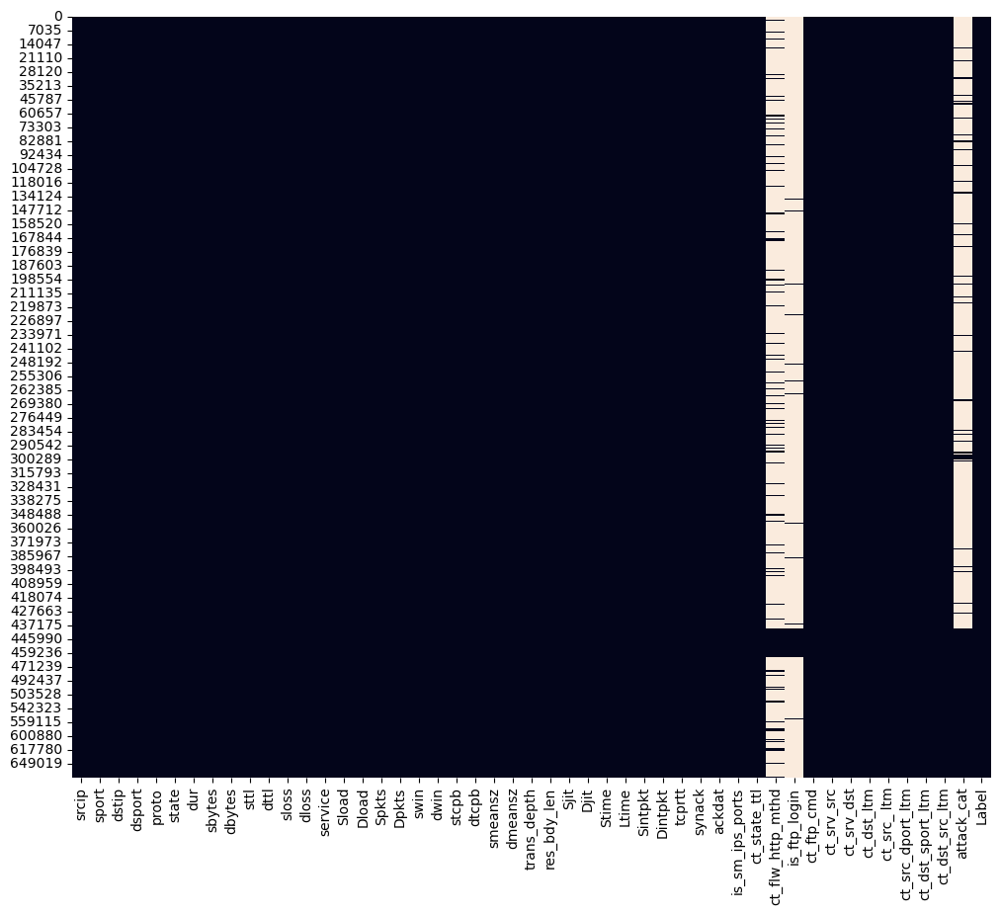

In [11]:
plt.figure(figsize=(12,10))
sns.heatmap(data.isnull(),cbar=False)
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

***`Inference: `***

* We have significant amount of null values in the `ct_flw_http_mthd, is_ftp_login` and `attack_cat` columns.

In [12]:
# Treating null values in columns "ct_flw_http_mthd", "is_ftp_login" and "attack_cat"


# Null values in "ct_flw_http_mthd" typically mean that HTTP traffic was not part of the flow captured in the record, so HTTP methods (like GET, POST, etc.) were not observed in that specific network flow.
# So we will replace the null values with 0
data['ct_flw_http_mthd'].fillna(0,inplace=True)
data['ct_flw_http_mthd'] = data['ct_flw_http_mthd'].astype(int)

#Null values in "is_ftp_login" signify that the FTP protocol was not involved in the flow. If FTP activity was absent, then no FTP login attempt would be recorded, resulting in null values in this column.
# Hence we will replace the null values with 0
data['is_ftp_login'].fillna(0,inplace=True)
data['is_ftp_login'] = data['is_ftp_login'].astype(int)
data['is_ftp_login'] = (data['is_ftp_login'] > 0).astype(int)

# Null values in the 'attack_cat' column implies that there is no attack for that particular row of data. Hence replacing null values with 'Normal'
data['attack_cat'].fillna('Normal',inplace=True)
data['attack_cat'] = data['attack_cat'].replace({' Fuzzers ':'Fuzzers',' Fuzzers':'Fuzzers',' Reconnaissance ':'Reconnaissance',' Shellcode ':'Shellcode',
                                                 'Backdoors':'Backdoor'})

In [13]:
# Handling 'ct_ftp_cmd'
data['ct_ftp_cmd'] = data['ct_ftp_cmd'].astype(str)
data['ct_ftp_cmd'] = data['ct_ftp_cmd'].replace(' ','0')
data['ct_ftp_cmd'] = data['ct_ftp_cmd'].astype(int)

# Handling 'service'
data['service'] = data['service'].replace({'-':'others'})

In [14]:
data.isnull().sum().sum()

0

<div style="background-color: #ccf2ff; padding: 10px;">

***`Inference:`***
* We have **treated** all the **missing values**.

# ***`Dropping Redundant Columns`***

In [15]:
data.drop(columns=['srcip','sport','dstip','dsport','Stime','Ltime','stcpb','dtcpb'],inplace=True)

<div style="background-color: #ccf2ff; padding: 10px;">

**srcip and dstip:** Unique identifiers for specific hosts with no intrinsic value for attack detection. Retaining them may cause overfitting.

**sport and dsport:** Ports often represent services but add noise without substantial predictive value, as the service column already covers this.

**Stime and Ltime:** Timestamps are hard to interpret directly and require complex feature engineering. They add little value as-is.

**stcpb and dtcpb:** TCP sequence numbers vary per connection and are irrelevant for generalizable patterns, adding unnecessary noise.

**Dropping these columns reduces complexity and enhances focus on key traffic features.**

<div style="background-color: #FFEE77; padding: 10px;">

# ***`DATA EXPLORATION`***

## ***`Seprating Numerical columns and Categorical columns`***

In [16]:
num_cols = ['dur','sbytes','dbytes','sttl','dttl','sloss','dloss','Sload','Dload','Spkts','Dpkts','swin','dwin','smeansz','dmeansz','trans_depth',
            'res_bdy_len','Sjit','Djit','Sintpkt','Dintpkt','tcprtt','synack','ackdat','ct_state_ttl','ct_flw_http_mthd','ct_ftp_cmd','ct_srv_src',
            'ct_srv_dst','ct_dst_ltm','ct_src_ ltm','ct_src_dport_ltm','ct_dst_sport_ltm','ct_dst_src_ltm']

In [17]:
cat_cols = ['proto','state','service','is_sm_ips_ports','is_ftp_login','attack_cat','Label']

### **Descriptive Analysis**

In [18]:
# 5 Point Summary
data[num_cols].describe().T

,count,mean,std,min,25%,50%,75%,max
dur,381110.0,7.985e-01,3.977e+00,0.0,0.001,2.704e-02,5.355e-01,6.000e+01
sbytes,381110.0,7.744e+03,1.424e+05,0.0,264.000,1.470e+03,3.056e+03,1.436e+07
dbytes,381110.0,3.362e+04,1.734e+05,0.0,178.000,1.644e+03,1.017e+04,1.466e+07
sttl,381110.0,8.406e+01,9.284e+01,0.0,31.000,3.100e+01,6.200e+01,2.550e+02
dttl,381110.0,6.054e+01,8.404e+01,0.0,29.000,2.900e+01,2.900e+01,2.540e+02
sloss,381110.0,6.371e+00,5.397e+01,0.0,0.000,3.000e+00,7.000e+00,5.319e+03
dloss,381110.0,1.531e+01,6.208e+01,0.0,0.000,4.000e+00,1.200e+01,5.507e+03
Sload,381110.0,2.832e+07,1.356e+08,0.0,34035.489,5.412e+05,1.483e+06,5.988e+09
Dload,381110.0,2.255e+06,4.123e+06,0.0,7498.773,3.934e+05,1.609e+06,2.291e+07
Spkts,381110.0,3.367e+01,1.214e+02,0.0,2.000,1.200e+01,4.000e+01,1.065e+04


<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from the 5 Point Summary:**

* **dur**: Connections are generally **brief (median = 0.027 sec)**, but a few reach up to **60 seconds**.

* **sbytes and dbytes**: Byte counts sent (`sbytes`) and received (`dbytes`) show **many small transfers** but **occasional large ones** (up to ~14 million), indicating **sporadic high-traffic sessions**.

* **sttl and dttl**: **Source and destination TTL values vary widely**, likely due to **different network paths**.

* **sloss and dloss**: **Packet loss is generally low**, but a few connections experience **high loss**, possibly indicating **network issues or attacks**.

* **Sload and Dload**: **Network loads show wide variability** with some **very high values**, indicating **intense traffic sessions**.

* **Spkts and Dpkts**: **Low packet counts for most flows**, but **outliers suggest high-volume sessions**.

* **swin and dwin**: **TCP window sizes are often maxed at 255**, which may **reflect connection limits**.

* **smeansz and dmeansz**: **Mean packet sizes are mostly small**, with **larger packets observed occasionally**.

* **trans_depth**: **Transaction depth is zero for most connections**, suggesting **limited layer depth** in traffic.

* **res_bdy_len**: **Most connections have no response body**, but a few reach **high lengths, likely for HTTP traffic**.

* **Sjit and Djit**: **Source and destination jitter are generally low**, though **high values occur**, indicating **latency spikes in some sessions**.

* **Sintpkt and Dintpkt**: **Small inter-packet intervals show close packet spacing**, while **outliers suggest delayed packet streams** in a few cases.

* **tcprtt, synack, ackdat**: **TCP round-trip time and acknowledgments are typically low**, but **some high values imply delayed responses**.

* **ct_state_ttl**: Indicates that **most connections show limited TTL state changes**, but **some show more**, suggesting **complex traffic patterns**.

* **ct_flw_http_mthd, ct_ftp_cmd**: **Low HTTP methods and FTP commands per flow**, implying **limited command traffic**.

* **ct_srv_src, ct_srv_dst, ct_dst_ltm, ct_src_ltm, ct_src_dport_ltm, ct_dst_sport_ltm, ct_dst_src_ltm**: Counts of **services, sources, and destinations vary, typically 1-3**, with **higher counts indicating more complex or frequent interactions**.

### **Key Observations:**
These insights reveal that **most connections in the dataset are brief, low in data volume, and stable**, but **certain connections show extreme values, likely related to anomalies or attacks**.

<div style="background-color: #FFEE77; padding: 10px;">

## ***`Univariate Analysis`***

#### ***`Numerical Analysis`***

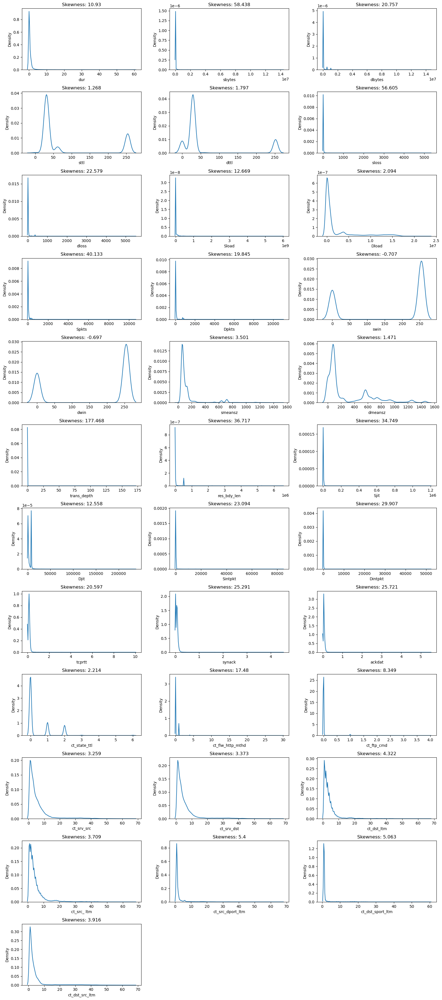

In [19]:
t = 1
plt.figure(figsize=(16,36))
for i in num_cols:
    plt.subplot(12,3,t)
    sns.distplot(data[i],hist=False)
    plt.title(f"Skewness: {round(data[i].skew(),3)}")
    t += 1
plt.tight_layout()
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

# **Inferences from the respective Distplots:**

## **Network Traffic Distribution Analysis** 

### **Connection**
| Feature | Distribution | Typical Pattern | Outliers |
|---------|--------------|-----------------|----------|
| `dur` | Heavy right-skew | Short durations | Few long sessions |
| `sbytes/dbytes` | Extreme right-skew | Small transfers | Rare high volumes |
| `Sload/Dload` | Right-skew | Low network loads | High-value spikes |
| `Spkts/Dpkts` | Extreme right-skew | Few packets | High-packet bursts |

### **Network Quality**
| Feature | Distribution | Typical Pattern | Outliers |
|---------|--------------|-----------------|----------|
| `sttl/dttl` | Moderate right-skew | Lower ranges | Longer paths |
| `sloss/dloss` | Heavy right-skew | Minimal loss | High loss events |
| `swin/dwin` | Slight left-skew | Max size approach | Stable traffic |
| `Sjit/Djit` | Right-skew | Low jitter | Latency spikes |

### **Protocol & Transactions**
| Feature | Distribution | Typical Pattern | Significance |
|---------|--------------|-----------------|--------------|
| `trans_depth` | Extreme right-skew | Shallow depths | Rare deep transactions |
| `res_bdy_len` | Heavy right-skew | Empty responses | Somerge pay`loads |
| `ct_*` metrics | Right-skew | Simple patterns | Complex interactions |

## **Key Insights**:
- **Majority features show right-skewed distributions**
- **Normal traffic: short, simple, low-volume patterns**
- **Outliers suggest potential anomalies/attacks**
- **Stable baseline with distinct deviation patterns**

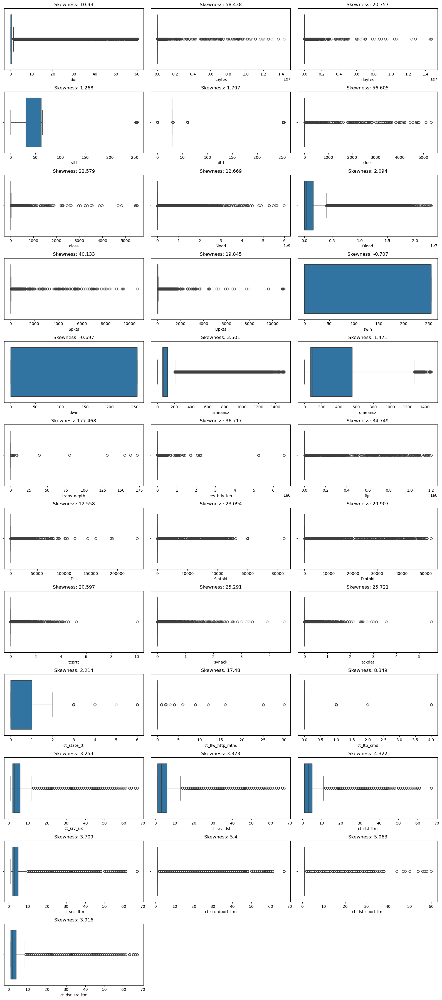

In [20]:
t = 1
plt.figure(figsize=(16,36))
for i in num_cols:
    plt.subplot(12,3,t)
    sns.boxplot(data[i],orient='h')
    plt.title(f"Skewness: {round(data[i].skew(),3)}")
    t += 1
plt.tight_layout()
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

# **Network Traffic Analysis: BoxPlot Inferences**

## Network Duration and Bytes
* **dur**: Most durations are **clustered at low values**, with **many outliers at high values**, indicating **occasional long-duration connections**.
* **sbytes and dbytes**: **Skewed towards low values**, with **significant outliers** for high data transfer, suggesting **occasional large data flows**.

## Time-to-Live and Packet Loss
* **sttl and dttl**: **Distributed in lower ranges** with a few **higher outliers**, indicating **most TTL values are short-lived**.
* **sloss and dloss**: **Low packet loss** for most connections, with **rare higher loss**, suggesting **generally stable connections**.

## Load and Packet Metrics
* **Sload and Dload**: **Concentrated at low load values**, with **outliers at high values**, indicating **occasional heavy loads in some sessions**.
* **Spkts and Dpkts**: **Few packets per flow** in most cases, but **some sessions with high packet counts**, likely due to **larger flows or abnormal traffic**.

## Window and Packet Size
* **swin and dwin**: **TCP window sizes show minimal variability**, indicating **stable window sizes across sessions**.
* **smeansz and dmeansz**: **Small packet sizes are typical**, with some **large packets as outliers**.

## Transaction and Response Metrics
* **trans_depth**: Majority have **low transaction depths**, with **some high-depth connections**, possibly indicating **complex sessions**.
* **res_bdy_len**: **Many connections lack response bodies**, with **some outliers** having **large response lengths**.

## Jitter and Timing
* **Sjit and Djit**: **Low jitter is common**, with **high outliers**, indicating **stable connections with occasional delays**.
* **Sintpkt and Dintpkt**: **Short inter-packet intervals** for most connections, with some sessions experiencing **larger intervals**, potentially from **bursty or delayed traffic**.
* **tcprtt, synack, and ackdat**: **Low round-trip times and acknowledgment delays** are typical, with **some high-latency connections**.

## Connection States and Methods
* **ct_state_ttl**: Most connections have **few TTL states**, with **outliers showing more state transitions**.
* **ct_flw_http_mthd and ct_ftp_cmd**: **Low HTTP and FTP commands** for most flows, with **occasional high-command flows**.

## Service and Connection Patterns
* **ct_srv_src and ct_srv_dst**: **Service source and destination counts are generally low**, with some **high interactions** indicating **frequent service usage**.
* **ct_dst_ltm, ct_src_ltm, ct_src_dport_ltm, ct_dst_sport_ltm, and ct_dst_src_ltm**: **Low values are typical**, but **some flows involve multiple unique sources, destinations, or ports**, suggesting **complex connection patterns**.

## Key Observation
* These boxplots show that **most features are highly skewed**, with **outliers** indicating **rare but extreme behaviors**, potentially corrsponding to `attacks or anomalies`.


### ***`Categorical Analysis`***

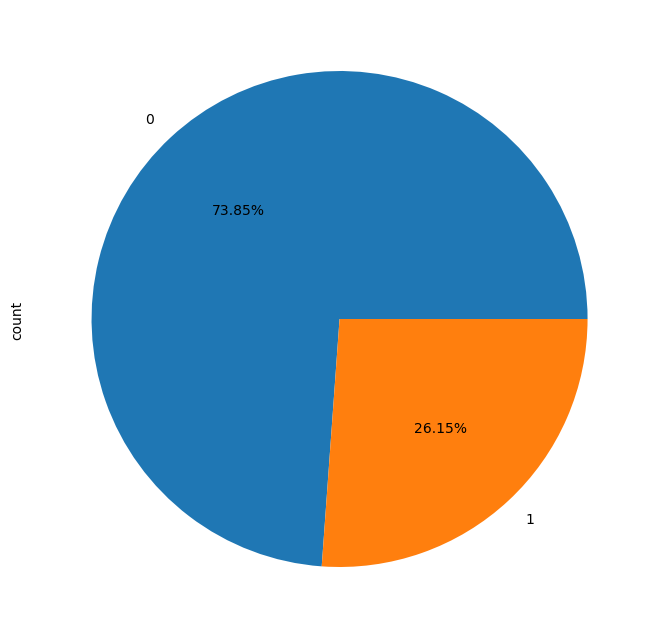

In [21]:
# Let's explore the Target Column 'Label'
plt.figure(figsize=(8,10))
(data['Label'].value_counts()).plot(kind='pie',autopct='%.2f%%')
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Insights from the Pie Chart:**
    
The Label column shows that **73.85%** of the data represents `normal (non-attack)` instances, while **26.15%** represents `attack instances`. This indicates a **moderate class imbalance, with non-attack data being more prevalent than attack data**.

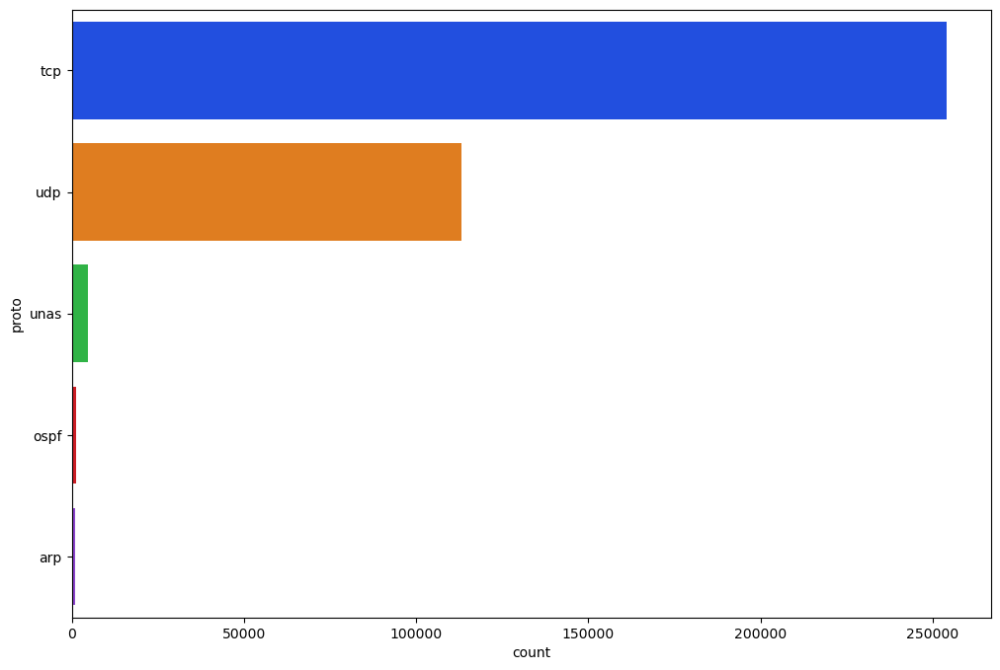

In [22]:
# Get the top 5 values in 'proto'
top_5_proto = data['proto'].value_counts().sort_values(ascending=False).head(5).index

# Filter the data to include only the top 5 protocols
filtered_data = data[data['proto'].isin(top_5_proto)]

# Plot
plt.figure(figsize=(12,8))
sns.countplot(data=filtered_data, y='proto', palette='bright', order=top_5_proto)
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Insights for the column `proto`:**
* **TCP (254,062):** **Dominates traffic**, indicating it’s **widely used for connections** but may also be **targeted by attacks like SYN floods**.
* **UDP (113,231):** Common for applications **needing fast, connectionless** communication; its volume can signify **normal usage or DoS attacks**.
* **UNAS (4,765):** **Rarely seen**; **high counts** could suggest **unusual traffic and may signal an anomaly**.
* **OSPF (1,397):** Primarily for **internal routing**; spikes here might indicate misconfiguration or internal network issues.
* **ARP (962):** Used locally to **resolve IP to MAC addresses**; unusual increases could suggest **ARP spoofing attempts**.

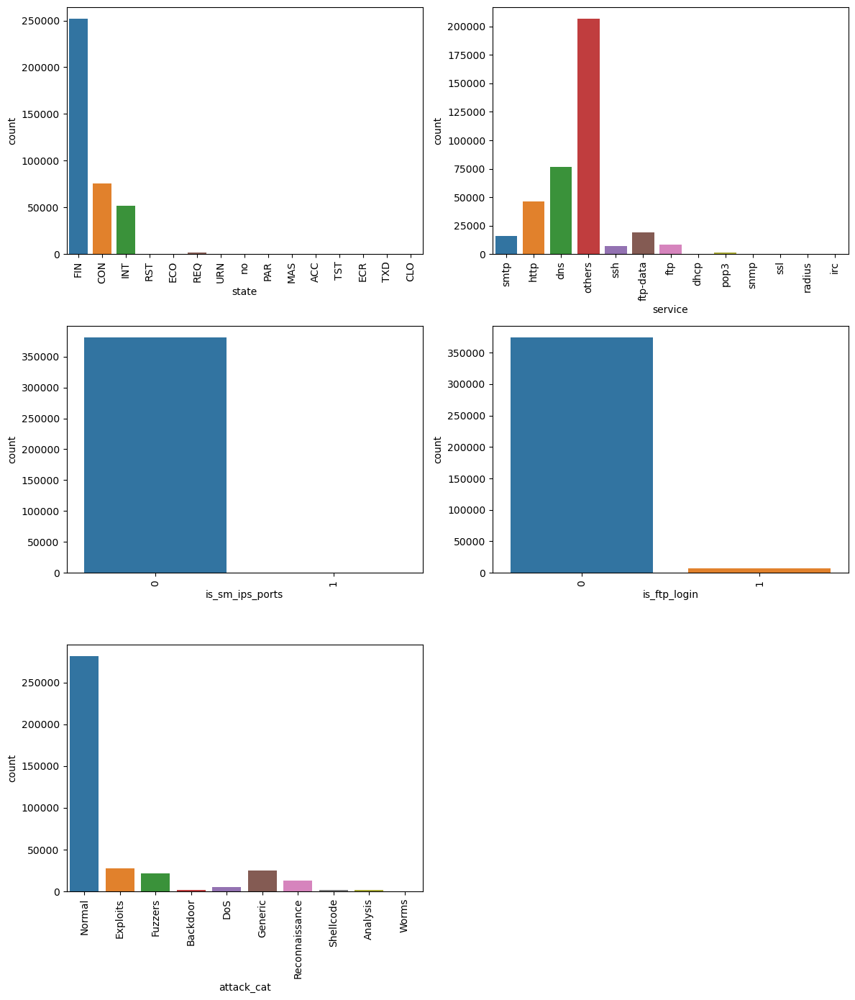

In [23]:
t = 1
plt.figure(figsize=(12,14))
for i in cat_cols:
    if i != 'proto' and i != 'Label':
        plt.subplot(3,2,t)
        sns.countplot(data=data,x=i,palette='tab10')
        plt.xticks(rotation=90)
        t += 1
plt.tight_layout()
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from Count Plots for Each Categorical Column in the UNSW-NB15 Dataset:**

- **state:** The **most common** connection states are `FIN, CON, and INT`, with `FIN` **being the most frequent**. This suggests that **most connections are completed**, while a **significant portion are in the `CON` state**, indicating **established connections**.

- **service:** Services categorized as **`others`** are the **most frequently occurring**, followed by `dns, http, and smtp`. This highlights **significant traffic involving non-standard services**, suggesting a **diverse application landscape**.

- **is_sm_ips_ports:** The **majority of entries** have a value of `0`, implying that **simultaneous source IP and destination port usage** is **uncommon**.

- **is_ftp_login:** **Most values** are `0`, indicating that **FTP login attempts are infrequent**. A small number have the value `1`, showing that **successful FTP logins are rare**.

- **attack_cat:** `Normal` traffic **dominates**, while `Exploits, Fuzzers, and Generic` are the **most frequent attack categories**. This suggests that **most traffic is benign**, with **specific attack types occurring more frequently**, showing an **imbalance in attack type distrbution**.
 dataset.


<div style="background-color: #FFEE77; padding: 10px;">

# ***`Bivariate Analysis`***

### **`Numerical vs Categorical`**

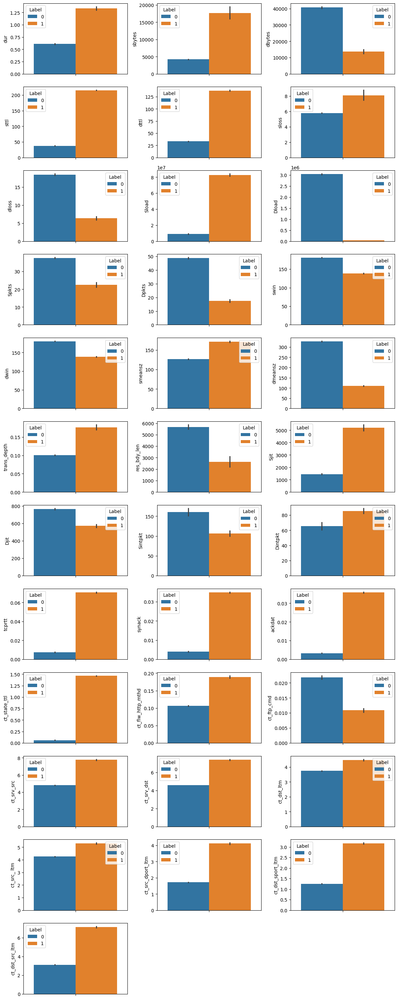

In [24]:
# Bivariate analysis between Label and numerical columns.
t=1
plt.figure(figsize=(12,30))
for i in num_cols:
    plt.subplot(12,3,t)
    sns.barplot(data=data,y=i,hue=data['Label'])
    t=t+1
plt.tight_layout()
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

## **Inferences from the Bivariate analysis between `Label` and `Numerical Columns`:**

**Duration (dur):**
Attack traffic has significantly longer durations.

**Inference:** Prolonged connections may indicate malicious activity.

**Source Bytes (sbytes):**
Higher byte count for attack instances.

**Inference:** Attack traffic tends to transfer more data from the source.

**Destination Bytes (dbytes):**
Normal traffic has a higher byte count.

**Inference:** Normal sessions may involve more balanced data exchanges.

**Source TTL (sttl) and Destination TTL (dttl):**
Higher TTL values for attack traffic.

**Inference:** Malicious traffic might use higher TTL values for extended reach.

**Source Loss (sloss) and Destination Loss (dloss):**
Attack traffic has higher packet loss on the source side, but lower on the destination.

**Inference:** Increased source-side loss could indicate aggressive data transfer attempts.

**Source Load (Sload) and Destination Load (Dload):**
Higher load values for attack traffic.

**Inference:** Attack traffic tends to be heavier on both source and destination sides.

**Source Packets (Spkts) and Destination Packets (Dpkts):**
Normal traffic shows a higher packet count.

**Inference:** Normal traffic involves more frequent packet exchanges.

**Source Window (swin) and Destination Window (dwin):**
Higher window size for normal traffic.

**Inference:** Normal sessions might use larger window sizes for stable data flow.

**Mean Source Packet Size (smeansz) and Mean Destination Packet Size (dmeansz):**
Larger packet sizes in attack traffic.

**Inference:** Attack sessions may send larger packets for efficient payload delivery.

**TCP Round Trip Time (tcprtt), SYN-ACK (synack), and ACK-DAT (ackdat):**
Higher values for attack traffic.

**Inference:** Increased connection setup times might indicate malicious attempts.

**FTP Command Count (ct_ftp_cmd):**
Higher count in attack traffic.

**Inference:** Attack traffic might involve more FTP commands.

**Service Count Features (ct_srv_src, ct_srv_dst):**
Higher counts in attack traffic.

**Inference:** Malicious traffic often targets specific services repeatedly.

**Flow Count Features (ct_dst_ltm, ct_src_ltm, ct_src_dport_ltm, ct_dst_sport_ltm):**
Higher flow counts for attack instances.

**Inference:** Attack traffic tends to involve repetitive flows to the same destination.

**HTTP Method Count (ct_flw_http_mthd):**
Higher for attack traffic.

**Inference:** Malicious sessions may involve more HTTP methods like GET and POST.

**State of the connection (ct_state_ttl):** Category '1' typically involves fewer states compared to category '0'

#### **Summary:**

Attack traffic generally shows higher values for source-side metrics, packet sizes, and round-trip times, while normal traffic tends to have higher destination-side metrics and balanced data flow.
These differences provide useful indicators for distinguishing between normal and malicious sessions.

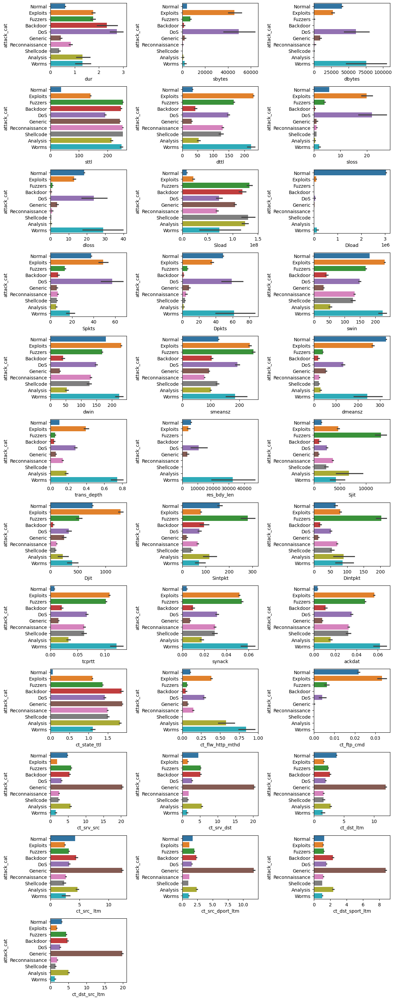

In [25]:
# Bivariate analysis between attack_cat and numerical columns.
t=1
plt.figure(figsize=(12,30))
for i in num_cols:
    plt.subplot(12,3,t)
    sns.barplot(data=data,x=i,y=data['attack_cat'],hue=data['attack_cat'])
    t=t+1
plt.tight_layout()
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

## **Inferences from the Bivariate analysis between `attack_cat` and `Numerical Columns`:**

### **Duration (dur):**
- **Normal:** Consistently short durations, indicative of routine traffic.
- **Attack:** Longer durations in categories like DoS, suggesting malicious persistence.

### **Source and Destination Bytes (sbytes, dbytes):**
- **Normal:** Higher balance of destination bytes, typical of regular downloads.
- **Attack:** Higher source bytes in categories like Exploits and Fuzzers, indicating intrusive activities.

### **Transaction Times (sttl, dttl):**
- **Normal:** Longer, secure transaction times.
- **Attack:** Shorter times, typical of transient, malicious attempts.

### **Packet Loss (sloss, dloss):**
- **Normal:** Lower packet loss.
- **Attack:** Higher packet loss in DoS, possibly from network congestion tactics.

### **Load Metrics (sload, dload):**
- **Normal:** Lower load values.
- **Attack:** Higher loads in DoS, indicative of overwhelming activities.

### **Packet Counts (spkts, dpkts):**
- **Normal:** Higher counts, reflecting substantial data exchanges.
- **Attack:** Lower and more targeted packet counts.

### **Down/Up Ratio (dwin):**
- **Normal:** Higher ratios, suggesting balanced flows.
- **Attack:** Manipulated ratios in attacks to disrupt communications.

### **Packet Sizes and Timing (smeansz, dmeansz):**
- **Normal:** Larger and less frequent packets.
- **Attack:** Smaller, more frequent packets for quick exploitation.

### **Complex Interactions (trans_depth, res_bdy_len):**
- **Normal:** Indicative of significant legitimate interactions.
- **Attack:** Minimal values, just enough for attack execution.

### **Timing Irregularities (sjit, sintpkt, dintpkt):**
- **Normal:** More regular timing patterns.
- **Attack:** Irregular patterns to disrupt or evade detection.

### **Connection Setup (synack, ackdat):**
- **Normal:** Longer setup times for secure connections.
- **Attack:** Shorter times, indicative of rapid, automated attack processes.

### **FTP Commands (ct_ftp_cmd):**
- **Normal:** Less prevalent.
- **Attack:** Presence in attack traffic for exploiting FTP vulnerabilities.

### **Connection Metrics (ct_srv_src, ct_srv_dst, ct_dst_ltm, ct_src_ltm):**
- **Normal:** Higher counts to the same services and destinations, reflecting habitual use.
- **Attack:** Less frequent connections focusing on quick exploitation.

### **HTTP Methods (ct_flw_http_mthd):**
- **Normal:** Lower counts.
- **Attack:** Higher counts in attempts to execute multiple HTTP requests.

### **Connection States (ct_state_ttl):**
- **Normal:** More states, indicating richer interactions.
- **Attack:** Fewer state changes, aiming for quick exploitation.

#### **Summary:**
- **Normal:** Exhibits sustained, secure, and balanced network behavior.
- **Attack:** Demonstrates quick, intensive, and minimal interaction metrics, crucial for security threat identification.

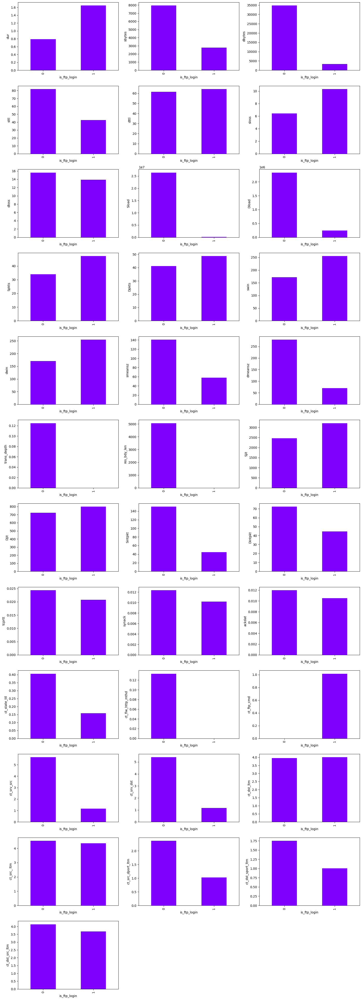

In [26]:
# Bivariate analysis between is_ftp_login and numerical columns.
t = 1
plt.figure(figsize=(16,44))
for i in num_cols:
    plt.subplot(12,3,t)
    filtered_data.groupby(by='is_ftp_login')[i].mean().plot(kind='bar',colormap='rainbow')
    plt.ylabel(i)
    t += 1
plt.tight_layout()
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

## **Inferences from the Bivariate analysis between `is_ftp_login` and `Numerical Columns`:**

### **General Observations:**
* The presence of FTP login (`is_ftp_login = 1`) typically shows reduced values across various metrics compared to no FTP login (`is_ftp_login = 0`). This suggests that FTP login sessions are less demanding in terms of network resources or involve less complex interactions.

### **Specific Metrics:**

**Duration (dur):**
* **No FTP Login:** Exhibits longer durations.
* **FTP Login:** Features shorter durations, indicating quicker sessions.

**Source and Destination Bytes (sbytes, dbytes):**
* **No FTP Login:** Higher byte counts, indicating more data transfer.
* **FTP Login:** Lower byte counts, suggesting more streamlined data transfer sessions.

**Packet Counts (spkts, dpkts):**
* **No FTP Login:** Higher packet counts, suggesting more active network communication.
* **FTP Login:** Reduced packet counts, indicating fewer exchanges or simpler data transfers.

**Load Metrics (sload, dload):**
* **No FTP Login:** Higher loads, reflecting heavier data transfer activities.
* **FTP Login:** Lower loads, aligning with the simpler session characteristics.

**Window Size (swin, dwin):**
* **No FTP Login:** Larger window sizes, typically needed for more extensive data transfers.
* **FTP Login:** Smaller window sizes, possibly due to less complex or fewer data requirements.

**Errors and Retransmissions (sloss, dloss, retrans):**
* **No FTP Login:** More errors and retransmissions, possibly due to more complex or problematic sessions.
* **FTP Login:** Fewer errors and retransmissions, suggesting smoother data transmission.

**Packet Size and Interval Metrics (smeansz, dmeansz, sintpkt, dintpkt):**
* **No FTP Login:** Larger packet sizes and more varied intervals.
* **FTP Login:** Smaller packet sizes and intervals, indicative of less variability and possibly more controlled transfers.

**Jitter (sjit, djit):**
* **No FTP Login:** Higher jitter, which could reflect more complex or variable network conditions.
* **FTP Login:** Lower jitter, aligning with the notion of more straightforward and uninterrupted sessions.

**Connection Counts and Setup Times (ct_state_ttl, ct_srv_src, ct_srv_dst, synack, ackdat):**
* **No FTP Login:** Greater connection counts and longer setup times, indicating more elaborate connections.
* **FTP Login:** Fewer connection counts and quicker setups, reflective of more routine or less involved interactions.

### **Summary:**
- FTP login sessions are generally associated with less intensive use of network resources, reflecting a possibly more standardized or routine nature of these sessions compared to non-FTP login traffic, which might involve more varied and resource-intensive activities.

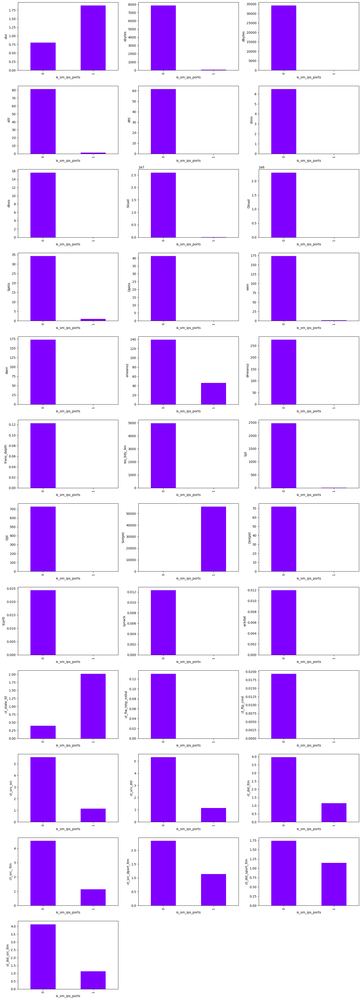

In [27]:
# Bivariate analysis between is_sm_ips_ports and numerical columns.
t = 1
plt.figure(figsize=(16,44))
for i in num_cols:
    plt.subplot(12,3,t)
    filtered_data.groupby(by='is_sm_ips_ports')[i].mean().plot(kind='bar',colormap='rainbow')
    plt.ylabel(i)
    t += 1
plt.tight_layout()
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

## **Inferences from the Bivariate analysis between `is_sm_ips_ports` and `Numerical Columns`:**

### **General Observations:**
- The variable `is_sm_ips_ports` likely indicates whether the same source IP and port are used for multiple sessions. When this feature is '1', indicating that the same source IP and port are reused, several network metrics show significantly lower values compared to when this feature is '0'.

### **Specific Metrics:**

**Duration (dur):**
* **No Same IP/Port Reuse (`0`):** Longer durations, suggesting more extended sessions.
* **Same IP/Port Reuse (`1`):** Shorter durations, indicating quicker or less complex sessions.

**Source and Destination Bytes (sbytes, dbytes):**
* **No Same IP/Port Reuse (`0`):** Higher byte counts, reflecting more data transfer per session.
* **Same IP/Port Reuse (`1`):** Drastically lower byte counts, possibly indicating more routine or smaller scale transactions.

**Packet Counts (spkts, dpkts):**
* **No Same IP/Port Reuse (`0`):** More packets transmitted, aligning with longer and possibly more complex sessions.
* **Same IP/Port Reuse (`1`):** Fewer packets, suggesting streamlined sessions possibly due to repeat interactions.

**Load Metrics (sload, dload):**
* **No Same IP/Port Reuse (`0`):** Greater load values, implying heavier network usage.
* **Same IP/Port Reuse (`1`):** Reduced load, supporting the notion of less intensive network use during these sessions.

**Window Size (swin, dwin):**
* **No Same IP/Port Reuse (`0`):** Larger window sizes, necessary for handling more extensive data transfers.
* **Same IP/Port Reuse (`1`):** Smaller windows, perhaps due to fewer or simpler data requirements.

**Errors and Retransmissions (sloss, dloss, retrans):**
* **No Same IP/Port Reuse (`0`):** Higher rates of errors and retransmissions, indicating potentially problematic sessions.
* **Same IP/Port Reuse (`1`):** Lower error rates, hinting at smoother transactions possibly due to the familiarity of the network path.

**Packet Size and Interval Metrics (smeansz, dmeansz, sintpkt, dintpkt):**
* **No Same IP/Port Reuse (`0`):** Larger sizes and more varied intervals, typical of diverse session types.
* **Same IP/Port Reuse (`1`):** Smaller sizes and more consistent intervals, likely reflecting more standardized session patterns.

**Jitter (sjit, djit):**
* **No Same IP/Port Reuse (`0`):** Higher jitter, possibly due to more varied or complex interactions.
* **Same IP/Port Reuse (`1`):** Lower jitter, consistent with simpler or more repetitive communications.

**Connection Counts and Setup Times (ct_state_ttl, ct_srv_src, ct_srv_dst, synack, ackdat):**
* **No Same IP/Port Reuse (`0`):** More extensive connection metrics, indicating a broader range of interactions.
* **Same IP/Port Reuse (`1`):** Reduced metrics, suggesting a narrower scope of network activity, often limited to repeated interactions with known entities.

### **Summary:**
* The reuse of the same IP and port (`is_sm_ips_ports = 1`) typically correlates with less complex, quicker, and potentially more routine network sessions compared to when each session uses unique IPs and ports (`is_sm_ips_ports = 0`), which are characterized by more extensive, varied, and intensive network interactions.

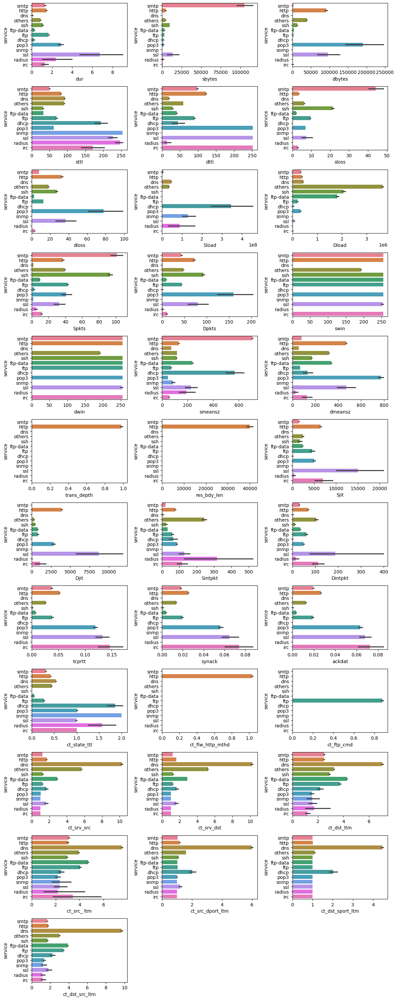

In [28]:
# Bivariate analysis between service and numerical columns.
t=1
plt.figure(figsize=(12,30))
for i in num_cols:
    plt.subplot(12,3,t)
    sns.barplot(data=data,x=i,y=data['service'],hue=data['service'])
    t=t+1
plt.tight_layout()
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

## **Inferences from the Bivariate analysis between `service` and `Numerical Columns`:**

### **General Observations:**
- The bar graphs compare network traffic characteristics across different server types like SMTP, HTTP, DNS, FTP, and others. The metrics span duration, bytes transferred, packet counts, load, window sizes, jitter, connection setup times, and more.

### **Specific Metrics:**

**Duration (dur):**
* **SMTP:** Generally shorter durations.
* **HTTP:** Moderate durations.
* **DNS:** Shows relatively longer durations compared to others.

**Bytes Transferred (sbytes, dbytes):**
* **FTP:** High byte counts, likely due to data transfer inherent to the protocol.
* **HTTP:** Also shows significant byte counts, corresponding to content-heavy sessions.

**Transaction Times (sttl, dttl):**
* **DNS:** Longer transaction times, which might be due to resolution times.
* **SMTP, HTTP:** Shorter transaction times indicating quicker processing.

**Packet Loss and Load (sloss, dloss, sload, dload):**
* **FTP:** Notable for higher losses and loads, indicative of intense data transfer sessions.
* **SMTP, HTTP:** Moderate values reflecting their operational uses.

**Packet Counts and Window Sizes (spkts, dpkts, swin, dwin):**
* **FTP:** High packet counts and larger window sizes.
* **Others:** Varying counts and sizes, typically lower than FTP.

**Connection Setup and Maintenance (synack, ackdat, tcprtt):**
* **SMTP:** Lower setup times, suggesting efficient connections.
* **HTTP:** Similar trends with relatively quick setups.

**Connection Counts (ct_srv_src, ct_srv_dst, ct_dst_ltm, ct_src_ltm):**
* **FTP, SMTP:** High counts, possibly due to repeated interactions within sessions.
* **Others:** Lower counts, indicating less frequent interactions or more singular session connections.

**Specialized Metrics (ct_ftp_cmd, ct_flw_http_mthd):**
* **FTP:** High command counts as expected.
* **HTTP:** Noticeable HTTP method counts, aligning with the protocol's operational characteristics.

### **Summary:**
* The various metrics shed light on the distinct nature of network traffic for different server types. FTP often shows higher metrics related to data transfers and connection intensity, while SMTP and HTTP show quicker setups and moderate load levels. DNS sessions exhibit longer durations and transaction times, indicative of the resolution processes involved. Each server type demonstrates unique patterns that reflect their specific network behaviors and requirements.

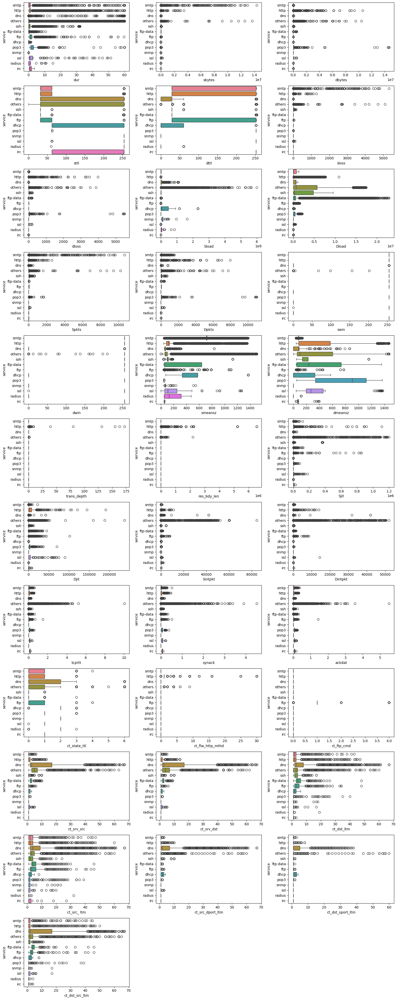

In [29]:
# Box Plot between service and numerical columns.
t = 1
plt.figure(figsize=(16,40))
for i in num_cols:
    plt.subplot(12,3,t)
    sns.boxplot(data=data,x=i,y='service',hue='service')
    t += 1
plt.tight_layout()
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Key Inferences from Box Plot between `service` with `Numerical Columns`:**

**dur (Duration):**
   * `HTTP` and `SMTP` services have higher duration values compared to other services, indicating potentially long sessions or connections.
   * `DNS` and `SNMP` services have relatively low duration values, suggesting shorter connections.

**sbytes & dbytes (Source and Destination Bytes):**
   * `SMTP` and `FTP-control` have high source and destination byte values, suggesting large data transfers.
   * `HTTP` has moderate data transfer values, while `DNS` and `SNMP` services show low byte values.

**Sload & Dload (Source and Destination Load):**
   * `SMTP` has the `highest source and destination load` values, indicating high data throughput. `FTP-control` also shows elevated load values.
   * Services like `DNS` and `IRC` have low load values, indicating minimal data transfer.

**Spkts & Dpkts (Source and Destination Packets):**
   * `SMTP` and `FTP-control` show high counts of source and destination packets, aligning with larger data flows.
   * `DNS` and `SNMP` have lower packet counts, indicating lighter traffic.

**swin & dwin (Source and Destination Window Sizes):**
   * `FTP-control` has high source and destination window sizes, with significant variability, suggesting it handles larger windows for data flow.
   * `SMTP` also shows moderate values, while other services have lower or negligible window sizes.

**tcprtt (TCP Round-Trip Time):**
   * `SMTP` and `FTP-control` services show higher TCP round-trip times, indicating longer response times, possibly due to large data or heavy connections.
   * `DNS` has very low round-trip times, showing faster response interactions.

**trans_depth (Transaction Depth):**
   * `HTTP` and `FTP-data` have high transaction depths, indicating deeper transactional communication, potentially involving multiple requests.
   * Other services, like `DNS`, show minimal transaction depth.

**ct_state_ttl (State TTL Count):**
   * `HTTP` and `FTP-data` services have higher TTL counts, indicating more state transitions or interactions within a single connection.
   * `DNS` and `IRC` have lower TTL counts, showing fewer state changes.

**ct_flw_http_mthd (HTTP Methods Count):**
   * `HTTP` service shows higher `HTTP` method counts, indicating its primary involvement in web traffic.
   * Other services, including `SMTP` and `DNS`, show zero or minimal HTTP methods.

**ct_srv_src & ct_srv_dst (Service Source and Destination Count):**
   * `HTTP`, `SMTP`, and `FTP-control` show high counts for both service sources and destinations, implying these services connect to diverse sources         and destinations.
   * Services like `DNS` and `SNMP` have lower source and destination counts, indicating fewer interactions.

**ct_src_ltm & ct_dst_ltm (Source and Destination Latency Times):**
   * `SMTP` and `FTP-control` services exhibit high latency times, with numerous outliers, reflecting longer connection times.
   * `DNS` and `IRC` show lower latency times, indicating shorter and faster sessions.

These inferences indicate that `SMTP, HTTP, and FTP`-control services are involved in more intensive, high-volume data flows with longer durations and higher packet counts, while services like `DNS and SNMP` are characterized by shorter, lower-volume connections.

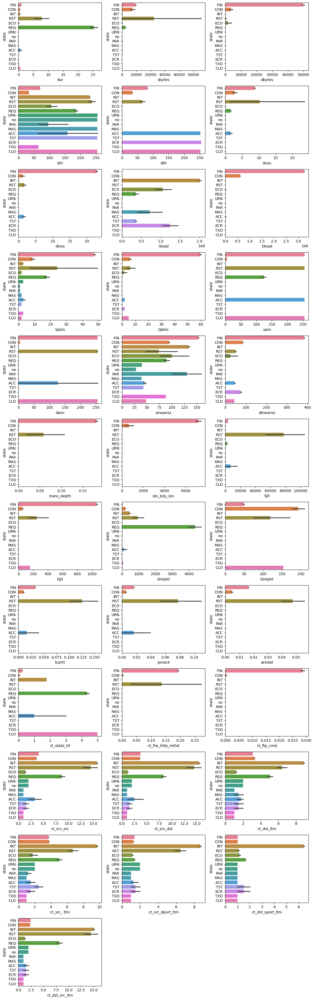

In [30]:
# Bivariate analysis between state and numerical columns.
t=1
plt.figure(figsize=(12,38))
for i in num_cols:
    plt.subplot(12,3,t)
    sns.barplot(data=data,x=i,y=data['state'],hue=data['state'])
    t=t+1
plt.tight_layout()
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

## **Inferences from the Bivariate analysis between `state` and `Numerical Columns`:**

### **General Observations:**
- The bar graphs present network traffic metrics across different TCP connection states like `FIN`, `CON`, `INT`, `RST`, `ECO`, `REQ`, `PAR`, `MAS`, `ACC`, `TST`, `TXD`, `CLR`, and `CLO`. These states reflect various stages or types of connections within a network, influencing the traffic patterns observed.

### **Specific Metrics:**
**Duration (dur) and Bytes Transferred (sbytes, dbytes):**
* **FIN:** Generally shows shorter durations and lower byte counts, indicating termination phases of connections.
* **CON:** Longer durations and higher byte counts, typical of established, ongoing connections.

**Transaction Times (sttl, dttl):**
* **CON, INT:** Longer transaction times, indicating active interactions.
* **FIN, RST:** Shorter transaction times, aligning with closing or resetting connections.

**Packet Loss and Load (sloss, dloss, sload, dload):**
* **REQ, PAR:** Higher loss and load, suggesting intensive data transfer or problematic connections.
* **FIN, CLR:** Lower metrics, indicative of less active or closing stages.

**Packet Counts and Window Sizes (spkts, dpkts, swin, dwin):**
* **CON, MAS:** High packet counts and larger window sizes, associated with bulk data transfer or extensive communication sessions.
* **CLO, FIN:** Lower counts and sizes, corresponding to termination or less intense communication phases.

**Jitter and Timing Metrics (sjit, djit, sintpkt, dintpkt):**
* **MAS, TST:** Higher jitter and varied packet intervals, possibly due to complex or specialized traffic patterns.
* **ACC, CLR:** Lower jitter, reflecting more streamlined or concluding activities.

**Connection Setup and Maintenance (synack, ackdat, tcprtt):**
* **INT, CON:** Longer times for setup, typical of initial connection establishments.
* **FIN, RST:** Quick or negligible setup times, aligning with connection teardowns.

**Specialized Commands and Method Counts (ct_ftp_cmd, ct_flw_http_mthd):**
* **ACC, MAS:** Noticeable counts, likely reflecting specific control or command sessions.
* **FIN, CLR:** Minimal counts, as these states are less likely to involve complex commands.

**Connection Count Metrics (ct_srv_src, ct_srv_dst, ct_dst_ltm, ct_src_ltm, ct_src_dport_ltm, ct_dst_sport_ltm, ct_state_ttl):**
* **CON, INT:** Higher connection counts, indicating frequent or sustained interactions.
* **FIN, RST:** Lower counts, typical of transient or concluding interactions.

### **Summary:**
* The traffic metrics vary significantly across TCP connection states, reflecting the distinct nature of network behaviors in each state. States associated with active connections (like `CON` and `INT`) show higher metrics indicative of ongoing data transfers and interactions, while states related to the conclusion or reset of connections (like `FIN` and `RST`) display lower metrics, indicative of reduced activity or the closure of sessions.

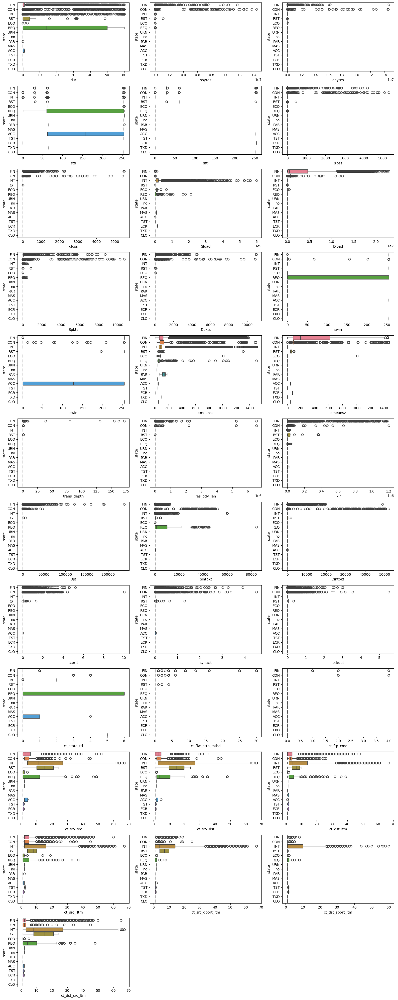

In [31]:
# Box Plot between state and numerical columns.
t = 1
plt.figure(figsize=(16,40))
for i in num_cols:
    plt.subplot(12,3,t)
    sns.boxplot(data=data,x=i,y='state',hue='state')
    t += 1
plt.tight_layout()
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Key Inferences from Box Plot between `state` with `Numerical Columns`:** 

* **dur (Duration):** `FIN` and `CON` states show the highest range of durations, with `CON` extending beyond 30 seconds. Other states, such as `REQ` and `ACC`, have shorter durations.

* **sbytes & dbytes (Source and Destination Bytes):** `CON` and `FIN` states have the highest source and destination byte values, indicating higher data transfer volumes. States like `REQ`, `RST`, and `INT` show lower byte values.

* **Sload & Dload (Source and Destination Load):** `CON` state displays the highest source and destination load, followed by `FIN`, suggesting that `CON` is associated with higher data throughput. `REQ` and `ACC` have low load values.

* **Spkts & Dpkts (Source and Destination Packets):** `CON` and `FIN` states have the largest source and destination packet counts, indicating higher packet transmission. Other states, such as `REQ` and `ACC`, show minimal packet counts.

* **swin & dwin (Source and Destination Window Sizes):** `FIN` and `CON` states show variability in source and destination window sizes, with `FIN` having a large interquartile range in `dwin`. Other states generally have smaller window sizes.

* **tcprtt (TCP Round-Trip Time):** `CON` and `FIN` states exhibit a wide range of round-trip times, with significant outliers in `tcprtt`. Other states show minimal or zero round-trip time values.

* **ct_state_ttl (State TTL Count):** `CON` and `FIN` states show higher TTL count values, with `FIN` having the widest distribution. `REQ` and `ACC` show lower TTL counts, suggesting fewer transitions.

* **ct_srv_src & ct_srv_dst (Service Source and Destination Count):** `CON` and `FIN` states have high service source and destination counts, suggesting frequent connections to various sources and destinations. Other states, like `REQ` and `ACC`, have lower counts.

These inferences highlight key behaviors associated with specific states, such as `CON` and `FIN`, which exhibit higher data transfer and packet counts, as well as a broader distribution of other network features.

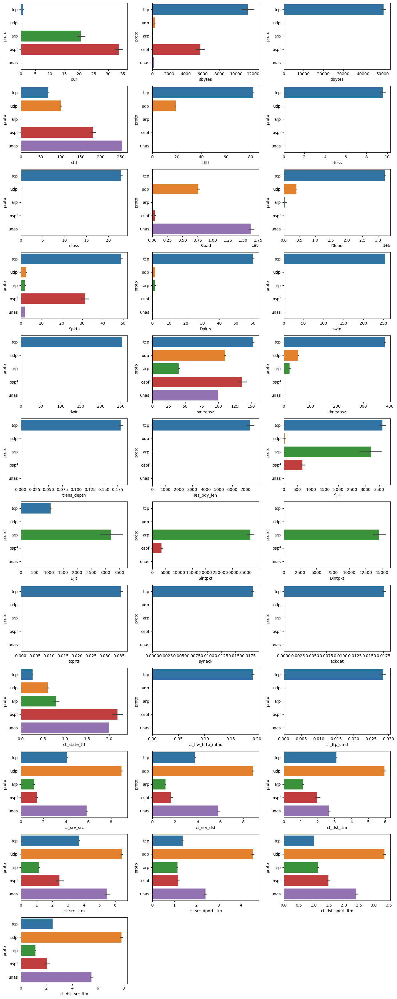

In [32]:
# Bivariate analysis between proto and numerical columns.
t = 1
plt.figure(figsize=(14,35))
for i in num_cols:
    plt.subplot(12,3,t)
    sns.barplot(data=filtered_data,x=i,y='proto',hue='proto')
    t += 1
plt.tight_layout()
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

## **Inferences from the Bivariate analysis between `proto` and `Numerical Columns`:**

### **General Observations:**
- The bar graphs compare various network metrics across different protocols, such as TCP (`tcp`), UDP (`udp`), ARP (`arp`), OSPF (`ospf`), and other unspecified (`unas`) protocols. These metrics include duration, bytes transferred, packet counts, load, window sizes, and other network parameters.

### **Specific Metrics:**
**Duration (dur) and Bytes Transferred (sbytes, dbytes):**
* **TCP:** Shows the highest byte counts and moderate durations, suggesting heavy data transfer activities.
* **UDP:** Lower byte counts and durations, indicative of its connectionless nature.
* **ARP:** Minimal activity in terms of bytes and duration, as expected for a protocol primarily used for network address resolution.

**Transaction Times (sttl, dttl):**
* **TCP:** Longer transaction times, appropriate for reliable connections.
* **UDP:** Shorter times, reflecting its faster, less reliable transfer characteristics.

**Packet Loss and Load (sloss, dloss, sload, dload):**
* **TCP:** Higher losses and load, aligning with its use in data-intensive applications.
* **UDP:** Lower values, due to less overhead and lighter protocol structure.

**Packet Counts and Window Sizes (spkts, dpkts, swin, dwin):**
* **TCP:** High packet counts and larger window sizes, supporting robust and continuous data flow.
* **UDP:** Less emphasis on window size, as it does not use window-based flow control.

**Jitter and Timing Metrics (sjit, djit, sintpkt, dintpkt):**
* **TCP:** Exhibits some jitter and varied packet intervals, possibly due to retransmissions and flow control mechanisms.
* **OSPF:** Very low jitter, indicating its usage primarily in routing updates with predictable timing.

**Connection Setup and Maintenance (synack, ackdat, tcprtt):**
* **TCP:** Significant connection setup times, necessary for establishing reliable sessions.
* **UDP:** No connection setup metrics, as UDP does not establish connections.

**Specialized Commands and Method Counts (ct_ftp_cmd, ct_flw_http_mthd):**
* **TCP:** Notable command counts, likely due to FTP or HTTP sessions running over TCP.
* **ARP, OSPF:** Minimal or no command counts, as these protocols do not handle application-layer commands.

**Connection Count Metrics (ct_srv_src, ct_srv_dst, ct_dst_ltm, ct_src_ltm, ct_src_dport_ltm, ct_dst_sport_ltm, ct_state_ttl):**
* **TCP:** Higher connection counts across various metrics, indicating frequent reuse and interactions.
* **UDP:** Lower connection counts, consistent with transient, non-persistent interactions.

### **Summary:**
* The visualization underscores the functional distinctions between TCP, UDP, ARP, OSPF, and other protocols, reflecting their specific roles and behaviors in network communications. TCP dominates in metrics that reflect robustness and reliability, whereas UDP shows its efficiency and speed with lower overhead metrics. ARP and OSPF, being more specialized, show minimal activity in general traffic metrics but are critical for network infrastructure stability.

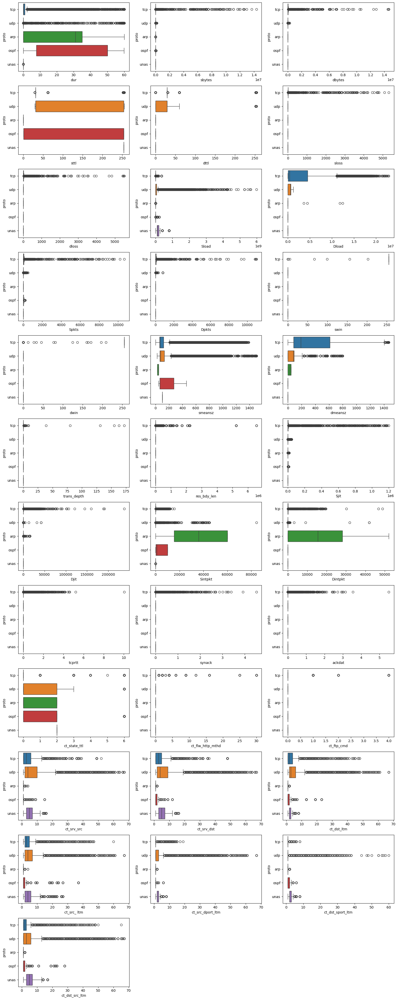

In [33]:
# Box Plot between proto and numerical columns.
t = 1
plt.figure(figsize=(16,40))
for i in num_cols:
    plt.subplot(12,3,t)
    sns.boxplot(data=filtered_data,x=i,y='proto',hue='proto')
    t += 1
plt.tight_layout()
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Key Inferences from Box Plot between `proto` and `Numerical Columns`:**

* **dur (Duration):** `tcp` has the widest range of durations, while `udp` has moderate durations. `ospf` and `unas` generally have shorter durations.

* **sbytes & dbytes (Source and Destination Bytes):** `tcp` and `udp` exhibit high values for both source and destination bytes, with `tcp` having the highest values. `ospf` and `unas` have minimal byte values.

* **Sload & Dload (Source and Destination Load):** `tcp` shows the highest source and destination load, indicating high data transmission rates. `udp` has moderate load, while `ospf` and `unas` have very low loads.

* **Spkts & Dpkts (Source and Destination Packets):** `tcp` has the highest count of source and destination packets, with `udp` following. Other protocols, especially `ospf` and `unas`, have minimal packet counts.

* **swin & dwin (Source and Destination Window Sizes):** `tcp` shows considerable variability in both source and destination window sizes, with many outliers, while other protocols have minimal values.

* **tcprtt (TCP Round-Trip Time):** `tcp` exhibits the highest range of round-trip times, with numerous outliers, indicating variability in connection quality or latency.

* **ct_state_ttl (State TTL Count):** `tcp` and `udp` show higher values, indicating multiple TTL states, while other protocols have lower counts.

* **ct_flw_http_mthd (HTTP Methods Count):** `tcp` has the highest count of HTTP methods, indicating it’s predominantly used in HTTP-related traffic, while other protocols show minimal counts.

* **ct_srv_src & ct_srv_dst (Service Source and Destination Count):** `tcp` and `udp` have a wide range of service counts, suggesting these protocols are associated with more diverse sources and destinations compared to others.

These selected insights provide a high-level understanding of key protocol behaviors in the dataset, particularly highlighting `tcp` and `udp` as the most active and variable in terms of data volume and packet transmission.

### **`Categorical vs Categorical`**

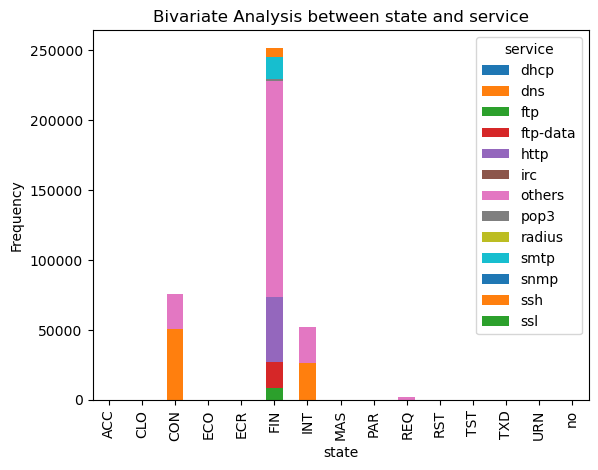

In [34]:
# Bivariate Analysis between state and service
crosstab = pd.crosstab(data['state'], data['service'])
crosstab.plot(kind='bar', stacked=True)
plt.title("Bivariate Analysis between state and service")
plt.xlabel("state")
plt.ylabel("Frequency")
plt.legend(title="service")
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from the Stacked Bar Plot between `state` and `service`:**

- **FIN, CON, and INT States:** The **majority of records** are in the `FIN, CON, and INT` states, with `FIN` **being significantly higher**. This suggests that **these states are commonly associated with network traffic** in this dataset.

- **Services in FIN:** The `FIN` state shows a **high frequency of multiple services**, including `http, ftp-data, and others`. This indicates that **these protocols are heavily present in standard or potentially benign traffic**.

- **Service Distribution:** States like `INT and CON` show a **mix of services** but with **fewer types than FIN**. For instance, **`INT and CON` have significant activity** for `dns and others`.

- **Rare States and Services:** States like `ACC, CLO, ECO, ECR, PAR, REC, RST, TXD, URN`, etc., have **very low frequencies** and are mostly associated with **fewer services**, possibly indicating **less common or specific network activities**.

- **Anomalous Traffic Indicators:** The **high frequency of certain services within particular states** (e.g., `others` in `FIN`) could indicate **patterns that are either normal or potentially unusual**, relevant for **anomaly detection**.

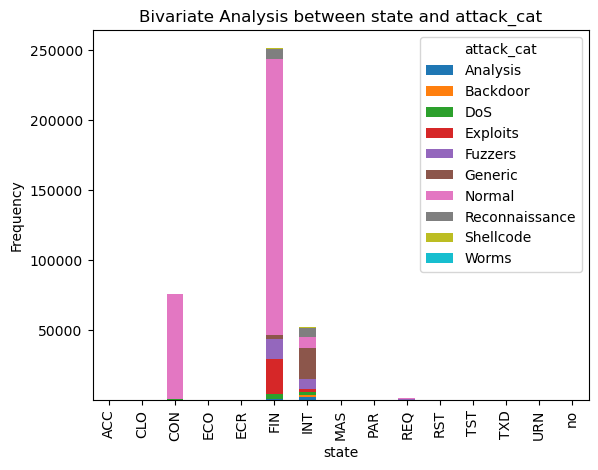

In [35]:
# Bivariate Analysis between state and attack_cat
crosstab = pd.crosstab(data['state'], data['attack_cat'])
crosstab.plot(kind='bar', stacked=True)
plt.title("Bivariate Analysis between state and attack_cat")
plt.xlabel("state")
plt.ylabel("Frequency")
plt.legend(title="attack_cat")
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from the Stacked Bar Plot between `state` and `attack_cat`:**

- **FIN State with Predominantly Normal Traffic:** The `FIN` state has the **highest frequency** and is **mostly associated** with `Normal activity`, suggesting that **most completed connections are   benign**. However, some attacks like `Exploits and Fuzzers` also occur here, indicating that **even completed connections may sometimes carry malicious intent**.

- **INT State with High Attack Diversity:** The `INT (Interrupted)` state shows a **mix of attack types**, including `Exploits, DoS, Reconnaissance, and Shellcode`. This suggests that **interrupted connections could indicate malicious activity**, potentially from **scans, interrupted attacks, or network disruptions** caused by intrusion attempts.

- **CON State Showing Normal and Worm Activity:** The `CON (Connection)` state **contains a mix** of `Normal activity and Worms`, implying that **persistent connections may occasionally host malware infections, like worms**, which aim to spread by **maintaining active connections**.

- **Summary:** While `FIN` is mostly **benign**, `INT and CON` states show a **greater association with various attacks**, indicating they could be **focal points for identifying potential intrusions**.

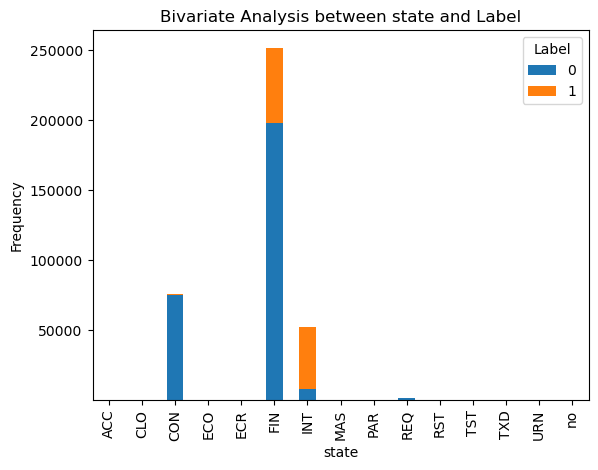

In [36]:
# Bivariate Analysis between state and Label
crosstab = pd.crosstab(data['state'], data['Label'])
crosstab.plot(kind='bar', stacked=True)
plt.title("Bivariate Analysis between state and Label")
plt.xlabel("state")
plt.ylabel("Frequency")
plt.legend(title="Label")
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from the Stacked Bar Plot between `state` and `Label`:**

**Dominant States:**
* The `FIN` state has the **highest frequency**, containing both `Label 0 (non-anomalous)` and `Label 1 (anomalous)` cases, with `Label 0` being **much more frequent**.
* `CON and INT` states also have **significant frequencies**.

**Anomalous States (Label 1):**
* `FIN and INT` states show notable `Label 1` occurrences, suggesting these states are **more likely to contain anomalies**.
* Other states show **minimal `Label 1` occurrences**, indicating they are **less associated with anomalies**.

**Rare States:**
* States such as `ACC, CLO, ECR, PAR, REC, RST, TST, TXD, URN` have **very low frequencies** and almost **no `Label 1` occurrences**, suggesting they are **less relevant for anomaly detection** in this dataset.

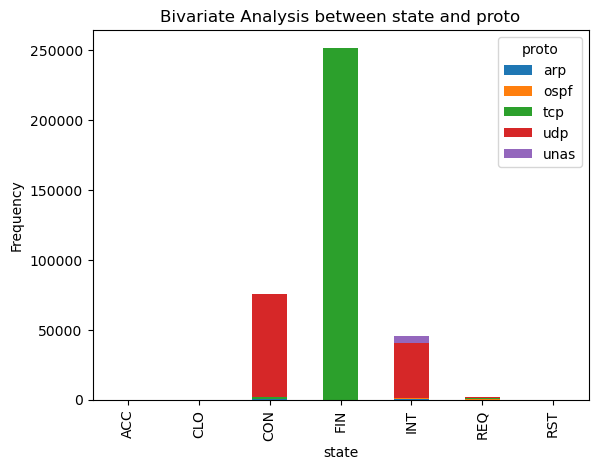

In [37]:
# Bivariate Analysis between state and proto
crosstab = pd.crosstab(filtered_data['state'], filtered_data['proto'])
crosstab.plot(kind='bar', stacked=True)
plt.title("Bivariate Analysis between state and proto")
plt.xlabel("state")
plt.ylabel("Frequency")
plt.legend(title="proto")
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from the Stacked Bar Plot between `state` and `proto`:**

**Protocol Dominance in States:**
* The `FIN` state is **predominantly associated** with the `tcp` protocol, showing a **significantly higher frequency** than other state-protocol combinations.
* The `CON` state is **mostly linked** with the `udp` protocol.

**State with Multiple Protocols:**
* The `INT` state has a **mix of protocols**, primarily `udp`, with **minor contributions** from `unas and tcp`, indicating a **more diverse protocol usage** in this state.

**Less Frequent States:**
* States like `ACC, CLO, REO, and RST` have **minimal occurrences** and **limited protocol diversity**, indicating **lower relevance** in the dataset.

**Rare Protocols:**
* `arp, ospf, and unas` protocols **appear infrequently** across all states, suggesting they are **less common** in this dataset.

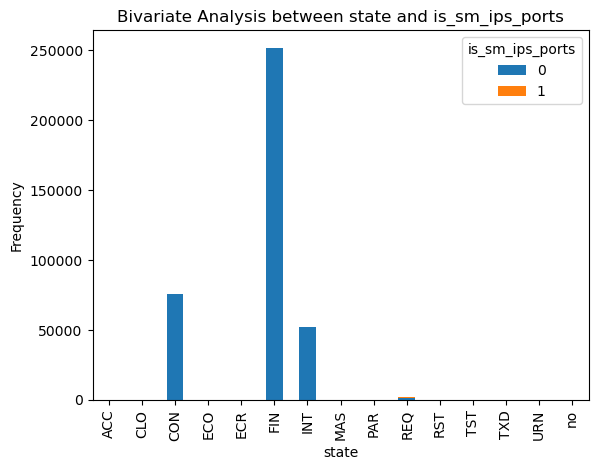

In [38]:
# Bivariate Analysis between state and is_sm_ips_ports
crosstab = pd.crosstab(data['state'], data['is_sm_ips_ports'])
crosstab.plot(kind='bar', stacked=True)
plt.title("Bivariate Analysis between state and is_sm_ips_ports")
plt.xlabel("state")
plt.ylabel("Frequency")
plt.legend(title="is_sm_ips_ports")
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from the Stacked Bar Plot between `state` and `is_sm_ips_ports`**

* **FIN State Dominance:** The `FIN` state has the **highest frequency overall**, indicating many records where a connection was **completed with the "Finish" flag**.

* **Low Contribution of `is_sm_ips_ports = 1`:** The orange portion **(representing `is_sm_ips_ports = 1`)** is almost **negligible** across all states, suggesting that **connections involving specific small IP ports are rare**.

* **Significant State Counts:** Other states like `CLO and INT` also have **notable counts**, with nearly all associated with **`is_sm_ips_ports = 0`**.

* **Minor State Representation:** States such as `PAR, REC, RST, and TST` have **very low frequencies**, indicating these **connection states are rare**.

This visualization highlights that **most connections do not involve small IP ports**, and certain states **dominate the dataset in frequency**.

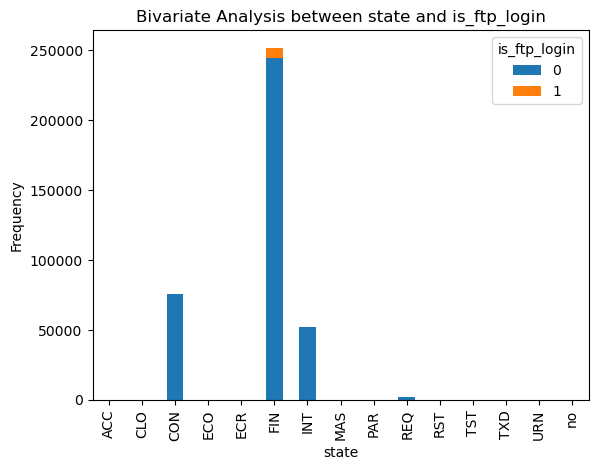

In [39]:
# Bivariate Analysis between state and is_ftp_login
crosstab = pd.crosstab(data['state'], data['is_ftp_login'])
crosstab.plot(kind='bar', stacked=True)
plt.title("Bivariate Analysis between state and is_ftp_login")
plt.xlabel("state")
plt.ylabel("Frequency")
plt.legend(title="is_ftp_login")
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from the Stacked Bar Plot between `state` and `is_ftp_login`:**

* **FIN State Dominance:** The `FIN` state has the **highest frequency**, indicating a large portion of connections **ended with the "Finish" flag**.

* **Predominance of `is_ftp_login = 0`:** The **majority of records** across all states have **`is_ftp_login = 0`**, suggesting that **FTP login attempts are rare**.

* **Minimal FTP Login Occurrences:** There are very **few instances** of `is_ftp_login = 1`. A **small number** of connections in the `FIN` state show `is_ftp_login = 1`, but these are **negligible** compared to the total.

* **Other States with Low Counts:** Similar to `FIN`, other states like `CLO and INT` also have records, but **none show significant activity** in terms of FTP logins.

This plot highlights that **most connections do not involve FTP login** attempts, and the **majority of connection states** are associated with **`is_ftp_login = 0`**.

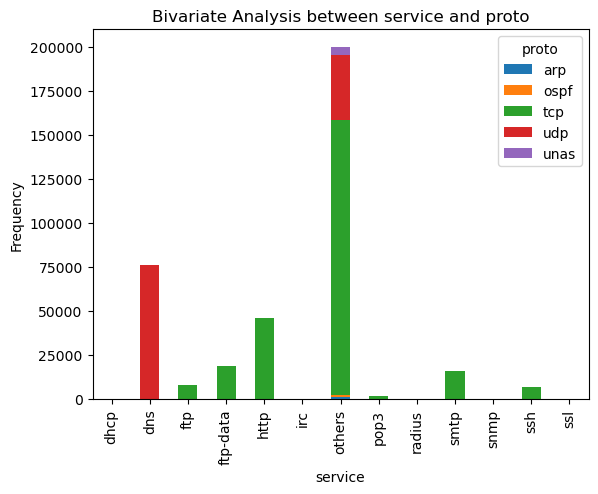

In [40]:
# Bivariate Analysis between service and proto
crosstab = pd.crosstab(filtered_data['service'], filtered_data['proto'])
crosstab.plot(kind='bar', stacked=True)
plt.title("Bivariate Analysis between service and proto")
plt.xlabel("service")
plt.ylabel("Frequency")
plt.legend(title="proto")
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from the Stacked Bar Plot between `service` and `proto`:**

**Protocol Distribution Across Services:**
* `others` service has the **highest frequency** and is **primarily associated** with the `tcp and udp` protocols, with some **minor presence** of `unas`.
* The `dns` service is **mainly associated** with the `udp` protocol and has a **high frequency**, indicating **frequent DNS requests using UDP**.

**Service-Protocol Associations:**
* `http, ftp, ftp-data, and smtp` services are **primarily associated** with the `tcp` protocol, suggesting **TCP’s suitability** for these services.

**Less Frequent Services:**
* Services like `pop3, radius, snmp, dhcp, and ssl` have **low frequencies**, indicating they are **less common** in the dataset.

**Miscellaneous Services:**
* The `others` category has **significant usage** of both `tcp and udp`, indicating that it **encompasses a variety of protocols and services** that do not fall into specific categories listed.

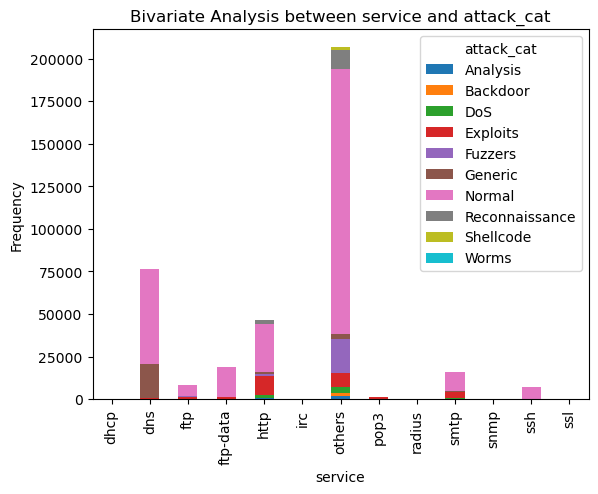

In [41]:
# Bivariate Analysis between service and attack_cat
crosstab = pd.crosstab(data['service'], data['attack_cat'])
crosstab.plot(kind='bar', stacked=True)
plt.title("Bivariate Analysis between service and attack_cat")
plt.xlabel("service")
plt.ylabel("Frequency")
plt.legend(title="attack_cat")
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from the Stacked Bar Plot between `service` and `attack_cat`:**

**Dominance of others Service:**
* The `others` category has the **highest frequency**, indicating that many connections had **unspecified or uncommon services**. Most of these connections are **associated** with `Fuzzers attacks`.

**Service-Specific Attack Patterns:**
* **DNS:** This service shows a **high frequency** of `Generic attacks`, with **minor occurrences** of `DoS, Fuzzers, and Exploits attacks`.
* **HTTP:** The `HTTP` service has a more **diverse distribution**, with **notable occurrences** of `Exploits, Reconnaissance, Generic, and Fuzzers attacks`, showing that it's a **common target** for various attack types.
* **FTP and FTP-Data:** These services exhibit a mix of `Fuzzers, Backdoor, and Exploits attacks`, indicating they are **commonly targeted** for vulnerability exploitation.

**Low-Frequency Services:**
* Services like `dhcp, radius, smtp, snmp, ssh, and ssl` have **very low frequencies**, indicating **minimal usage** or targeting in this dataset.

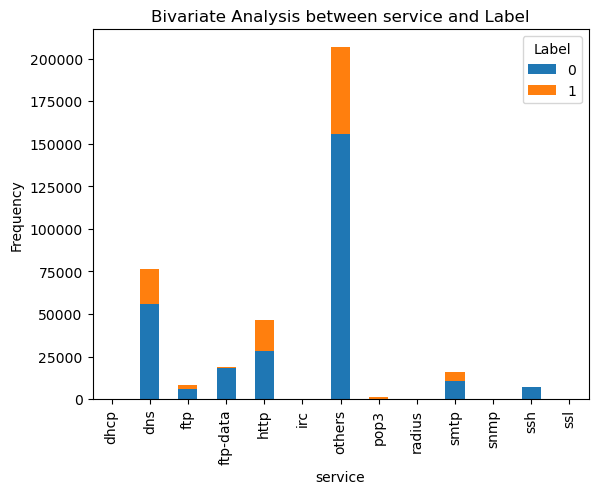

In [42]:
# Bivariate Analysis between service and Label
crosstab = pd.crosstab(data['service'], data['Label'])
crosstab.plot(kind='bar', stacked=True)
plt.title("Bivariate Analysis between service and Label")
plt.xlabel("service")
plt.ylabel("Frequency")
plt.legend(title="Label")
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from the Stacked Bar Plot between `service` and `Label`:**

* **Others Category:** The `others` category has the **highest frequency**, with both `normal (Label = 0)` and `attack (Label = 1)` instances. This indicates that many records, including both normal and attack types, fall under services not specified individually.

* **DNS, HTTP, and FTP:** Services like `dns, http, and ftp` have **significant frequencies** with a notable proportion of both `normal and attack` instances, suggesting that attacks often target these common services.

* **Low-Frequency Services:** Categories like `dhcp, pop3, radius, smtp, snmp, ssh, and ssl` have relatively **low frequencies**, with most instances labeled as normal. These services are less commonly associated with attacks in this dataset.

* **Summary:** **Attacks are concentrated** in common services `(like DNS, HTTP, and FTP)`, while more specific services are **predominantly normal**. The `others` category also includes a **significant portion** of both `normal and attack` traffic.

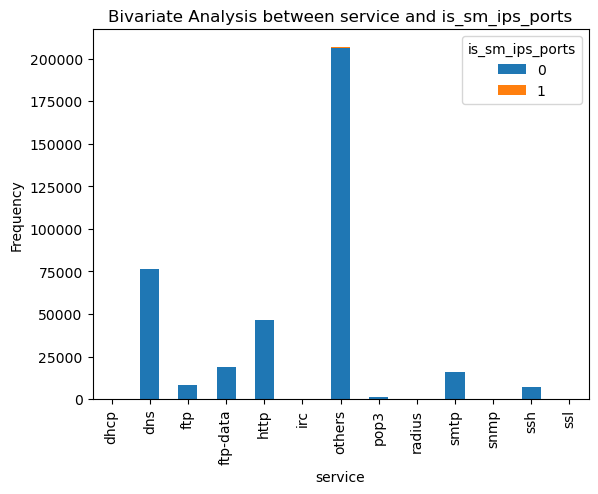

In [43]:
# Bivariate Analysis between service and is_sm_ips_ports
crosstab = pd.crosstab(data['service'], data['is_sm_ips_ports'])
crosstab.plot(kind='bar', stacked=True)
plt.title("Bivariate Analysis between service and is_sm_ips_ports")
plt.xlabel("service")
plt.ylabel("Frequency")
plt.legend(title="is_sm_ips_ports")
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from the Stacked Bar Plot between `service` and `is_sm_ips_ports`:**

* **Others Category:** The `others` service category has the **highest frequency**, with nearly all instances having `is_sm_ips_ports set to 0`. This suggests that the majority of unspecified services do not involve specific small IP ports.

* **Common Services (DNS, HTTP):** Services such as `dns and http` have a relatively **high frequency** but almost exclusively have `is_sm_ips_ports set to 0`. This indicates that small IP ports are generally not used in these common services.

* **Low-Frequency Services:** Services like `ftp, ftp-data, smtp and ssh` show very **few instances**, with **almost none** having `is_sm_ips_ports set to 1`.

* **Summary:** **Small IP ports are rarely involved across all service types**, with `others, dns, and http` being the **most frequent** services without small IP port usage.

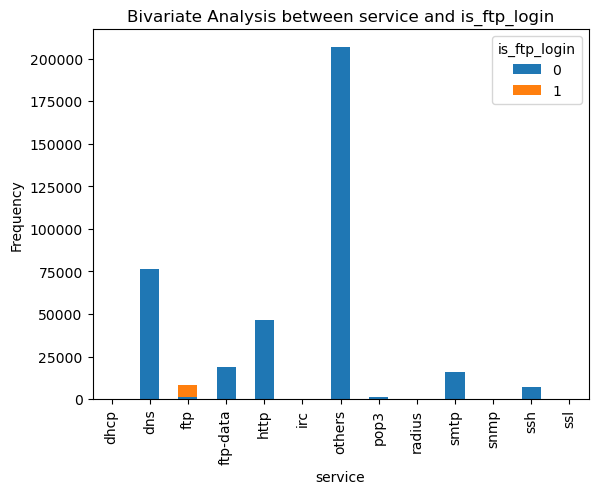

In [44]:
# Bivariate Analysis between service and is_ftp_login
crosstab = pd.crosstab(data['service'], data['is_ftp_login'])
crosstab.plot(kind='bar', stacked=True)
plt.title("Bivariate Analysis between service and is_ftp_login")
plt.xlabel("service")
plt.ylabel("Frequency")
plt.legend(title="is_ftp_login")
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from the Stacked Bar Plot between `service` and `is_ftp_login`:**

**FTP Service** (`ftp`):
* A **small proportion** of **FTP traffic** has **`is_ftp_login` = 1** (highlighted in orange), indicating **FTP login activity**.
* **Most FTP traffic** has **`is_ftp_login` = 0**, meaning no login activity in the majority of cases.

**Dominant Services**:
* **`others`**, **`dns`**, and **`http`** are the **most frequent services** in the dataset.
* All traffic for these services has **`is_ftp_login` = 0**, implying no FTP login activity.

**Service Distribution**:
* The **`others`** category has the **highest frequency**, followed by **`dns`** and **`http`**.
* **FTP-related services** (`ftp` and `ftp-data`) show a relatively **low frequency** in the dataset.

**Summary**: **FTP login activity** (where **`is_ftp_login` = 1**) is **only observed in FTP traffic**, and even then, it is **infrequent**. **Other services** such as **`dns`, `http`, and `others`** do not exhibit FTP login activity.

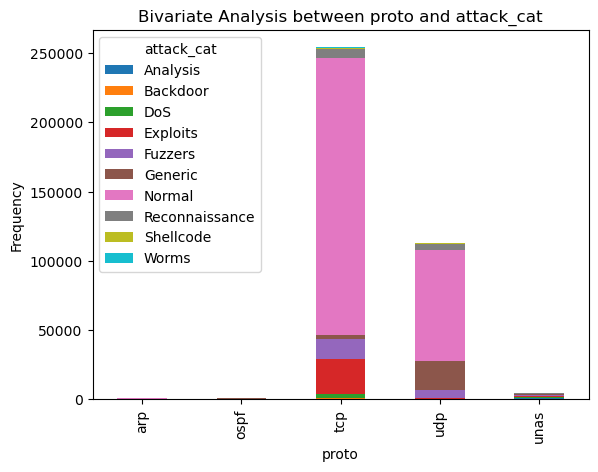

In [45]:
# Bivariate Analysis between proto and attack_cat
crosstab = pd.crosstab(filtered_data['proto'], filtered_data['attack_cat'])
crosstab.plot(kind='bar', stacked=True)
plt.title("Bivariate Analysis between proto and attack_cat")
plt.xlabel("proto")
plt.ylabel("Frequency")
plt.legend(title="attack_cat")
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from Stacked Bar Plot between `proto` and `attack_cat`:**

1. **TCP Protocol**:
   - **TCP** is the **most frequently used protocol** in the dataset.
   - **Attack Categories**: TCP traffic has significant occurrences across multiple attack categories, with high frequencies in **Fuzzers**, **Reconnaissance**, and **Exploits**.
   - There is also a notable **Normal** category presence, indicating that a substantial amount of TCP traffic is not associated with attacks.

2. **UDP Protocol**:
   - **UDP** is the **second most common protocol**.
   - **Attack Categories**: Similar to TCP, UDP traffic has major occurrences in **Fuzzers**, **Generic**, and **Reconnaissance** categories.
   - A smaller portion of **Normal** traffic is also present under UDP, but it's less frequent than in TCP.

3. **Other Protocols**:
   - **`arp`**, **`ospf`**, and **`unas`** are very **infrequent** compared to TCP and UDP.
   - **`unas`** has some presence in **Generic** and **Backdoor** attack categories, but it is minimal.

**Summary**: **TCP and UDP** are the primary protocols in this dataset, with **TCP** having the highest diversity across attack categories, particularly in **Fuzzers**, **Reconnaissance**, and **Exploits**. **Other protocols** have very limited usage and are mostly associated with specific attack categories.

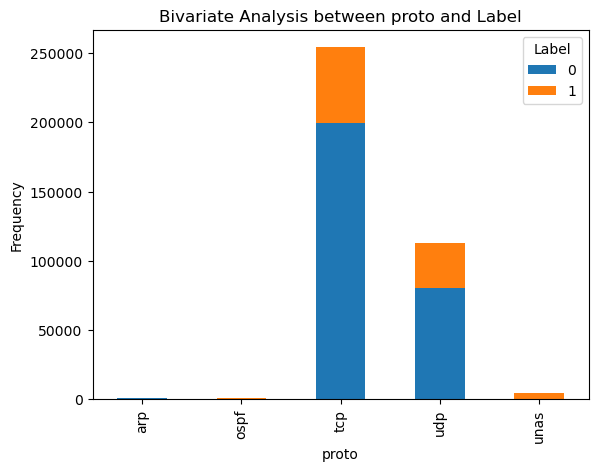

In [46]:
# Bivariate Analysis between proto and Label
crosstab = pd.crosstab(filtered_data['proto'], filtered_data['Label'])
crosstab.plot(kind='bar', stacked=True)
plt.title("Bivariate Analysis between proto and Label")
plt.xlabel("proto")
plt.ylabel("Frequency")
plt.legend(title="Label")
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from the Stacked Bar Plot between `proto` and `Label`:**

* **TCP Dominance:** The `tcp` protocol has the **highest frequency**, both in `normal (Label 0) and malicious (Label 1)` traffic, indicating that `TCP` is the **most commonly** used protocol in the dataset.

* **UDP Protocol:** The `udp` protocol also shows a **notable frequency** but is **less prevalent** than `TCP`. Both `normal and malicious` traffic are **observed** in `UDP` as well, though with **fewer instances compared** to `TCP`.

* **Low Frequencies for Other Protocols:** Protocols like `arp, ospf, and unas` have **very low frequencies**. They are **primarily associated** with `normal` traffic, with **minimal or no** instances of `malicious` traffic.

* **Malicious Traffic Distribution:** While both `TCP and UDP` carry `malicious` traffic, `TCP` has a **higher volume** of `malicious` instances compared to `UDP`, suggesting that `TCP`-based **attacks are more common** in this dataset.

* **Summary:** These inferences highlight the **protocol distribution** and the prevalence of `TCP`-based traffic in both `normal and malicious` categories, which can guide the focus of **intrusion detection efforts** on `TCP and UDP` traffic.

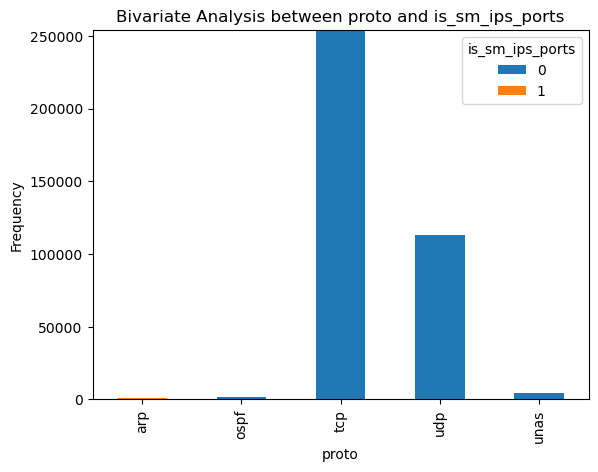

In [47]:
# Bivariate Analysis between proto and is_sm_ips_ports
crosstab = pd.crosstab(filtered_data['proto'], filtered_data['is_sm_ips_ports'])
crosstab.plot(kind='bar', stacked=True)
plt.title("Bivariate Analysis between proto and is_sm_ips_ports")
plt.xlabel("proto")
plt.ylabel("Frequency")
plt.legend(title="is_sm_ips_ports")
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from Stacked Bar Plot between `proto` and `is_sm_ips_ports`:**

**TCP Protocol**:
* **TCP** has the **highest frequency** among all protocols.
* Almost all **TCP traffic** is associated with **`is_sm_ips_ports = 0`**, indicating that a **vast majority of TCP traffic does not involve specific source and destination ports** for IPs.

**UDP Protocol**:
* **UDP** is the **second most common protocol**.
* Similar to TCP, nearly all **UDP traffic** has **`is_sm_ips_ports = 0`**, showing that specific source and destination IP ports are rarely used in UDP traffic.

**Other Protocols**:
* **`arp`**, **`ospf`**, and **`unas`** have **minimal frequencies** compared to TCP and UDP.
* A small amount of **ARP traffic** has **`is_sm_ips_ports = 1`**, suggesting that, while rare, some ARP traffic does use specific IP ports.

**Summary**: **TCP and UDP** dominate the dataset, with the vast majority of both protocols showing **`is_sm_ips_ports = 0`**. This suggests that **most of the network traffic does not utilize specific IP ports**, especially in the more frequent protocols.

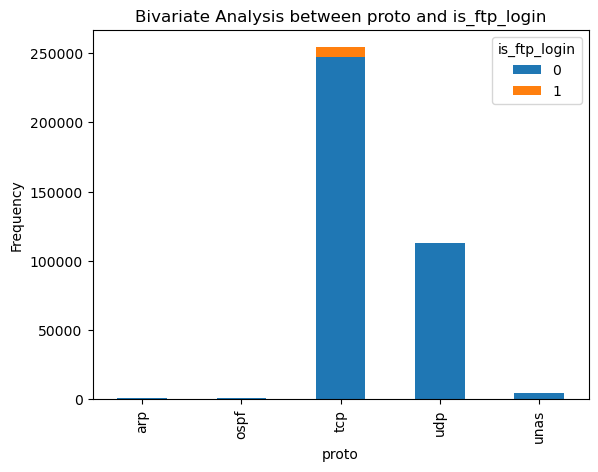

In [48]:
# Bivariate Analysis between proto and is_ftp_login
crosstab = pd.crosstab(filtered_data['proto'], filtered_data['is_ftp_login'])
crosstab.plot(kind='bar', stacked=True)
plt.title("Bivariate Analysis between proto and is_ftp_login")
plt.xlabel("proto")
plt.ylabel("Frequency")
plt.legend(title="is_ftp_login")
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from Stacked Bar Plot between `proto` and `is_ftp_login`:**

**TCP Dominance**: 
* The `TCP` protocol has the **highest frequency** among all protocols, with over **250,000** records.
* A small portion of these records involves `is_ftp_login = 1` (orange), indicating **limited FTP login attempts**.

**UDP Usage**:
* The `UDP` protocol has the **second-highest frequency**, though significantly lower than `TCP`.
* All `UDP` records have `is_ftp_login = 0`, suggesting **no FTP login activity** associated with this protocol.

**Minimal Records for Other Protocols**:
* Protocols like `ARP`, `OSPF`, and `UNAS` have very low frequencies, close to zero.
* None of these protocols show any records with `is_ftp_login = 1`, indicating no FTP login attempts on these protocols.

**FTP Login Exclusivity with TCP**:
* FTP login attempts (`is_ftp_login = 1`) are **exclusively associated** with the `TCP` protocol, highlighting `TCP` as the **primary protocol** for FTP login activity.

This plot indicates that the **TCP** protocol is **dominant and the only protocol associated with FTP login attempts**, while other protocols exhibit minimal or no FTP activity.

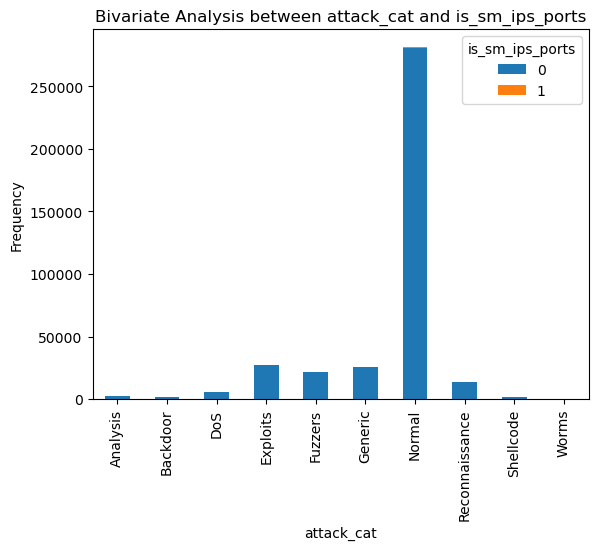

In [49]:
# Bivariate Analysis between attack_cat and is_sm_ips_ports
crosstab = pd.crosstab(data['attack_cat'], data['is_sm_ips_ports'])
crosstab.plot(kind='bar', stacked=True)
plt.title("Bivariate Analysis between attack_cat and is_sm_ips_ports")
plt.xlabel("attack_cat")
plt.ylabel("Frequency")
plt.legend(title="is_sm_ips_ports")
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from the Stacked Bar Plot between `attack_cat` and `is_sm_ips_ports`:**

* **Normal Traffic Dominance:** The `Normal` category has the **highest frequency**, with a significant **majority of occurrences** where `is_sm_ips_ports is 0`. This suggests that most `normal` traffic **does not involve** specific **small IP source or destination ports**.

* **Anomaly Categories:** Attack categories like `Exploits, Generic, and Fuzzers` have **notable frequencies**, but they are **much lower** than `Normal`. **Most attacks** also tend to have `is_sm_ips_ports set to 0`, indicating that **small IP source or destination ports are not commonly used across these attack types**.

* **Minor Usage of Small IP Ports:** Only a **small number** of instances in **each attack category** show `is_sm_ips_ports as 1`, which suggests that **small IP ports** are **rarely used** in both `normal and anomalous traffic`.

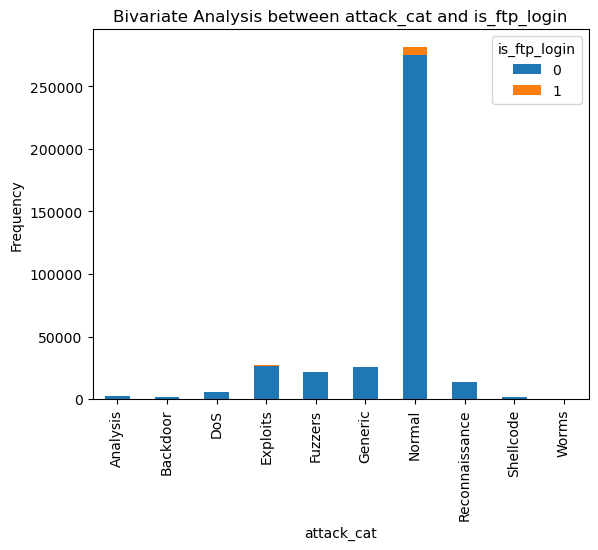

In [50]:
# Bivariate Analysis between attack_cat and is_ftp_login
crosstab = pd.crosstab(data['attack_cat'], data['is_ftp_login'])
crosstab.plot(kind='bar', stacked=True)
plt.title("Bivariate Analysis between attack_cat and is_ftp_login")
plt.xlabel("attack_cat")
plt.ylabel("Frequency")
plt.legend(title="is_ftp_login")
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from the Stacked Bar Plot between `attack_cat` and `is_ftp_login`:**

* **Normal Category:** The **majority of instances** are in the `Normal` category, with **most** having `is_ftp_login set to 0`, meaning that `FTP` login attempts are **rare in** `normal traffic`. There are, however, a **few instances** of `1` suggesting occasional `FTP` login activity.

* **Attack Categories:** Attack types such as `Exploits and Generic` have a **noticeable number** of occurrences, with `is_ftp_login` values primarily set to `0`. Very few attack instances involve any FTP login attempts.

* **Rare Categories:** Categories like `Analysis, Backdoor, Shellcode, and Worms` have very low frequencies, indicating they are **rare and typically do not** involve `FTP` login attempts.

* **Summary:** `FTP` login activity is **infrequent across** both `normal and attack` categories.

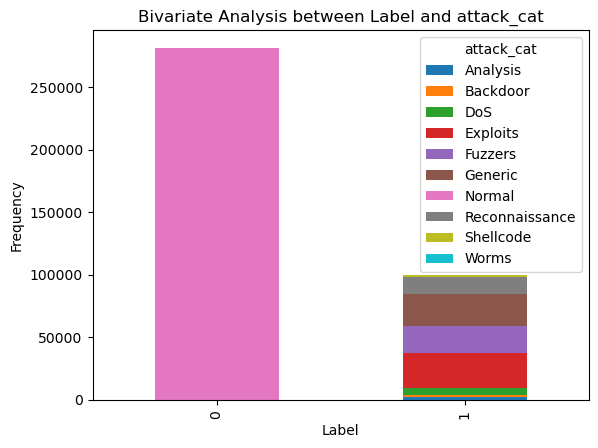

In [51]:
# Bivariate Analysis between Label and attack_cat
crosstab = pd.crosstab(data['Label'], data['attack_cat'])
crosstab.plot(kind='bar', stacked=True)
plt.title("Bivariate Analysis between Label and attack_cat")
plt.xlabel("Label")
plt.ylabel("Frequency")
plt.legend(title="attack_cat")
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from the Stacked Bar Plot between `Label` and `attack_cat`**

* **Dominance of Normal Traffic:** The **majority of the data** is labeled as `normal (Label 0)`, indicating a **significant portion** of the dataset consists of **benign traffic**.

* **Variety in Attack Types for Malicious Traffic:** For `Label 1`, **various attack categories are present**, with **notable frequencies** in categories such as `Exploits, Fuzzers, Reconnaissance, and Generic`.

* **High Frequency of Exploits:** Among the attack categories, `Exploits` has the **highest frequency**, suggesting it is a **common type of malicious activity** in this dataset.

* **Other Attack Types with Lower Frequencies:** Categories like `Analysis, Backdoor, Shellcode, and Worms` have much **lower frequencies**, indicating these attacks are **less common**.

These insights can help in understanding the **imbalance between** `normal and malicious` traffic and highlight the prevalence of specific attack types, which is valuable for model training and evaluation in intrusion detection.

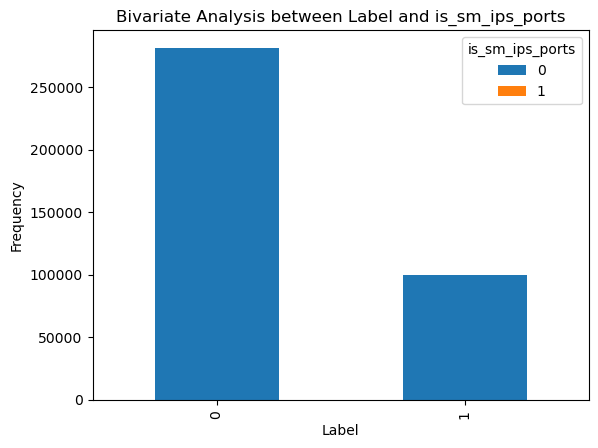

In [52]:
# Bivariate Analysis between Label and is_sm_ips_ports
crosstab = pd.crosstab(data['Label'], data['is_sm_ips_ports'])
crosstab.plot(kind='bar', stacked=True)
plt.title("Bivariate Analysis between Label and is_sm_ips_ports")
plt.xlabel("Label")
plt.ylabel("Frequency")
plt.legend(title="is_sm_ips_ports")
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from the Stacked Bar Plot between `Label` and `is_sm_ips_ports`:**

* **Normal (Label = 0):** The **majority of instances** are labeled as `normal (Label = 0)`, with almost **all of them** having `is_sm_ips_ports set to 0`. This suggests that **small IP ports are rarely involved in normal traffic**.

* **Attack (Label = 1):** For attack instances `(Label = 1)`, there is a **lower frequency** compared to `normal` instances, with nearly **all having is_sm_ips_port**s set to `0` as well. Only a **minimal number** of attack instances have `is_sm_ips_ports set to 1`, indicating that **small IP ports are uncommon even in attack cases**.

* **Summary:** The use of specific **small IP ports is rare in both normal and attack-labeled** instances in this dataset.

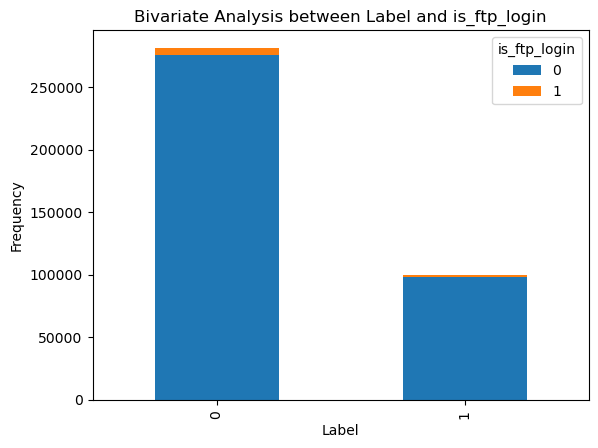

In [53]:
# Bivariate Analysis between Label and is_ftp_login
crosstab = pd.crosstab(data['Label'], data['is_ftp_login'])
crosstab.plot(kind='bar', stacked=True)
plt.title("Bivariate Analysis between Label and is_ftp_login")
plt.xlabel("Label")
plt.ylabel("Frequency")
plt.legend(title="is_ftp_login")
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from Stacked Bar Plot between `Label` and `is_ftp_login`:**

**Predominance of Non-Malicious Records (`Label = 0`)**:
   - Non-malicious records (`Label = 0`) are the **majority** in the dataset, with a frequency exceeding **250,000**.
   - Within this category, less than **0.5%** involve `is_ftp_login = 1`, indicating that **FTP login activity is exceedingly rare** in non-malicious connections.

**Fewer Malicious Records (`Label = 1`)**:
   - Malicious records (`Label = 1`) account for approximately **100,000** records, which is significantly lower than non-malicious records.
   - FTP login activity is also minimal among malicious records, with less than **1%** showing `is_ftp_login = 1`.

**Scarcity of FTP Login Attempts (`is_ftp_login = 1`)**:
   - Across the entire dataset, `is_ftp_login = 1` is infrequent, appearing in only a very small fraction of both `Label = 0` and `Label = 1` records.
   - This suggests that FTP login attempts are generally uncommon in both malicious and non-malicious traffic within this dataset.

Overall, the dataset is dominated by **non-malicious records with minimal FTP login activity**, and **FTP login attempts are uncommon** across both types of traffic.

### **`Numerical and Numerical Columns`**

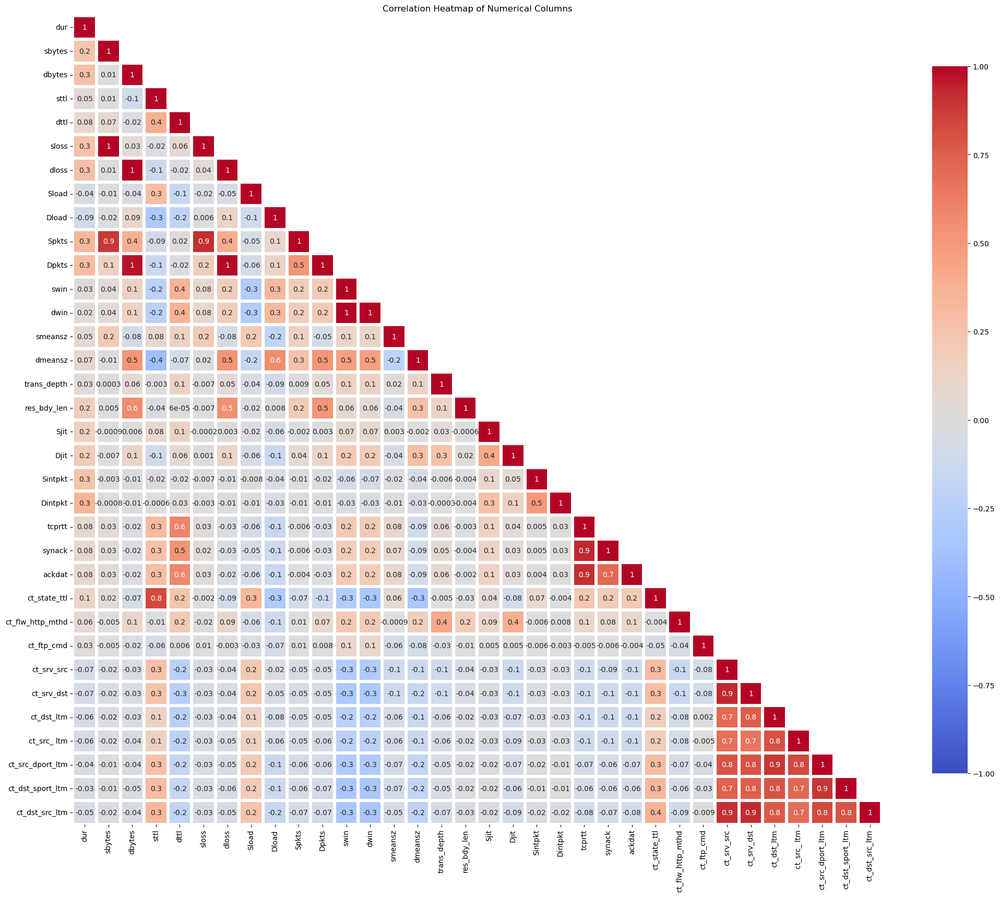

In [54]:
correlation_matrix = data[num_cols].corr()
plt.figure(figsize=(25, 22))
sns.heatmap(correlation_matrix, annot=True,fmt='.1g', cmap='coolwarm',vmin=-1,vmax=1, linewidths=4,square=True, 
            cbar_kws={"shrink": .8},mask=np.triu(correlation_matrix,k=1))
plt.title('Correlation Heatmap of Numerical Columns')
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

#### **Analysis:**

**The heatmap visualizes the Pearson correlation coefficients between numerical features in the dataset.
The values range from -1 (strong negative correlation) to 1 (strong positive correlation):
Strong Positive Correlation (> 0.7): Indicates a strong direct relationship.
Strong Negative Correlation (< -0.7): Indicates a strong inverse relationship.
Weak Correlation (near 0): Indicates little to no linear relationship.**

#### **Key Observations:**

**High Positive Correlations:**

* `sbytes (Source Bytes)` and `dbytes (Destination Bytes)` show a **strong positive correlation (~0.9)**.

**Inference:** High correlation suggests redundancy. Both features likely capture similar information about the volume of data transferred.

* `Spkts (Source Packets)` and `Dpkts (Destination Packets)` have a **strong positive correlation (~0.8)**.

**Inference:** These features also appear to be redundant and may contribute to multicollinearity in the dataset.

* `smeansz (Mean Source Packet Size)` and `dmeansz (Mean Destination Packet Size)` are **highly correlated (~0.7)**.

**Inference:** This suggests similar packet size characteristics in both directions, indicating a balanced flow of data.

**High Correlation among Flow Count Features:**

* Features like `ct_dst_src_ltm, ct_srv_dst`, and `ct_srv_src` exhibit **high correlations (~0.8 to 0.9)**.

**Inference:** These features measure similar flow patterns in the dataset, leading to potential redundancy. They capture repeated connections to the same service or destination.

* **TCP Round Trip Time (tcprtt), SYN-ACK (synack), and ACK-DAT (ackdat):**

These features show very **high correlations (~0.9)** with each other.

**Inference:** These metrics are all related to the TCP handshake process, making them highly interdependent. Including all three may not provide additional predictive value.

**Negative Correlations:**

* `swin (Source Window Size)` and `dwin (Destination Window Size)` have **weak to moderate negative correlations** with `sttl` and `dttl (Time to Live values)`.

**Inference:** The negative correlation may indicate a relationship where increased window size is associated with lower TTL values, possibly due to longer data transfer sessions.

**Weak or No Correlation:**

* Many features, `like res_bdy_len (Response Body Length)` and `trans_depth (Transaction Depth)`, exhibit **low correlation** with other features.

**Inference:** These features might provide unique, independent information useful for model building.

#### **Conclusion:**

**Redundancy:** Features like `sbytes & dbytes`, `Spkts & Dpkts`, and `TCP metrics (tcprtt, synack, ackdat)` are **highly correlated**. These could be candidates for removal or dimensionality reduction to mitigate multicollinearity.

**Feature Selection:** It is advisable to remove or transform highly correlated features, as they may not contribute unique information and could negatively affect model performance.

**Potential Important Features:** Features with low correlations, such as `trans_depth and res_bdy_len`, may provide unique signals that help differentiate between `normal` and `anomalous` traffic.

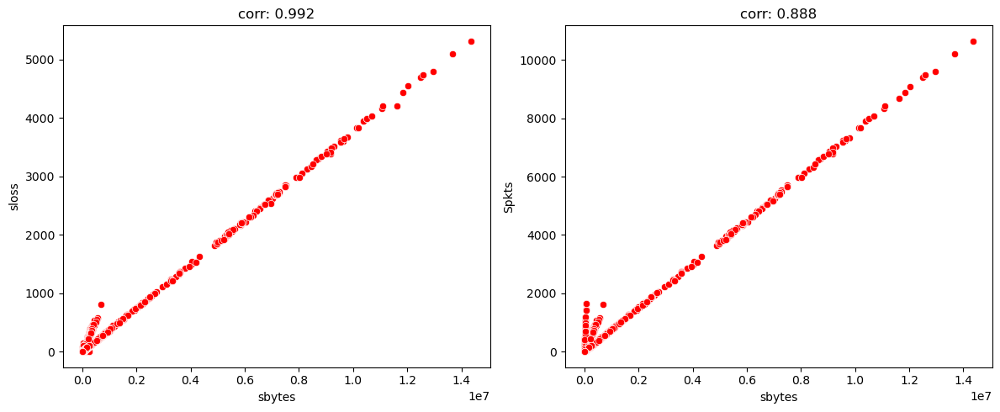

In [55]:
# Bivariate analysis of sbytes with sloss and Spkts
t = 1
plt.figure(figsize=(12,5))
for i in ['sloss','Spkts']:
    plt.subplot(1,2,t)
    sns.scatterplot(data=data,x='sbytes',y=i,color='red')
    plt.title(f"corr: {round(data['sbytes'].corr(data[i]),3)}")
    t += 1
plt.tight_layout()
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from the Scatter Plot between `sbytes` and `sloss` and `sbytes` and `Spkts`:**

1. **sbytes vs. sloss**: There’s a **near-perfect positive correlation (0.992)**, meaning that as **source bytes** (`sbytes`) increase, **source loss** (`sloss`) also increases almost proportionally.

2. **sbytes vs. Spkts**: A **strong positive correlation (0.888)** shows that as **source bytes** (`sbytes`) increase, the **source packet count** (`Spkts`) also tends to rise, though with some variability.

**Summary**: Higher **`sbytes`** generally results in more **`sloss`** and **`Spkts`**, indicating that increased data transfer is associated with more packet losses and a higher packet cont.


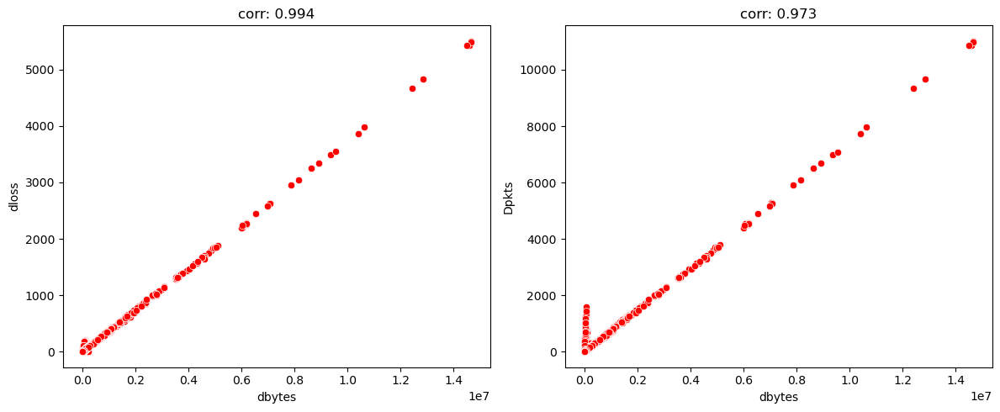

In [56]:
# Bivariate analysis of dbytes with dloss and Dpkts
t = 1
plt.figure(figsize=(12,5))
for i in ['dloss','Dpkts']:
    plt.subplot(1,2,t)
    sns.scatterplot(data=data,x='dbytes',y=i,color='red')
    plt.title(f"corr: {round(data['dbytes'].corr(data[i]),3)}")
    t += 1
plt.tight_layout()
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from the Scatter Plot between `dbytes` and `dloss` and `dbytes` and `Dpkts`:**

1. **dbytes vs. dloss**: A **near-perfect positive correlation (0.994)** suggests that as **destination bytes** (`dbytes`) increase, **destination losses** (`dloss`) also increase almost proportionally.

2. **dbytes vs. Dpkts**: A **very strong positive correlation (0.973)** indicates that higher **destination bytes** (`dbytes`) are closely associated with an increase in **destination packet count** (`Dpkts`), with minimal variability.

**Summary**: Larger data transfers to the destination (**higher `dbytes`**) generally result in **more losses** and **more packets**.

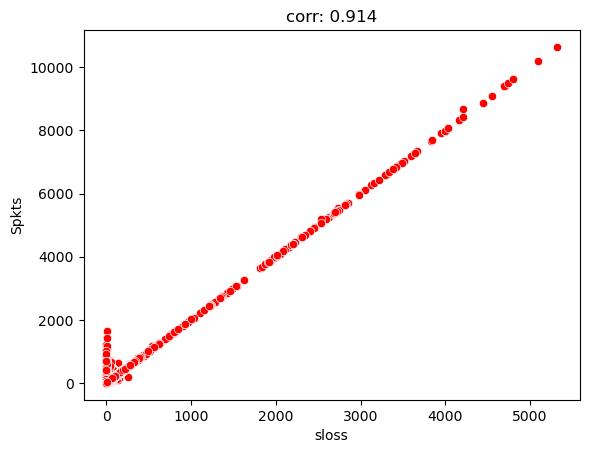

In [57]:
# Bivariate analysis between sloss and Spkts.
sns.scatterplot(data=data,x='sloss',y='Spkts',color='red')
plt.title(f"corr: {round(data['sloss'].corr(data['Spkts']),3)}")
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from the Scatter Plot between `sloss` and `Spkts`:**

**sloss vs. Spkts**: A **strong positive correlation (0.914)** indicates that as **source loss** (`sloss`) increases, the **source packet count** (`Spkts`) also tends to increase.

**Summary**: Higher **`sloss`** is generally associated with a **higher `Spkts`** count, suggesting that increased packet transmission often correlates with increased loss.

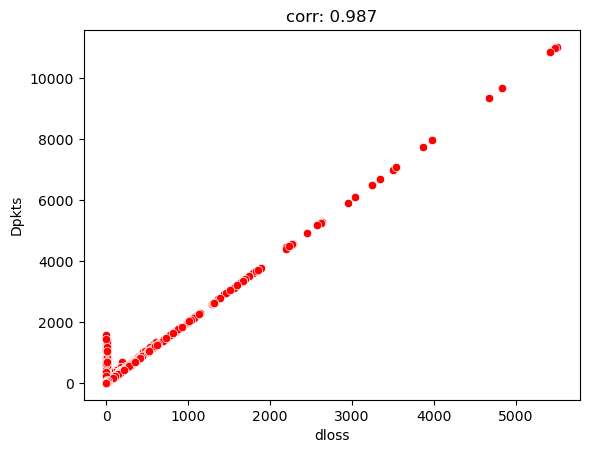

In [58]:
# Bivariate analysis between dloss and Dpkts.
sns.scatterplot(data=data,x='dloss',y='Dpkts',color='red')
plt.title(f"corr: {round(data['dloss'].corr(data['Dpkts']),3)}")
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from the Scatter Plot between `dloss` and `Dpkts`:**

**dloss vs. Dpkts**: A **very strong positive correlation (0.987)** suggests that as **destination loss** (`dloss`) increases, the **destination packet count** (`Dpkts`) also increases almost proportionally.

**Summary**: Higher **`dloss`** is closely associated with a higher **`Dpkts`** count, indicating that increased packet loss corresponds to a higher number of destination packet.


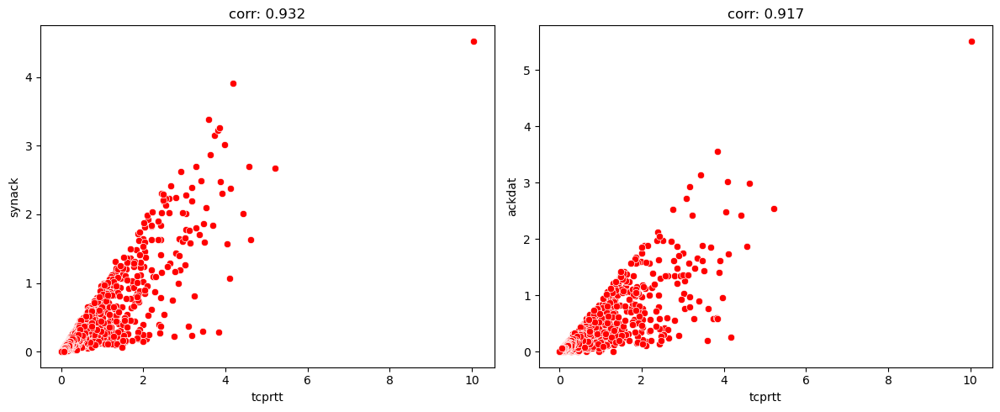

In [59]:
# Bivariate analysis of tcprtt with synack and ackdat
t = 1
plt.figure(figsize=(12,5))
for i in ['synack','ackdat']:
    plt.subplot(1,2,t)
    sns.scatterplot(data=data,x='tcprtt',y=i,color='red')
    plt.title(f"corr: {round(data['tcprtt'].corr(data[i]),3)}")
    t += 1
plt.tight_layout()
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from the Scatter Plot between `tcprtt` and `synack` and `tcprtt` and `ackdat`:**

1. **tcprtt vs. synack**: A **strong positive correlation (0.932)** indicates that as **TCP round-trip time** (`tcprtt`) increases, the **SYN-ACK response time** (`synack`) also tends to increase.

2. **tcprtt vs. ackdat**: Another **strong positive correlation (0.917)** shows that as **TCP round-trip time** (`tcprtt`) increases, the **ACK-DATA response time** (`ackdat`) also generally increases.

**Summary**: Higher **`tcprtt`** is associated with both higher **`synack`** and **`ackdat`** values, suggesting that increased round-trip time corresponds to slower **SYN-ACK** and **ACK-DATA** response times. 

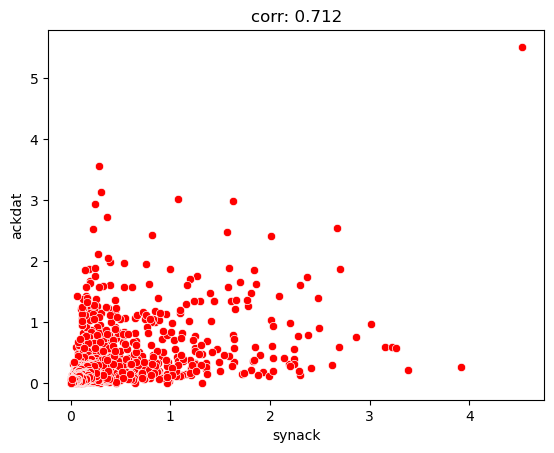

In [60]:
# Bivariate analysis between synack and ackdat.
sns.scatterplot(data=data,x='synack',y='ackdat',color='red')
plt.title(f"corr: {round(data['synack'].corr(data['ackdat']),3)}")
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from the Scatter Plot between `synack` and `ackdat`:**

**synack vs. ackdat**: A **moderate positive correlation (0.712)** indicates that as **SYN-ACK response time** (`synack`) increases, the **ACK-DATA response time** (`ackdat`) also tends to increase.

**Summary**: Higher **`synack`** is associated with higher **`ackdat`** values, suggesting that increased SYN-ACK response times correspond to slower ACK-DATA response times. This relationship could be useful for detecting **network delays** or **bottlenecks** in the system, which may point to potential **network performance issues** or **anomalies** in intrusion detection models.

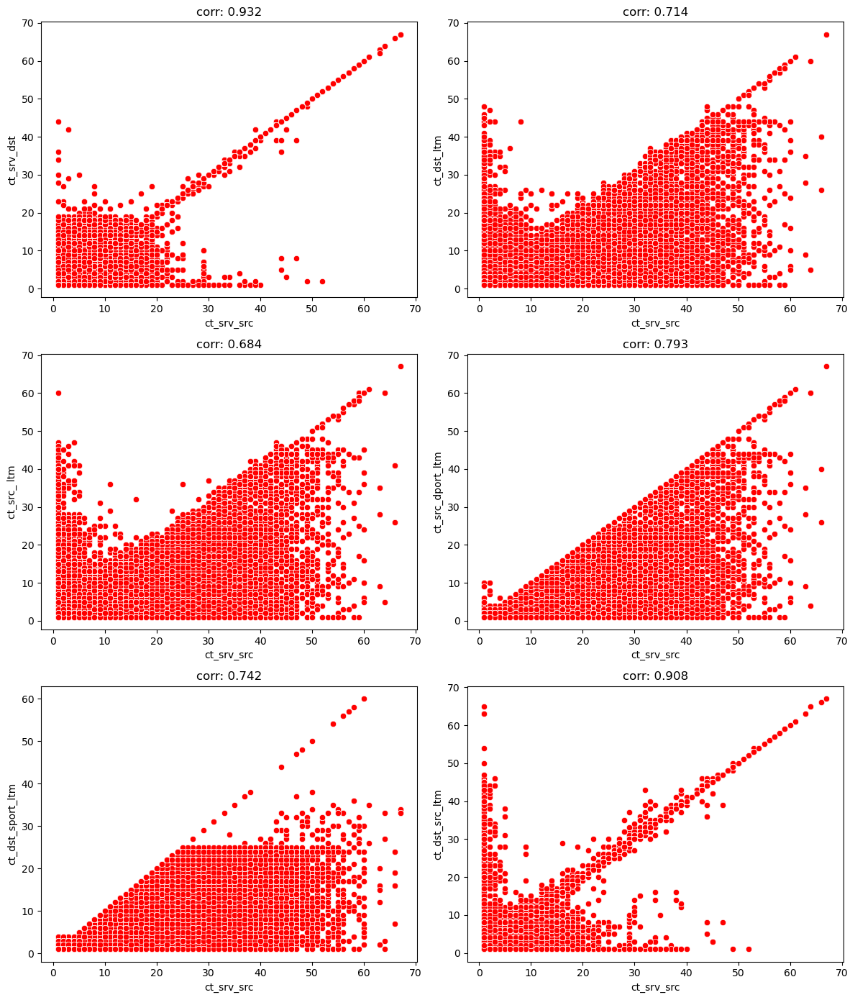

In [61]:
# Bivariate analysis of ct_srv_src with ct_srv_dst, ct_dst_ltm, ct_src_ ltm, ct_src_dport_ltm, ct_dst_sport_ltm and ct_dst_src_ltm
t = 1
plt.figure(figsize=(12,14))
for i in ['ct_srv_dst','ct_dst_ltm','ct_src_ ltm','ct_src_dport_ltm','ct_dst_sport_ltm','ct_dst_src_ltm']:
    plt.subplot(3,2,t)
    sns.scatterplot(data=data,x='ct_srv_src',y=i,color='red')
    plt.title(f"corr: {round(data['ct_srv_src'].corr(data[i]),3)}")
    t += 1
plt.tight_layout()
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from column's `ct_srv_src` Scatter Plot with columns `ct_srv_dst`, `ct_dst_ltm`, `ct_src_ltm`, `ct_src_dport_ltm`, `ct_dst_sport_ltm`, `ct_dst_src_ltm`:**

1. **ct_srv_src vs. ct_srv_dst**: A **strong positive correlation (0.932)** indicates that as **source service count** (`ct_srv_src`) increases, the **destination service count** (`ct_srv_dst`) also tends to increase.

2. **ct_srv_src vs. ct_dst_ltm**: A **moderate positive correlation (0.714)** suggests that as **source service count** (`ct_srv_src`) increases, the **destination connection lifetime** (`ct_dst_ltm`) generally increases as well.

3. **ct_srv_src vs. ct_src_ltm**: A **moderate positive correlation (0.684)** indicates that as **source service count** (`ct_srv_src`) increases, the **source connection lifetime** (`ct_src_ltm`) tends to increase.

4. **ct_srv_src vs. ct_src_dport_ltm**: A **moderate positive correlation (0.793)** suggests that as **source service count** (`ct_srv_src`) increases, the **source destination port connection lifetime** (`ct_src_dport_ltm`) also generally increases.

5. **ct_srv_src vs. ct_dst_sport_ltm**: A **moderate positive correlation (0.742)** shows that as **source service count** (`ct_srv_src`) increases, the **destination sport connection lifetime** (`ct_dst_sport_ltm`) also tends to increase.

6. **ct_srv_src vs. ct_dst_src_ltm**: A **strong positive correlation (0.908)** indicates that as **source service count** (`ct_srv_src`) increases, the **destination-source connection lifetime** (`ct_dst_src_ltm`) also generally increases.

**Summary**: Higher **`ct_srv_src`** is associated with higher values across multiple network metrics, including **`ct_srv_dst`**, **`ct_dst_ltm`**, **`ct_src_ltm`**, **`ct_src_dport_ltm`**, **`ct_dst_sport_ltm`**, and **`ct_dst_src_ltm`**. This pattern suggests that an increase in the source service count aligns with longer connection lifetimes and sustained activity across various connection types. These relationships may indicate **consistent traffic patterns** or **persistent communication** between sources and destinations, which could be useful for identifying **network anomalies** or potential **intrusion behaviors** like **scanning** or **persistnt attacks**.


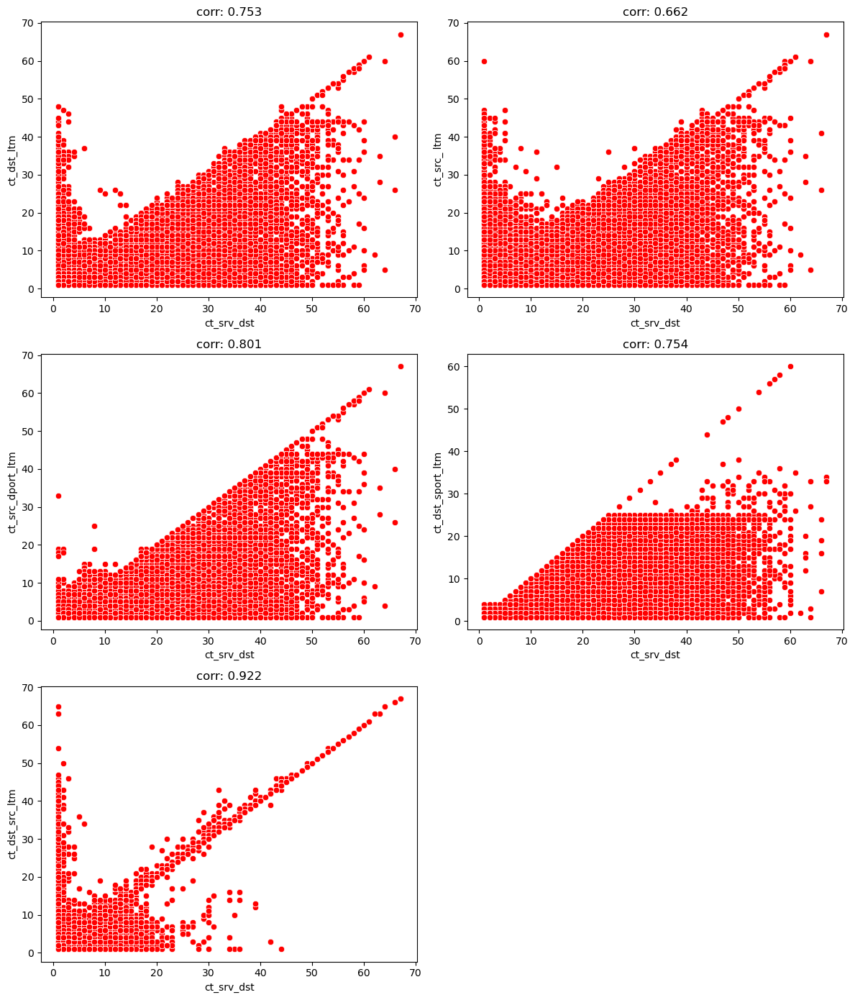

In [62]:
# Bivariate analysis of ct_srv_dst with ct_dst_ltm, ct_src_ ltm, ct_src_dport_ltm, ct_dst_sport_ltm and ct_dst_src_ltm
t = 1
plt.figure(figsize=(12,14))
for i in ['ct_dst_ltm','ct_src_ ltm','ct_src_dport_ltm','ct_dst_sport_ltm','ct_dst_src_ltm']:
    plt.subplot(3,2,t)
    sns.scatterplot(data=data,x='ct_srv_dst',y=i,color='red')
    plt.title(f"corr: {round(data['ct_srv_dst'].corr(data[i]),3)}")
    t += 1
plt.tight_layout()
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from column's `ct_srv_dst` Scatter Plot with columns `ct_dst_ltm`, `ct_src_ltm`, `ct_src_dport_ltm`, `ct_dst_sport_ltm`, `ct_dst_src_ltm`:**

1. **ct_srv_dst vs. ct_dst_ltm**: A **moderate positive correlation (0.753)** suggests that as **destination service count** (`ct_srv_dst`) increases, the **destination connection lifetime** (`ct_dst_ltm`) also generally increases.

2. **ct_srv_dst vs. ct_src_ltm**: A **moderate positive correlation (0.662)** indicates that as **destination service count** (`ct_srv_dst`) increases, the **source connection lifetime** (`ct_src_ltm`) tends to increase.

3. **ct_srv_dst vs. ct_src_dport_ltm**: A **moderate positive correlation (0.801)** suggests that as **destination service count** (`ct_srv_dst`) increases, the **source destination port connection lifetime** (`ct_src_dport_ltm`) also generally increases.

4. **ct_srv_dst vs. ct_dst_sport_ltm**: A **moderate positive correlation (0.754)** shows that as **destination service count** (`ct_srv_dst`) increases, the **destination sport connection lifetime** (`ct_dst_sport_ltm`) also tends to increase.

5. **ct_srv_dst vs. ct_dst_src_ltm**: A **strong positive correlation (0.922)** indicates that as **destination service count** (`ct_srv_dst`) increases, the **destination-source connection lifetime** (`ct_dst_src_ltm`) also generally increases.

**Summary**: Higher **`ct_srv_dst`** is associated with higher values of **`ct_dst_ltm`**, **`ct_src_ltm`**, **`ct_src_dport_ltm`**, **`ct_dst_sport_ltm`**, and **`ct_dst_src_ltm`**, suggesting that an increase in destination service count correlates with longer connection lifetimes and increased activity across different connection types. This relationship could highlight **persistent destination-focused traffic** and **consistent communication patterns**, potentially indicating **sustained network usage** or **malicious activities** like **reconnaissance** or **data exfiltration** in intrusion detectio scenarios.


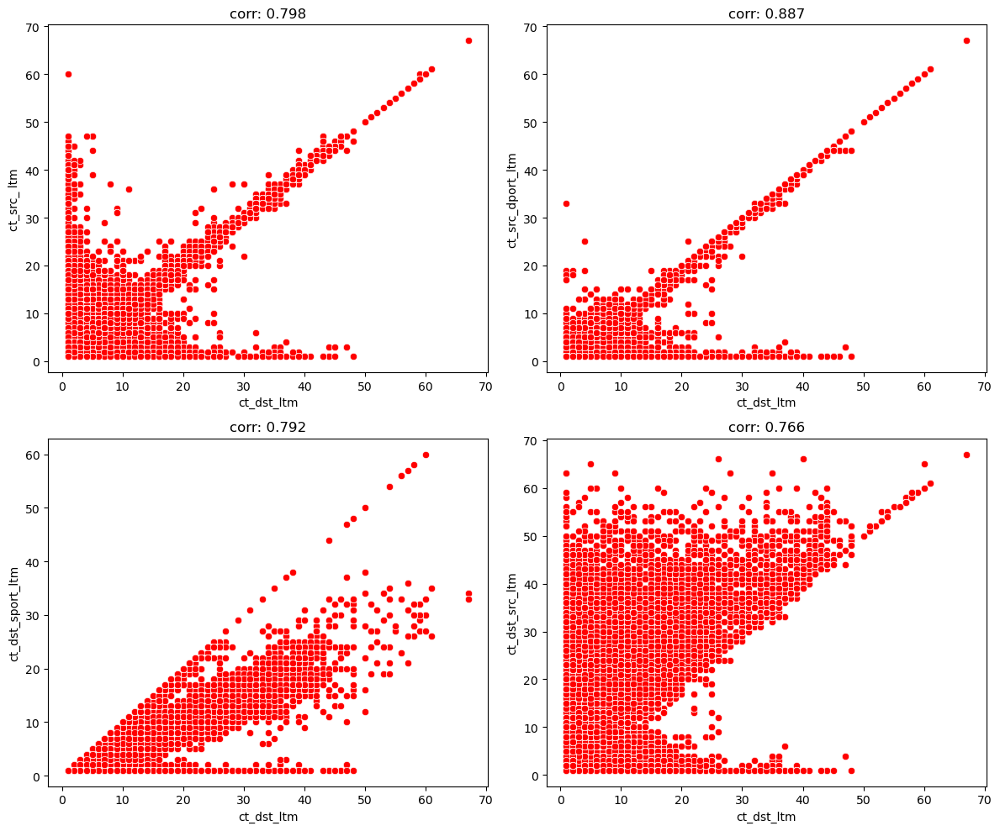

In [63]:
# Bivariate analysis of ct_dst_ltm with ct_src_ ltm, ct_src_dport_ltm, ct_dst_sport_ltm and ct_dst_src_ltm
t = 1
plt.figure(figsize=(12,10))
for i in ['ct_src_ ltm','ct_src_dport_ltm','ct_dst_sport_ltm','ct_dst_src_ltm']:
    plt.subplot(2,2,t)
    sns.scatterplot(data=data,x='ct_dst_ltm',y=i,color='red')
    plt.title(f"corr: {round(data['ct_dst_ltm'].corr(data[i]),3)}")
    t += 1
plt.tight_layout()
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from column's `ct_dst_ltm` Scatter Plot with columns `ct_src_ltm`, `ct_src_dport_ltm`, `ct_dst_sport_ltm`, `ct_dst_src_ltm`:**

1. **ct_dst_ltm vs. ct_src_ltm**: A **moderate positive correlation (0.798)** suggests that as **destination connection lifetime** (`ct_dst_ltm`) increases, the **source connection lifetime** (`ct_src_ltm`) also tends to increase.

2. **ct_dst_ltm vs. ct_src_dport_ltm**: A **strong positive correlation (0.887)** indicates that as **destination connection lifetime** (`ct_dst_ltm`) increases, the **source destination port connection lifetime** (`ct_src_dport_ltm`) also generally increases.

3. **ct_dst_ltm vs. ct_dst_sport_ltm**: A **moderate positive correlation (0.792)** suggests that as **destination connection lifetime** (`ct_dst_ltm`) increases, the **destination sport connection lifetime** (`ct_dst_sport_ltm`) also tends to increase.

4. **ct_dst_ltm vs. ct_dst_src_ltm**: A **moderate positive correlation (0.766)** shows that as **destination connection lifetime** (`ct_dst_ltm`) increases, the **destination-source connection lifetime** (`ct_dst_src_ltm`) also generally increases.

**Summary**: Higher **`ct_dst_ltm`** is associated with higher values of **`ct_src_ltm`**, **`ct_src_dport_ltm`**, **`ct_dst_sport_ltm`**, and **`ct_dst_src_ltm`**, suggesting that an increase in destination connection lifetime correlates with longer connection durations across other related network metrics. This pattern may indicate **persistent or prolonged connections**, which could be useful for detecting **network stability issues**, **continuous communication patterns**, or **anomalous activity** in intrusion detection contexts.

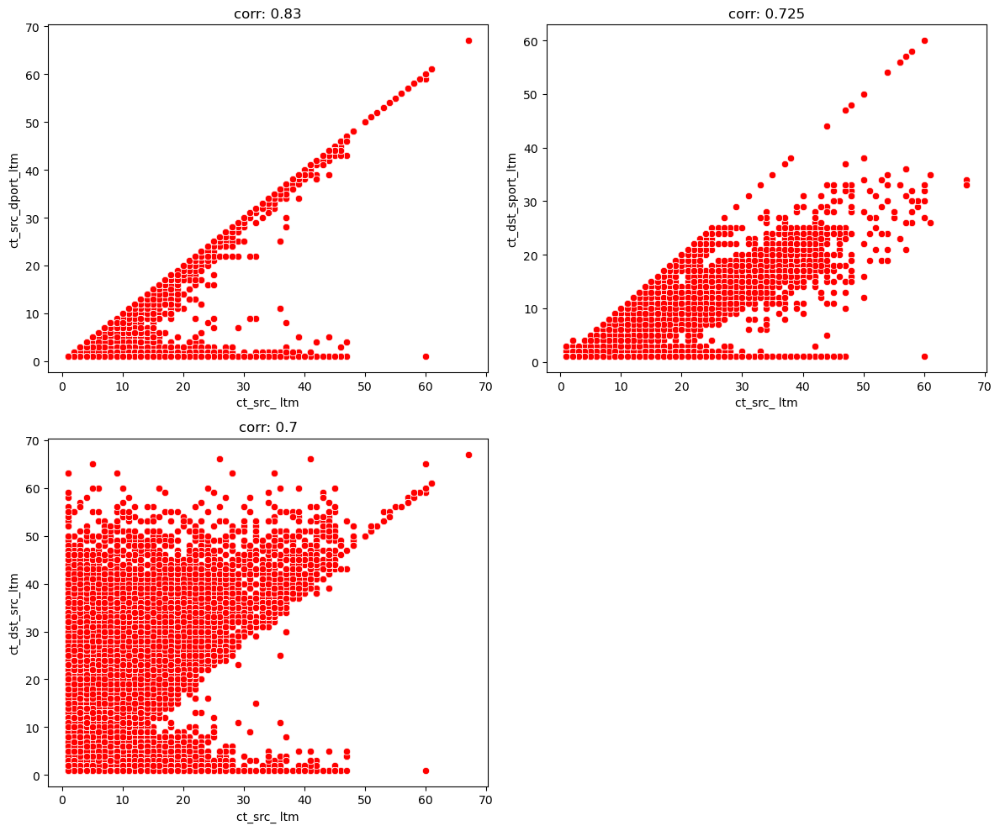

In [64]:
# Bivariate analysis of ct_src_ ltm with ct_src_dport_ltm, ct_dst_sport_ltm and ct_dst_src_ltm
t = 1
plt.figure(figsize=(12,10))
for i in ['ct_src_dport_ltm','ct_dst_sport_ltm','ct_dst_src_ltm']:
    plt.subplot(2,2,t)
    sns.scatterplot(data=data,x='ct_src_ ltm',y=i,color='red')
    plt.title(f"corr: {round(data['ct_src_ ltm'].corr(data[i]),3)}")
    t += 1
plt.tight_layout()
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from column's `ct_src_ltm` Scatter Plot with columns `ct_src_dport_ltm`, `ct_dst_sport_ltm`, `ct_dst_src_ltm`:**

1. **ct_src_ltm vs. ct_src_dport_ltm**: A **strong positive correlation (0.83)** suggests that as **source connection lifetime** (`ct_src_ltm`) increases, the **source destination port connection lifetime** (`ct_src_dport_ltm`) also generally increases.

2. **ct_src_ltm vs. ct_dst_sport_ltm**: A **moderate positive correlation (0.725)** indicates that as **source connection lifetime** (`ct_src_ltm`) increases, the **destination sport connection lifetime** (`ct_dst_sport_ltm`) also tends to increase.

3. **ct_src_ltm vs. ct_dst_src_ltm**: A **moderate positive correlation (0.7)** shows that as **source connection lifetime** (`ct_src_ltm`) increases, the **destination-source connection lifetime** (`ct_dst_src_ltm`) also generally increases.

**Summary**: Higher **`ct_src_ltm`** is associated with higher values of **`ct_src_dport_ltm`**, **`ct_dst_sport_ltm`**, and **`ct_dst_src_ltm`**, suggesting that an increase in source connection lifetime correlates with longer connection durations across related network metrics. This relationship may highlight **consistent source activity** and **extended connection durations**, potentially indicating **persistent traffic** or **patterns of reconnaissance** that could be relevant for **intrusion detection**.

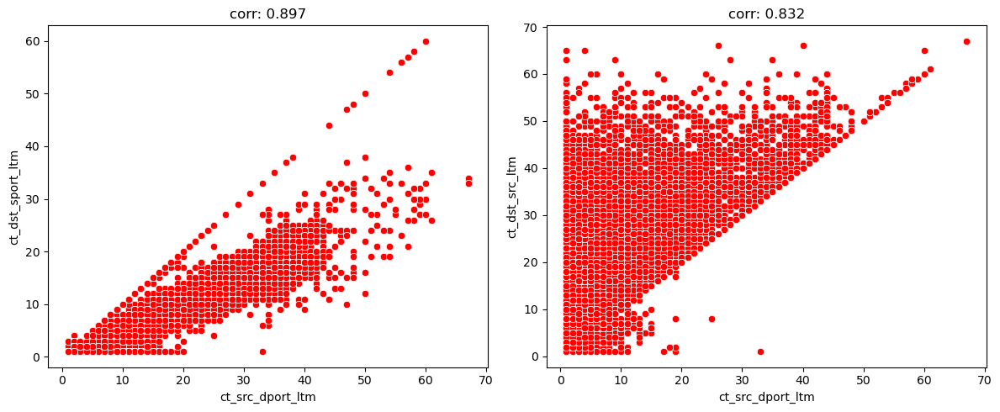

In [65]:
# Bivariate analysis of ct_src_dport_ltm with ct_dst_sport_ltm and ct_dst_src_ltm
t = 1
plt.figure(figsize=(12,5))
for i in ['ct_dst_sport_ltm','ct_dst_src_ltm']:
    plt.subplot(1,2,t)
    sns.scatterplot(data=data,x='ct_src_dport_ltm',y=i,color='red')
    plt.title(f"corr: {round(data['ct_src_dport_ltm'].corr(data[i]),3)}")
    t += 1
plt.tight_layout()
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from the Scatter Plot between `ct_src_dport_ltm` and `ct_dst_sport_ltm` and `ct_src_dport_ltm` and `ct_dst_src_ltm`**:

1. **ct_src_dport_ltm vs. ct_dst_sport_ltm**: A **strong positive correlation (0.897)** indicates that as **source destination port connection lifetime** (`ct_src_dport_ltm`) increases, the **destination sport connection lifetime** (`ct_dst_sport_ltm`) also tends to increase.

2. **ct_src_dport_ltm vs. ct_dst_src_ltm**: A **strong positive correlation (0.832)** shows that as **source destination port connection lifetime** (`ct_src_dport_ltm`) increases, the **destination-source connection lifetime** (`ct_dst_src_ltm`) also generally increases.

**Summary**: Higher **`ct_src_dport_ltm`** is associated with higher values of both **`ct_dst_sport_ltm`** and **`ct_dst_src_ltm`**, suggesting that an increase in the lifetime of source destination port connections correlates with increases in both destination sport and destination-source connection lifetimes. This relationship could indicate **persistent communication patterns** or **sustained connections** that might be characteristic of **long-term traffic behavior**, useful for detecting potential **network reconnaissance** or **attacks** like **DDoS** or **data exfiltration**.

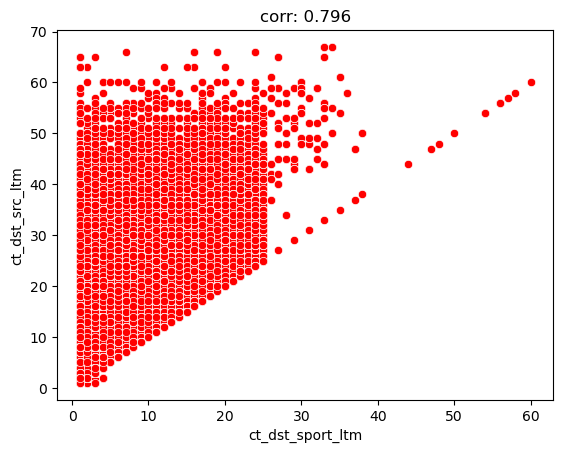

In [66]:
# Bivariate analysis between ct_dst_sport_ltm and ct_dst_src_ltm
sns.scatterplot(data=data,x='ct_dst_sport_ltm',y='ct_dst_src_ltm',color='red')
plt.title(f"corr: {round(data['ct_dst_sport_ltm'].corr(data['ct_dst_src_ltm']),3)}")
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### Inferences from the Scatter Plot between `ct_dst_sport_ltm` and `ct_dst_src_ltm`:

**ct_dst_sport_ltm vs. ct_dst_src_ltm:** A **moderate positive correlation (0.796)** indicates that as **destination sport connection lifetime** (`ct_dst_sport_ltm`) increases, the **destination-source connection lifetime** (`ct_dst_src_ltm`) also tends to increase.

**Summary**: Higher **`ct_dst_sport_ltm`** is associated with higher **`ct_dst_src_ltm`** values, suggesting that an increase in the lifetime of destination sport connections generally corresponds to an increase in the lifetime of destination-source connections. This relationship could help identify **persistent connections** and may indicate **sustained traffic patterns**, useful for detecting **long-term network behaviors** or **potential attacks** like **DDoS** or **resource exhaustion**.

<div style="background-color: #FFEE77; padding: 10px;">

# ***`STATISTICAL TESTING`***

In [67]:
import scipy.stats as stats
import statsmodels.stats.multicomp as multi
import statsmodels.stats.weightstats as wstats 
from scipy.stats import f_oneway

<div style="background-color: #ccf2ff; padding: 10px;">

#### Comparison: Normal vs. Attack Traffic (sbytes)
**Key Finding: IS Significant statistical difference detected in byte sizes between normal and attack traffic patterns.**

**`HYPOTHESIS TESTING`**

* **Null Hypothesis** (H0): ` The mean sbytes across attcked = mean sbytes across normal `.
* **Alternative Hypothesis** (H1): `The mean sbytes across attcked != mean sbytes across normal `.

In [68]:
# Separate the data into Normal and Attack groups
normal_sbytes = data[data['Label'] == 0]['sbytes']
attack_sbytes = data[data['Label'] == 1]['sbytes']

**`ASSUMPTION CHECK`**

In [69]:
stats.shapiro(data['sbytes'])

ShapiroResult(statistic=0.01756095993314233, pvalue=3.828524469859561e-219)

In [70]:
stats.shapiro(data['Label'])

ShapiroResult(statistic=0.5480149333085573, pvalue=5.692560370946306e-190)

* `DATA IS NORMAL DISTRIBUTED`

In [71]:
stats.levene(normal_sbytes,attack_sbytes)

LeveneResult(statistic=701.931331579516, pvalue=1.5715151471084415e-154)

* `DATA HAVE EQUAL VARIENCE`

**`TESTING`**

In [72]:
t_stat,p_value = stats.ttest_ind(normal_sbytes, attack_sbytes)

print("Two-Sample T-Test Results:")
print(f"T-Statistic: {t_stat}")
print(f"P-Value: {p_value}")

if p_value > 0.05:
    print("fail toreject ho.")
else:
    print("reject ho.")

Two-Sample T-Test Results:
T-Statistic: -25.672764065110414
P-Value: 3.1336291755222966e-145
reject ho.


<div style="background-color: #ccf2ff; padding: 10px;">

##### Inference:- **`Significant statistical MEAN difference detected in byte sizes between normal and attack traffic patterns`**.

--------

#### Analysis: Duration (dur) Across Attack Categories
**Key Finding: IS Significant variations observed in traffic duration patterns across different attack categories**


**Samples**

In [73]:
s1 = data[data['attack_cat'] == 'Normal']['dur']
s2 = data[data['attack_cat'] == 'Exploits']['dur']
s3 = data[data['attack_cat'] == 'Generic']['dur']
s4 = data[data['attack_cat'] == 'Fuzzers']['dur']
s5 = data[data['attack_cat'] == 'Reconnaissance']['dur']
s6 = data[data['attack_cat'] == 'DoS']['dur']
s7 = data[data['attack_cat'] == 'Analysis']['dur']
s8 = data[data['attack_cat'] == 'Backdoor']['dur']
s9 = data[data['attack_cat'] == 'Shellcode']['dur']
s10 = data[data['attack_cat'] == 'Worms']['dur']

**Hypothesis**

* **Null Hypothesis** (H0): `There are no significant differences in the mean durations across the different attack categories`.
* **Alternative Hypothesis** (H1): ` Atleast one feature mean durations across the different attack categories is different`.

In [74]:
f_stat, p_value = f_oneway(s1, s2, s3, s4, s5, s6, s7, s8, s9, s10)

print(f"F-statistic: {f_stat}")
print(f"P-value: {p_value}")
print("ANOVA TEST Results:")
if p_value > 0.05:
    print("fail to reject ho")
else:
    print("reject ho.")

F-statistic: 617.2576060435102
P-value: 0.0
ANOVA TEST Results:
reject ho.


<div style="background-color: #ccf2ff; padding: 10px;">

##### Inference:- **`Atleast one feature mean durations across the different attack categories is different`**.

<div style="background-color: #FFEE77; padding: 10px;">

# ***`Data Preprocessing`***

In [75]:
# Get the top 2 values in 'proto'
top_2_proto = data['proto'].value_counts().sort_values(ascending=False).head(2).index

# Filter the data to include only the top 2 protocols
check_data = data[data['proto'].isin(top_2_proto)]

## **`Outlier Treatment`**

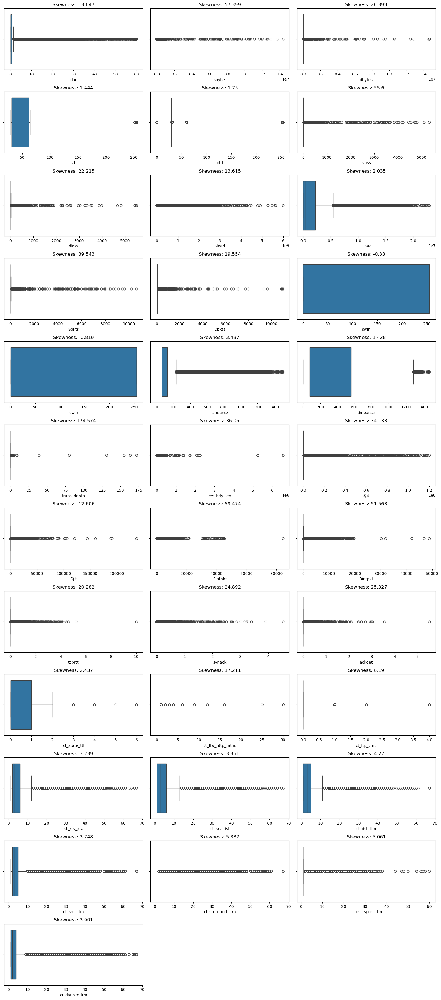

In [76]:
t = 1
plt.figure(figsize=(16,36))
for i in num_cols:
    plt.subplot(12,3,t)
    sns.boxplot(check_data[i],orient='h')
    plt.title(f"Skewness: {round(check_data[i].skew(),3)}")
    t += 1
plt.tight_layout()
plt.show()

In [77]:
for i in num_cols:
    q1 = np.percentile(check_data[i],25)
    q3 = np.percentile(check_data[i],75)
    iqr = q3 - q1
    ll = q1 - 3.5*iqr
    ul = q3 + 3.5*iqr
    check_data[i] = check_data[i].apply(lambda x: ll if x < ll else ul if x > ul else x)

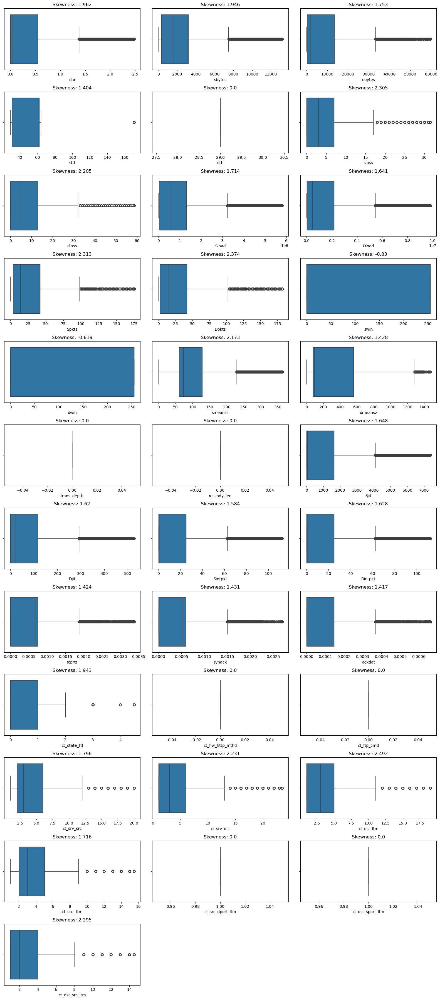

In [78]:
t = 1
plt.figure(figsize=(16,36))
for i in num_cols:
    plt.subplot(12,3,t)
    sns.boxplot(check_data[i],orient='h')
    plt.title(f"Skewness: {round(check_data[i].skew(),3)}")
    t += 1
plt.tight_layout()
plt.show()

<div style="background-color: #FFEE77; padding: 10px;">

## **`Encoding`**

In [79]:
check_data.drop(columns=['attack_cat'],inplace=True)
lab = LabelEncoder()
check_data['proto'] = lab.fit_transform(check_data['proto'])
check_data['state'] = lab.fit_transform(check_data['state'])
d = round(check_data['service'].value_counts(normalize=True),4).to_dict()
check_data['service'] = check_data['service'].map(d)

<div style="background-color: #FFEE77; padding: 10px;">

## **`Train Test Split`**

In [80]:
x = check_data.drop(columns=['Label'])
y = check_data['Label']

In [81]:
# Train Test Split
x_train, x_test, y_train, y_test = train_test_split(x,y,train_size=0.80,random_state=5,stratify=y)

In [82]:
# Training Dataset
x_train.shape, y_train.shape

((293834, 39), (293834,))

In [83]:
# Testing Dataset
x_test.shape, y_test.shape

((73459, 39), (73459,))

<div style="background-color: #FFEE77; padding: 10px;">

# ***`FEATURE SELECTION`***

In [84]:
from sklearn.feature_selection import mutual_info_classif


In [85]:
discrete_features = x.dtypes == int

def mututal_score(x,y,discrete_features):
    scores = mutual_info_classif(x,y,discrete_features=discrete_features)
    df = pd.DataFrame({
        'Features':x.columns,
        'Scores':scores
    })
    df = df.sort_values(['Scores'],ascending=False).reset_index(drop=True)
    return df

In [86]:
feature_scores = mututal_score(x,y.astype('float64'),discrete_features)
feature_scores

,Features,Scores
0,sttl,5.007e-01
1,ct_state_ttl,4.739e-01
2,sbytes,4.351e-01
3,dbytes,4.077e-01
4,dmeansz,3.616e-01
5,Dintpkt,3.236e-01
6,Dload,3.156e-01
7,tcprtt,2.998e-01
8,synack,2.994e-01
9,ackdat,2.932e-01


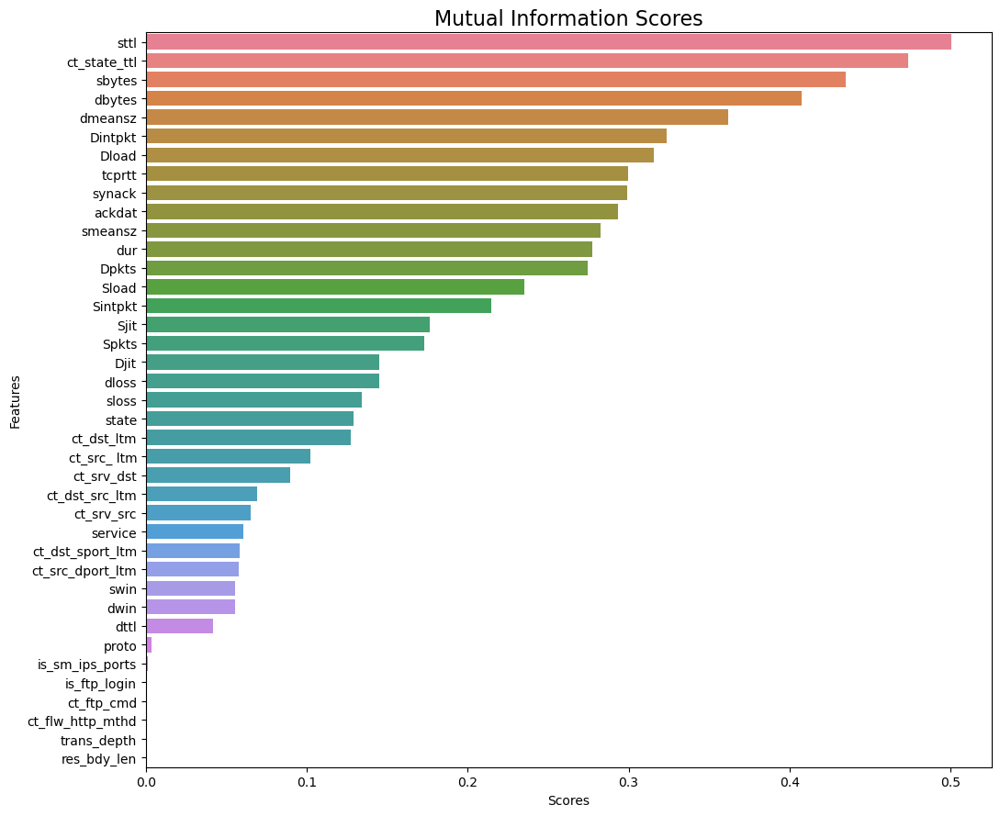

In [87]:
plt.figure(figsize=(11,9))

# Create the barplot
sns.barplot(x='Scores', y='Features', data=feature_scores,hue='Features')

# Add a title
plt.title("Mutual Information Scores", fontsize=16)

# Rotate the y-axis labels (if needed)
plt.yticks(rotation=0)

# Rotate the x-axis labels (if needed)
plt.xticks(rotation=0)

# Display the plot
plt.tight_layout()  # Adjusts the plot to ensure everything fits without overlap
plt.show()

#### **`LESS IMPORTANT FEATURES`**

In [88]:
# Filter features with scores less than 0.001285
low_score_features = feature_scores[feature_scores['Scores'] < 0.01]

# Extract the feature names
low_score_feature_names = low_score_features['Features'].tolist()

# Print the list of low score feature names
low_score_feature_names

['proto',
 'is_sm_ips_ports',
 'is_ftp_login',
 'ct_ftp_cmd',
 'ct_flw_http_mthd',
 'trans_depth',
 'res_bdy_len']

In [89]:
x_train.drop(columns=low_score_feature_names,inplace=True)
x_test.drop(columns=low_score_feature_names,inplace=True)

<div style="background-color: #FFEE77; padding: 10px;">

## ***`LDA AND SCALING OF DATA`***

In [90]:
scaler = StandardScaler()
x_scaled = scaler.fit_transform(x_train)

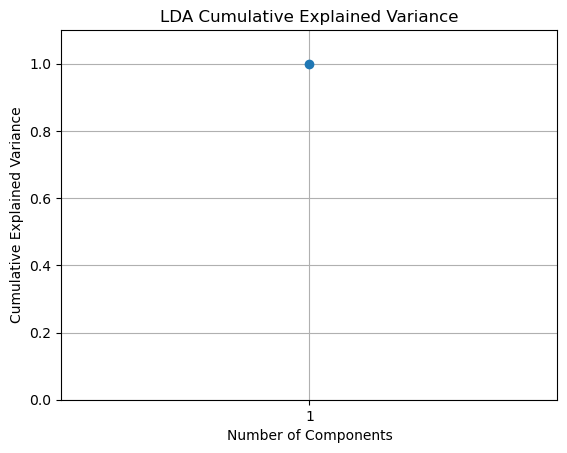

In [91]:
lda = LinearDiscriminantAnalysis(n_components=1)
lda.fit(x_scaled, y_train)

# Get the explained variance ratio
explained_variance_ratio = lda.explained_variance_ratio_
cumulative_variance_ratio = explained_variance_ratio.cumsum()

# Plot the cumulative explained variance as a line
plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio, marker='o', linestyle='-')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('LDA Cumulative Explained Variance')
plt.ylim(0, 1.1)  # Set y-axis limit slightly above 1 for clarity
plt.xticks([1])  # Since we only have one component, show only one tick on x-axis
plt.grid(True)   # Optional: add grid for better visualization
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

## **Inference**:
* Since **all features together capture 100% of the information**, there’s **no benefit to reducing the number of features with LDA**. If we applied LDA here, we’d just be **recreating the original features in a new form without any real reduction in complexity**.
In other words, **reducing the features would cause a loss of information**, as each feature is needed to explain the full variance.

## **`CLASS IMBALANCE`**

In [92]:
smothe=SMOTE(sampling_strategy=0.7,random_state=1)

In [93]:
x_train,y_train=smothe.fit_resample(x_train,y_train)

In [94]:
y_train.value_counts(normalize=True)

Label
0    0.588
1    0.412
Name: proportion, dtype: float64

<div style="background-color: #FFEE77; padding: 10px;">

# ***`Predictive Modelling`***

In [95]:
mod = []
acc = []
prec = []
rec = []
f1 = []
ckap = []

def model_validation(model, xtrain, ytrain, xtest, ytest):
    m = model
    m.fit(xtrain, ytrain)
    pred_h = m.predict(xtest)
    pred_s = m.predict_proba(xtest)[:, 1]

    print(f'Confusion Matrix : \n {confusion_matrix(ytest, pred_h)}')
    print(f'\n Classification Report : \n {classification_report(ytest, pred_h)}')

    # Plotting ROC Curve
    plt.figure(figsize=(12, 7))
    fpr, tpr, thres = roc_curve(ytest, pred_s)
    plt.plot(fpr, tpr, color='purple', label=m)
    plt.plot([0, 1], [0, 1], color='r', ls='--')
    plt.title(f'ROC AUC  = {round(roc_auc_score(ytest,pred_s),3)}')
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Plotting Precision-Recall Curve
    precision, recall, thresholds = precision_recall_curve(ytest, pred_s)
    pr_auc = auc(recall, precision)
    plt.figure(figsize=(12, 7))
    plt.plot(recall, precision, color='blue')
    plt.title(f'PR AUC = {round(pr_auc,3)}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.legend()
    plt.grid()
    plt.tight_layout()
    plt.show()

    # Saving results if needed
    ans = input('Do you want to save the result? Y/N : ')
    if ans.lower() == 'y':
        mod.append(str(model))
        acc.append(accuracy_score(ytest, pred_h))
        rec.append(recall_score(ytest, pred_h))
        prec.append(precision_score(ytest, pred_h))
        f1.append(f1_score(ytest, pred_h))
        ckap.append(cohen_kappa_score(ytest, pred_h))
        global scorecard
        scorecard = pd.DataFrame({'Model': mod, 'Accuracy': acc, 'Recall': rec, 'Precision': prec, 'F1_score': f1, 'Cohen_kappa': ckap})
        print('\nResult saved to scorecard')
    else:
        return


In [96]:
def tuning_parameters(grid,estimator,x,y,score = 'f1'):
    gscv = GridSearchCV(estimator=estimator,param_grid=grid,verbose=1,scoring=score)
    gscv.fit(x,y)
    return gscv.best_params_

# **`Logistic Regression`**

Confusion Matrix : 
 [[48517  7480]
 [ 1887 15575]]

 Classification Report : 
               precision    recall  f1-score   support

           0       0.96      0.87      0.91     55997
           1       0.68      0.89      0.77     17462

    accuracy                           0.87     73459
   macro avg       0.82      0.88      0.84     73459
weighted avg       0.89      0.87      0.88     73459



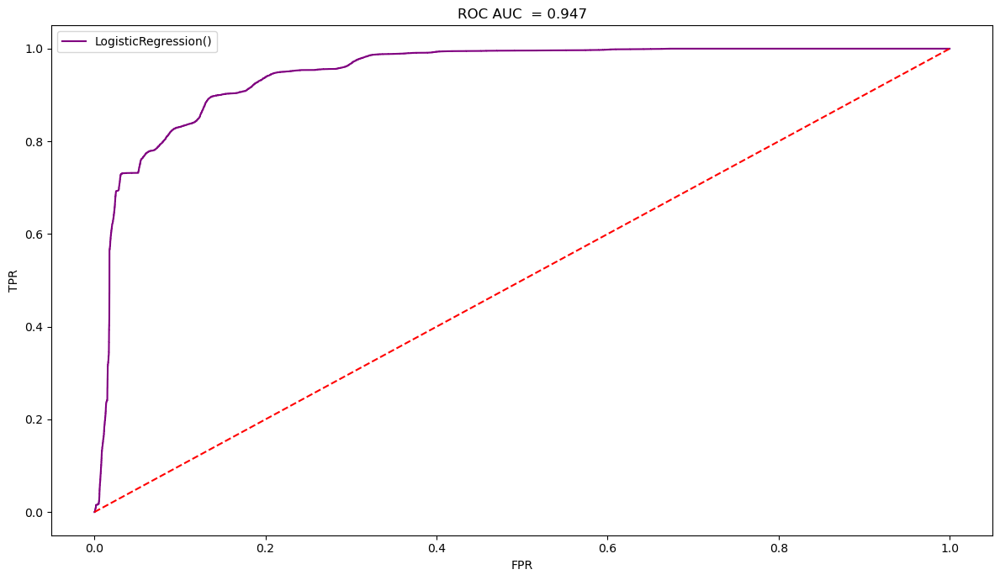

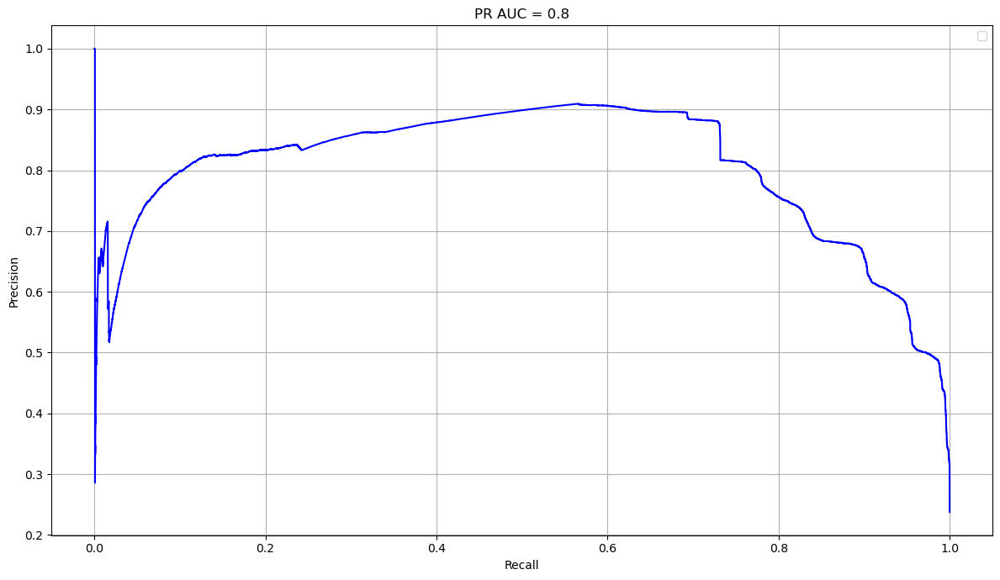


Result saved to scorecard


In [97]:
model_validation(LogisticRegression(),x_train,y_train,x_test,y_test)

In [98]:
scorecard

,Model,Accuracy,Recall,Precision,F1_score,Cohen_kappa
0,LogisticRegression(),0.872,0.892,0.676,0.769,0.683


# **`Decision Tree Classifier`**

Confusion Matrix : 
 [[55271   726]
 [  741 16721]]

 Classification Report : 
               precision    recall  f1-score   support

           0       0.99      0.99      0.99     55997
           1       0.96      0.96      0.96     17462

    accuracy                           0.98     73459
   macro avg       0.97      0.97      0.97     73459
weighted avg       0.98      0.98      0.98     73459



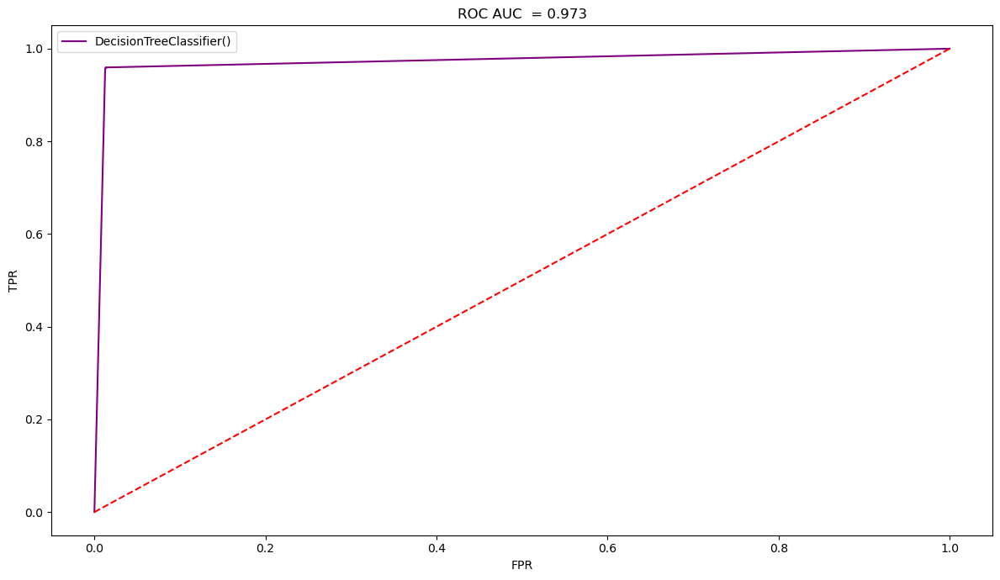

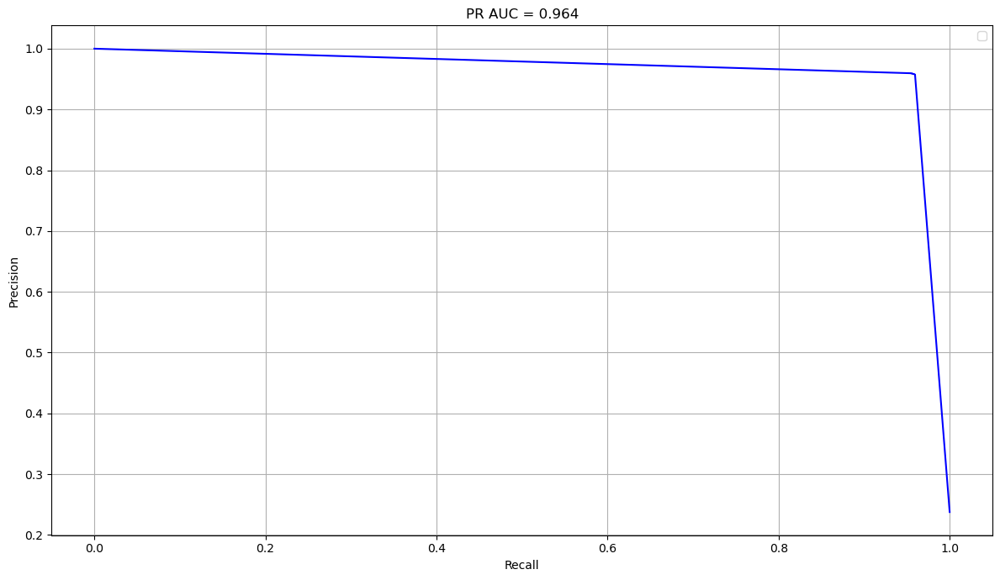


Result saved to scorecard


In [99]:
model_validation(DecisionTreeClassifier(),x_train,y_train,x_test,y_test)

### **`HyperParameter Tuning`**

In [100]:
best_dt = tuning_parameters(grid={'max_depth':[3,4,6,7],'min_samples_split':[2,3,4,5,6],
                                  'min_samples_leaf':[3,4,5]},
                                  estimator=DecisionTreeClassifier(),x=x_train,y=y_train)
best_dt

Fitting 5 folds for each of 60 candidates, totalling 300 fits


{'max_depth': 6, 'min_samples_leaf': 4, 'min_samples_split': 4}

Confusion Matrix : 
 [[54584  1413]
 [    3 17459]]

 Classification Report : 
               precision    recall  f1-score   support

           0       1.00      0.97      0.99     55997
           1       0.93      1.00      0.96     17462

    accuracy                           0.98     73459
   macro avg       0.96      0.99      0.97     73459
weighted avg       0.98      0.98      0.98     73459



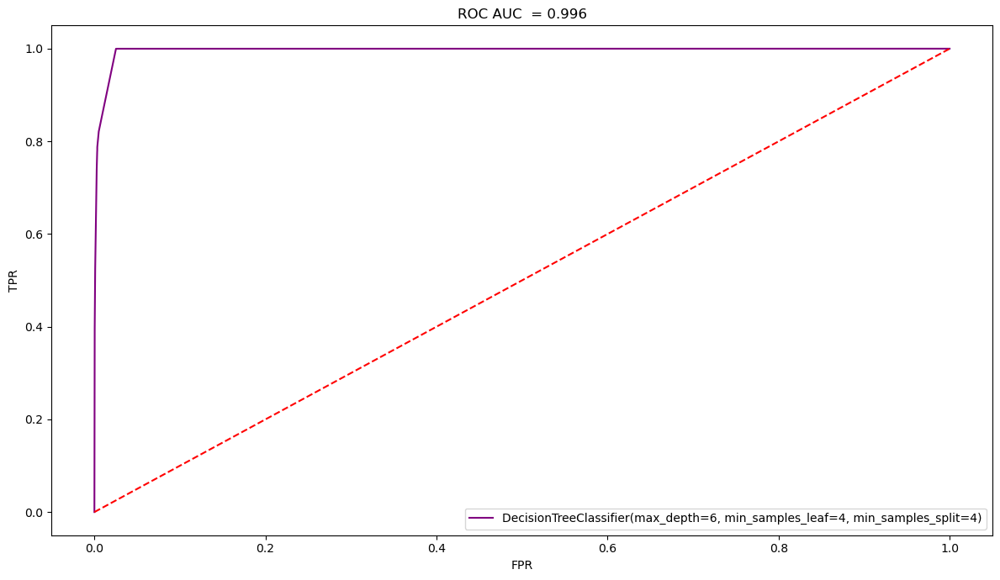

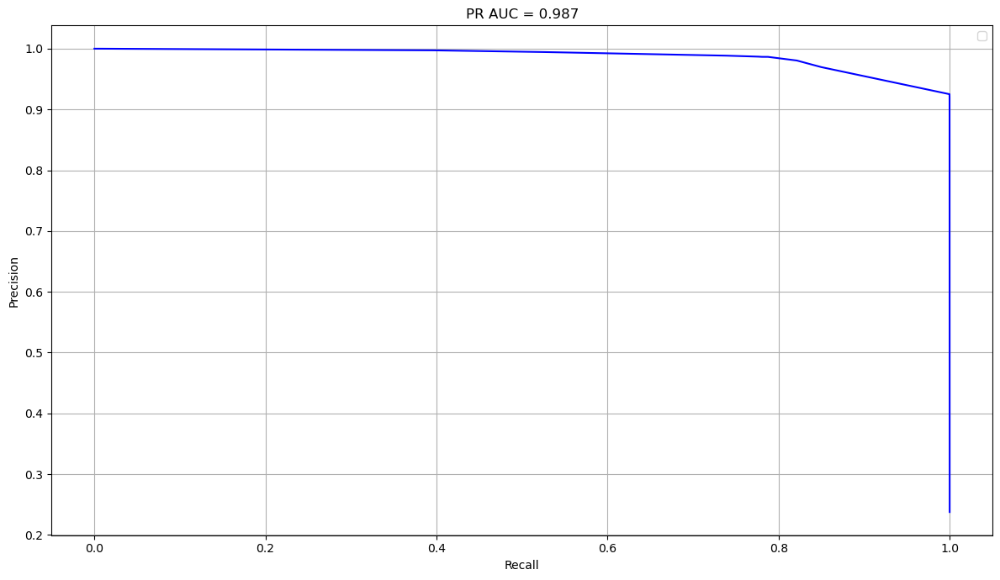


Result saved to scorecard


In [101]:
model_validation(DecisionTreeClassifier(**best_dt),x_train,y_train,x_test,y_test)

In [102]:
scorecard

,Model,Accuracy,Recall,Precision,F1_score,Cohen_kappa
0,LogisticRegression(),0.872,0.892,0.676,0.769,0.683
1,DecisionTreeClassifier(),0.980,0.958,0.958,0.958,0.945
2,"DecisionTreeClassifier(max_depth=6, min_sample...",0.981,1.000,0.925,0.961,0.948


# **`Bagging Classifier`**

Confusion Matrix : 
 [[55276   721]
 [  492 16970]]

 Classification Report : 
               precision    recall  f1-score   support

           0       0.99      0.99      0.99     55997
           1       0.96      0.97      0.97     17462

    accuracy                           0.98     73459
   macro avg       0.98      0.98      0.98     73459
weighted avg       0.98      0.98      0.98     73459



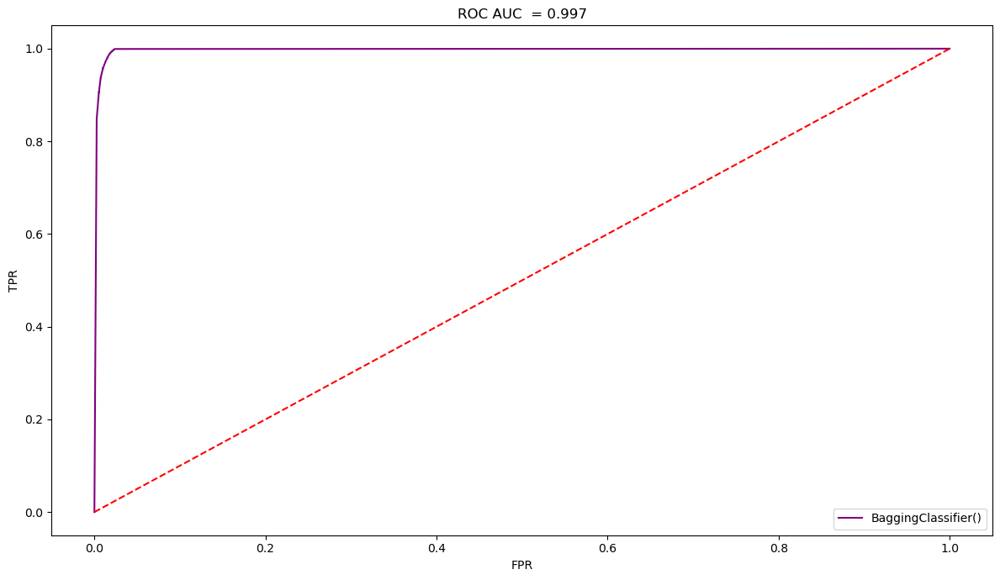

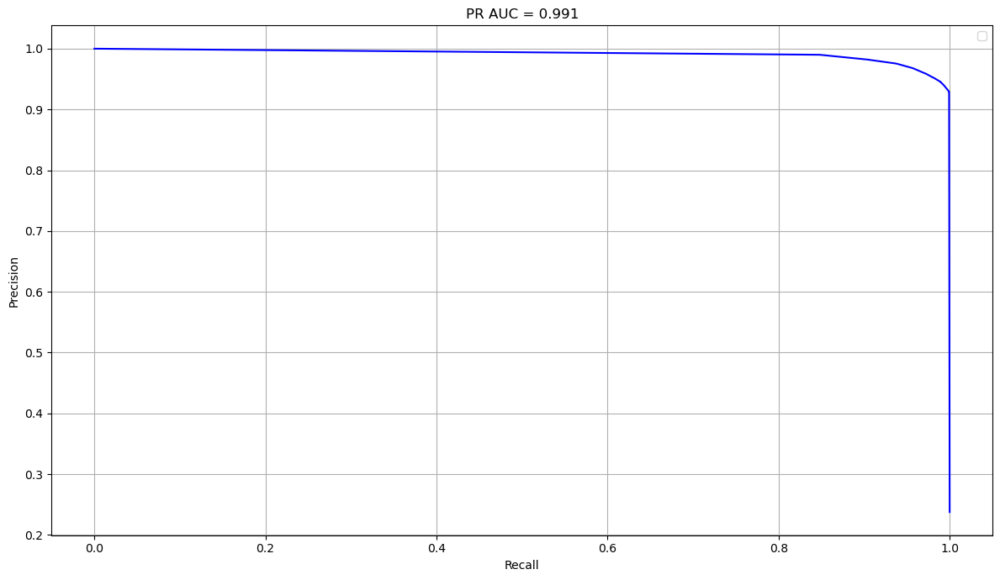


Result saved to scorecard


In [103]:
model_validation(BaggingClassifier(),x_train,y_train,x_test,y_test)

In [104]:
scorecard

,Model,Accuracy,Recall,Precision,F1_score,Cohen_kappa
0,LogisticRegression(),0.872,0.892,0.676,0.769,0.683
1,DecisionTreeClassifier(),0.980,0.958,0.958,0.958,0.945
2,"DecisionTreeClassifier(max_depth=6, min_sample...",0.981,1.000,0.925,0.961,0.948
3,BaggingClassifier(),0.983,0.972,0.959,0.965,0.955


### **`HyperParameter Tuning`**

In [105]:
best_bg = tuning_parameters(grid={'n_estimators':[300,400],'max_samples':[5,6]},
                            estimator=BaggingClassifier(),x=x_train,y=y_train)
best_bg

Fitting 5 folds for each of 4 candidates, totalling 20 fits


{'max_samples': 6, 'n_estimators': 400}

Confusion Matrix : 
 [[54117  1880]
 [  637 16825]]

 Classification Report : 
               precision    recall  f1-score   support

           0       0.99      0.97      0.98     55997
           1       0.90      0.96      0.93     17462

    accuracy                           0.97     73459
   macro avg       0.94      0.96      0.95     73459
weighted avg       0.97      0.97      0.97     73459



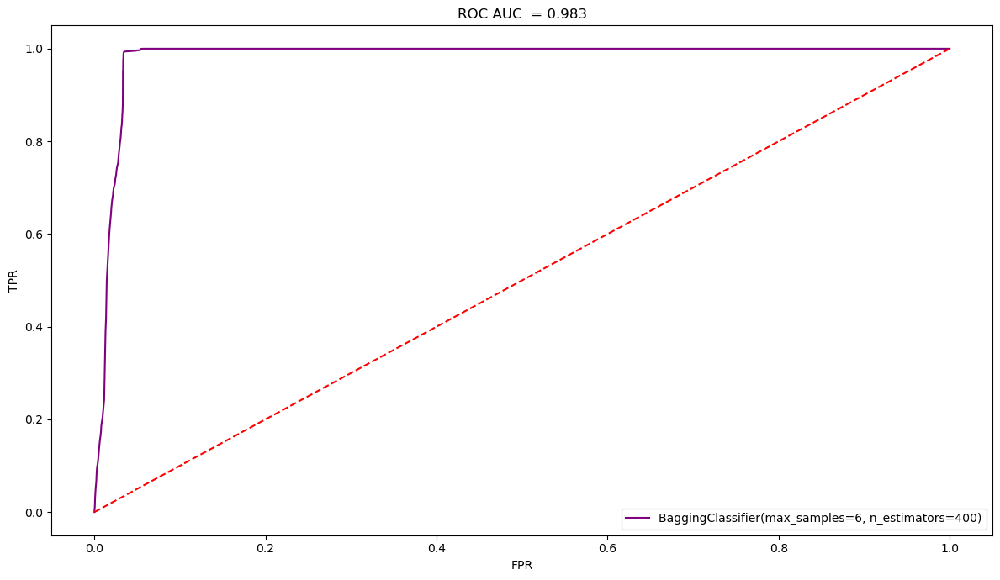

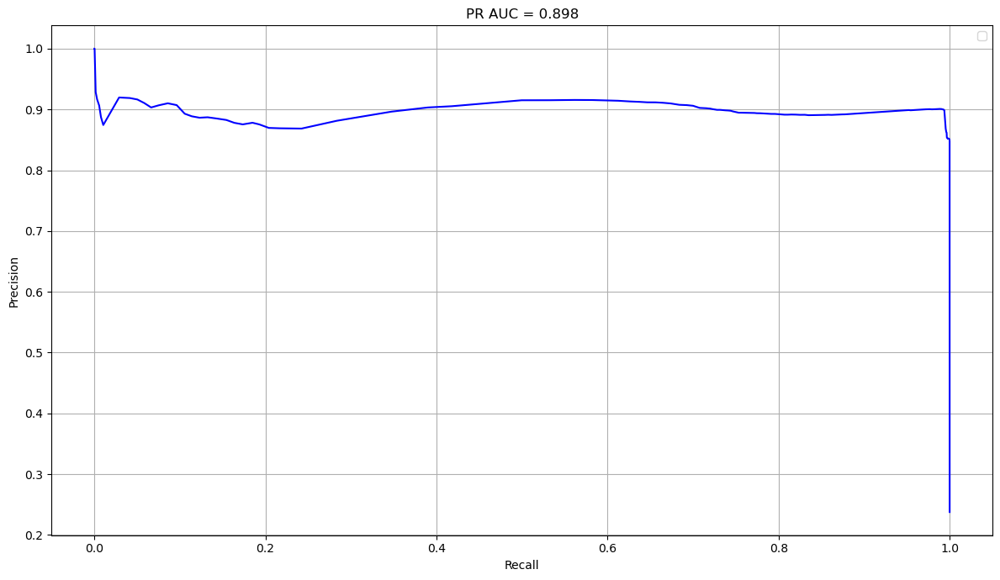


Result saved to scorecard


In [106]:
model_validation(BaggingClassifier(**best_bg),x_train,y_train,x_test,y_test)

In [107]:
scorecard

,Model,Accuracy,Recall,Precision,F1_score,Cohen_kappa
0,LogisticRegression(),0.872,0.892,0.676,0.769,0.683
1,DecisionTreeClassifier(),0.980,0.958,0.958,0.958,0.945
2,"DecisionTreeClassifier(max_depth=6, min_sample...",0.981,1.000,0.925,0.961,0.948
3,BaggingClassifier(),0.983,0.972,0.959,0.965,0.955
4,"BaggingClassifier(max_samples=6, n_estimators=...",0.966,0.964,0.899,0.930,0.908


## **`Random Forest Classifier`**

Confusion Matrix : 
 [[55130   867]
 [  274 17188]]

 Classification Report : 
               precision    recall  f1-score   support

           0       1.00      0.98      0.99     55997
           1       0.95      0.98      0.97     17462

    accuracy                           0.98     73459
   macro avg       0.97      0.98      0.98     73459
weighted avg       0.98      0.98      0.98     73459



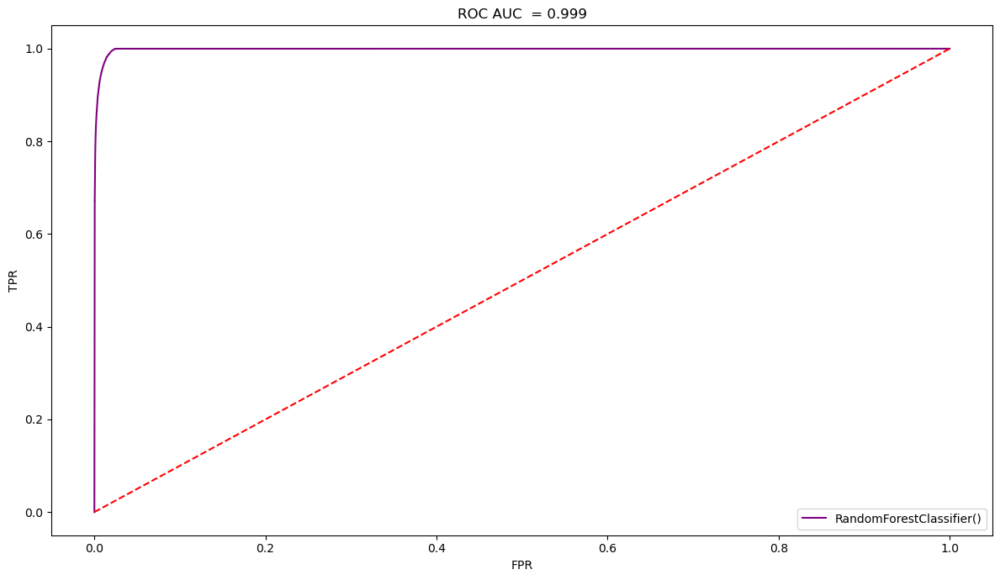

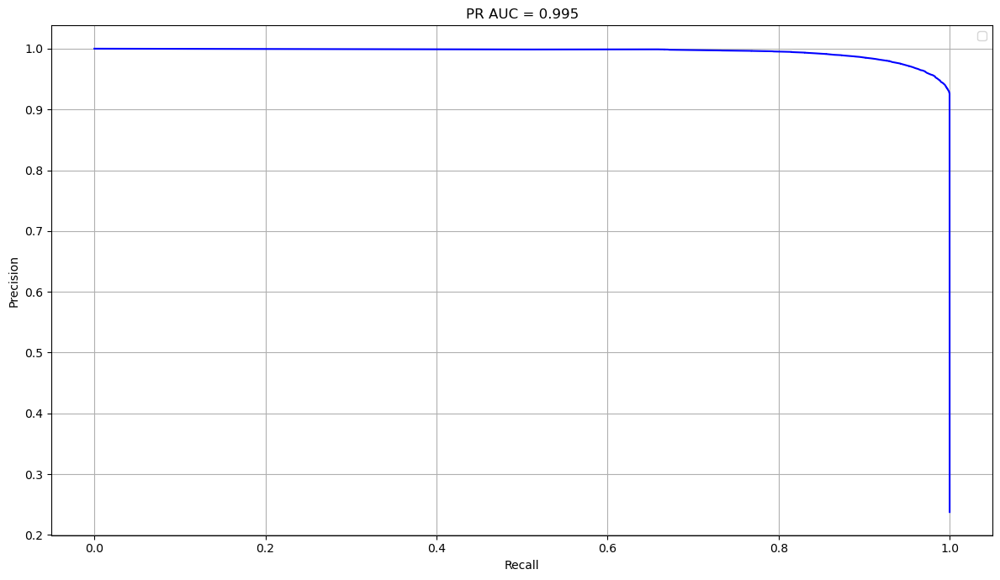


Result saved to scorecard


In [108]:
model_validation(RandomForestClassifier(),x_train,y_train,x_test,y_test)

In [109]:
scorecard

,Model,Accuracy,Recall,Precision,F1_score,Cohen_kappa
0,LogisticRegression(),0.872,0.892,0.676,0.769,0.683
1,DecisionTreeClassifier(),0.980,0.958,0.958,0.958,0.945
2,"DecisionTreeClassifier(max_depth=6, min_sample...",0.981,1.000,0.925,0.961,0.948
3,BaggingClassifier(),0.983,0.972,0.959,0.965,0.955
4,"BaggingClassifier(max_samples=6, n_estimators=...",0.966,0.964,0.899,0.930,0.908
5,RandomForestClassifier(),0.984,0.984,0.952,0.968,0.958


# **`AdaBoost Classifier`**

Confusion Matrix : 
 [[54625  1372]
 [   88 17374]]

 Classification Report : 
               precision    recall  f1-score   support

           0       1.00      0.98      0.99     55997
           1       0.93      0.99      0.96     17462

    accuracy                           0.98     73459
   macro avg       0.96      0.99      0.97     73459
weighted avg       0.98      0.98      0.98     73459



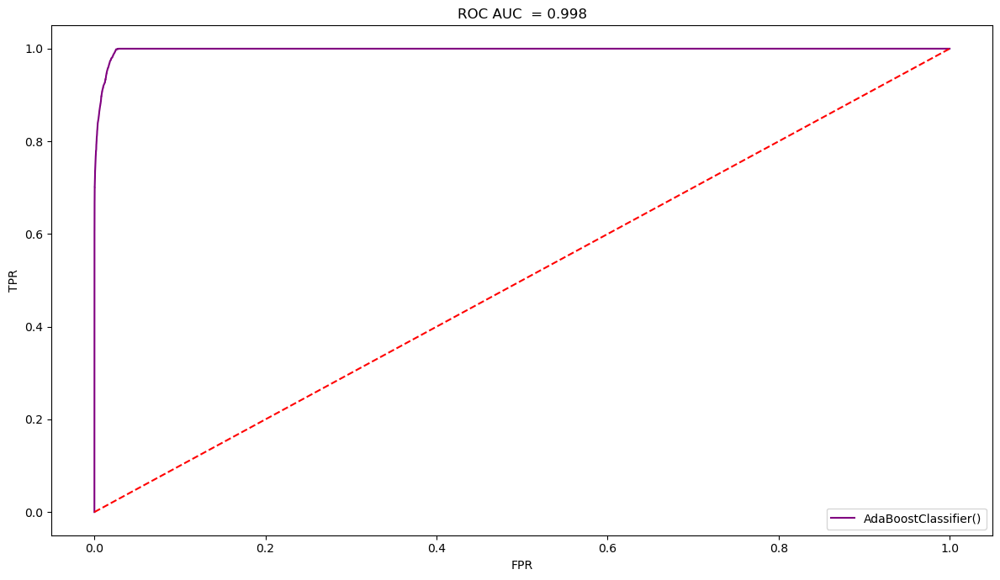

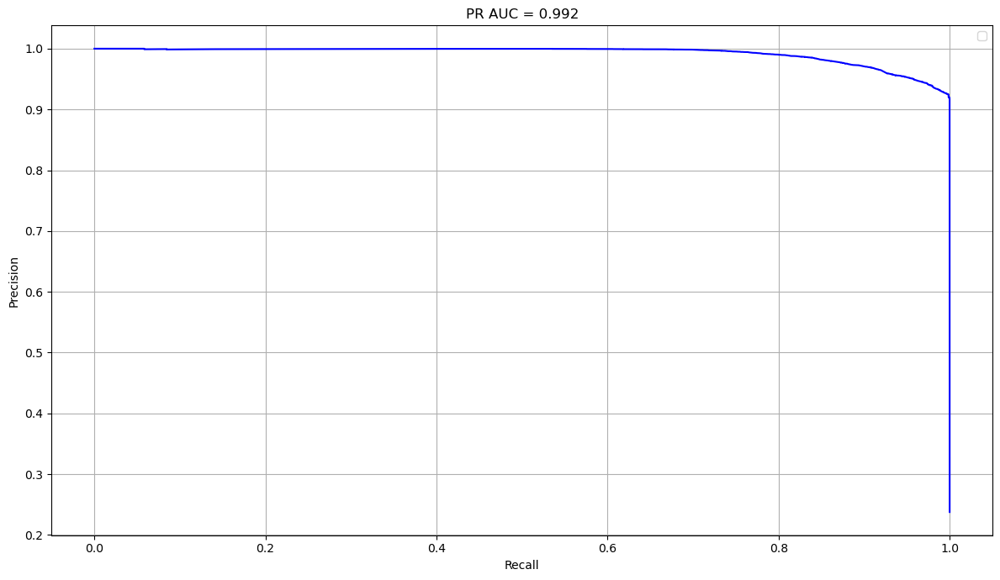


Result saved to scorecard


In [110]:
model_validation(AdaBoostClassifier(),x_train,y_train,x_test,y_test)

In [111]:
scorecard

,Model,Accuracy,Recall,Precision,F1_score,Cohen_kappa
0,LogisticRegression(),0.872,0.892,0.676,0.769,0.683
1,DecisionTreeClassifier(),0.980,0.958,0.958,0.958,0.945
2,"DecisionTreeClassifier(max_depth=6, min_sample...",0.981,1.000,0.925,0.961,0.948
3,BaggingClassifier(),0.983,0.972,0.959,0.965,0.955
4,"BaggingClassifier(max_samples=6, n_estimators=...",0.966,0.964,0.899,0.930,0.908
5,RandomForestClassifier(),0.984,0.984,0.952,0.968,0.958
6,AdaBoostClassifier(),0.980,0.995,0.927,0.960,0.947


# **`Gradient Boost Classifier`**

Confusion Matrix : 
 [[54632  1365]
 [   37 17425]]

 Classification Report : 
               precision    recall  f1-score   support

           0       1.00      0.98      0.99     55997
           1       0.93      1.00      0.96     17462

    accuracy                           0.98     73459
   macro avg       0.96      0.99      0.97     73459
weighted avg       0.98      0.98      0.98     73459



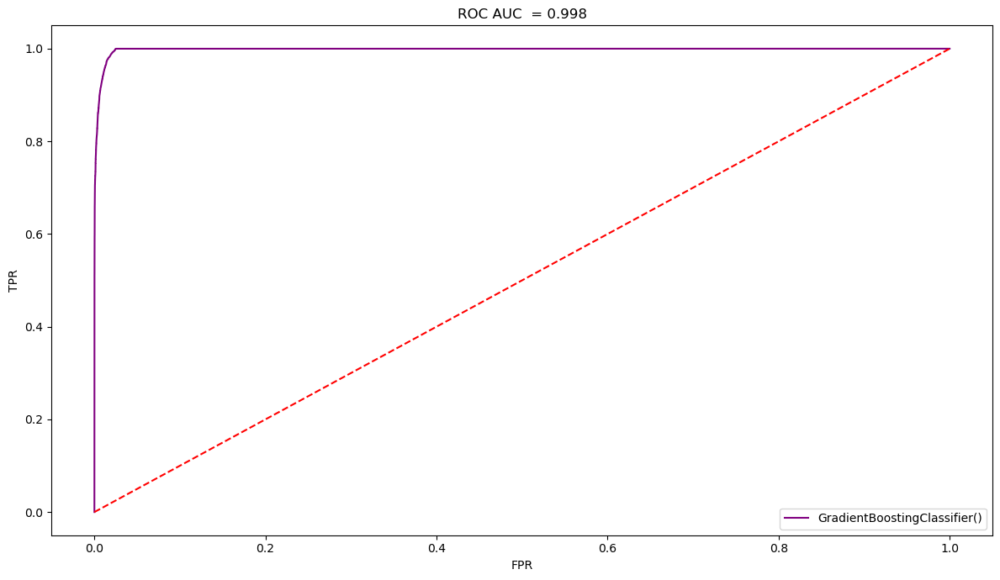

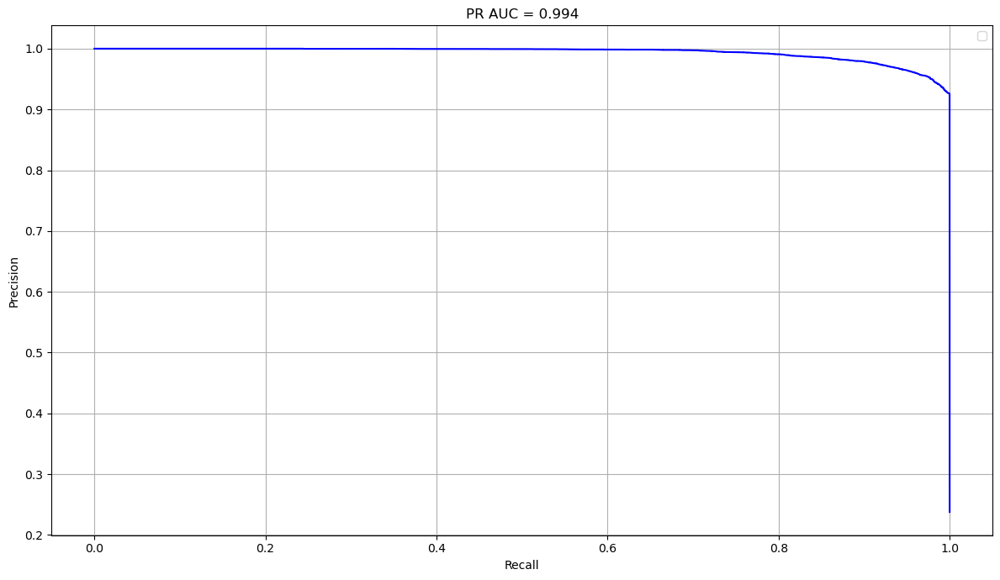


Result saved to scorecard


In [112]:
model_validation(GradientBoostingClassifier(),x_train,y_train,x_test,y_test)

In [113]:
scorecard

,Model,Accuracy,Recall,Precision,F1_score,Cohen_kappa
0,LogisticRegression(),0.872,0.892,0.676,0.769,0.683
1,DecisionTreeClassifier(),0.980,0.958,0.958,0.958,0.945
2,"DecisionTreeClassifier(max_depth=6, min_sample...",0.981,1.000,0.925,0.961,0.948
3,BaggingClassifier(),0.983,0.972,0.959,0.965,0.955
4,"BaggingClassifier(max_samples=6, n_estimators=...",0.966,0.964,0.899,0.930,0.908
5,RandomForestClassifier(),0.984,0.984,0.952,0.968,0.958
6,AdaBoostClassifier(),0.980,0.995,0.927,0.960,0.947
7,GradientBoostingClassifier(),0.981,0.998,0.927,0.961,0.949


# **`XG Boost Classifier`**

Confusion Matrix : 
 [[55187   810]
 [  247 17215]]

 Classification Report : 
               precision    recall  f1-score   support

           0       1.00      0.99      0.99     55997
           1       0.96      0.99      0.97     17462

    accuracy                           0.99     73459
   macro avg       0.98      0.99      0.98     73459
weighted avg       0.99      0.99      0.99     73459



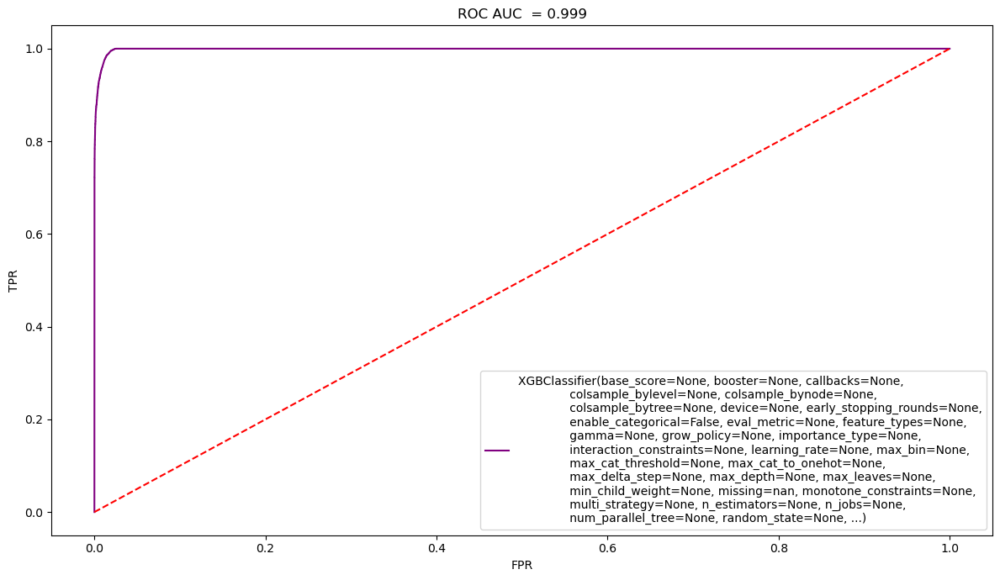

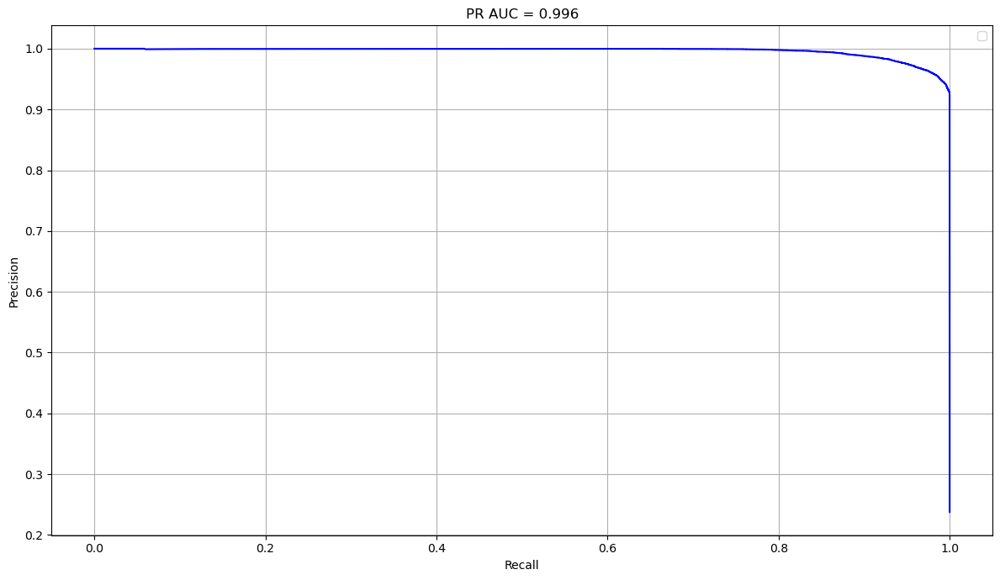


Result saved to scorecard


In [114]:
model_validation(XGBClassifier(),x_train,y_train,x_test,y_test)

In [115]:
scorecard

,Model,Accuracy,Recall,Precision,F1_score,Cohen_kappa
0,LogisticRegression(),0.872,0.892,0.676,0.769,0.683
1,DecisionTreeClassifier(),0.980,0.958,0.958,0.958,0.945
2,"DecisionTreeClassifier(max_depth=6, min_sample...",0.981,1.000,0.925,0.961,0.948
3,BaggingClassifier(),0.983,0.972,0.959,0.965,0.955
4,"BaggingClassifier(max_samples=6, n_estimators=...",0.966,0.964,0.899,0.930,0.908
5,RandomForestClassifier(),0.984,0.984,0.952,0.968,0.958
6,AdaBoostClassifier(),0.980,0.995,0.927,0.960,0.947
7,GradientBoostingClassifier(),0.981,0.998,0.927,0.961,0.949
8,"XGBClassifier(base_score=None, booster=None, c...",0.986,0.986,0.955,0.970,0.961


### **`HyperParameter Tuning`**

In [116]:
best_xg = tuning_parameters(grid={'n_estimators':[400,500],'min_child_weight':[3,4],
                                  'max_depth':[5,6],'learning_rate':[0.01,0.02,0.05],
                                 'gamma':[1,2]},estimator=XGBClassifier(),x=x_train,y=y_train)
best_xg

Fitting 5 folds for each of 48 candidates, totalling 240 fits


{'gamma': 1,
 'learning_rate': 0.05,
 'max_depth': 6,
 'min_child_weight': 3,
 'n_estimators': 500}

Confusion Matrix : 
 [[55078   919]
 [  185 17277]]

 Classification Report : 
               precision    recall  f1-score   support

           0       1.00      0.98      0.99     55997
           1       0.95      0.99      0.97     17462

    accuracy                           0.98     73459
   macro avg       0.97      0.99      0.98     73459
weighted avg       0.99      0.98      0.99     73459



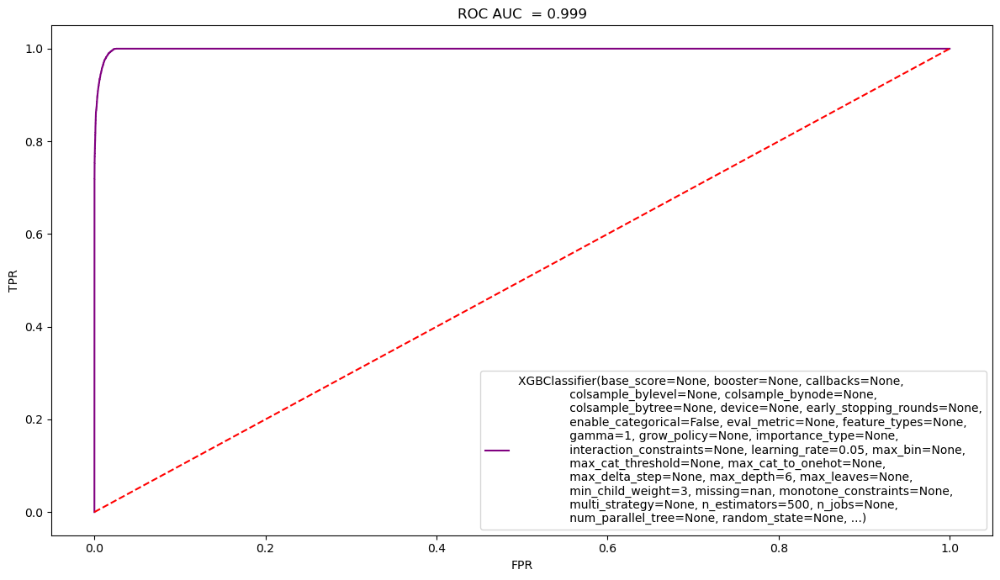

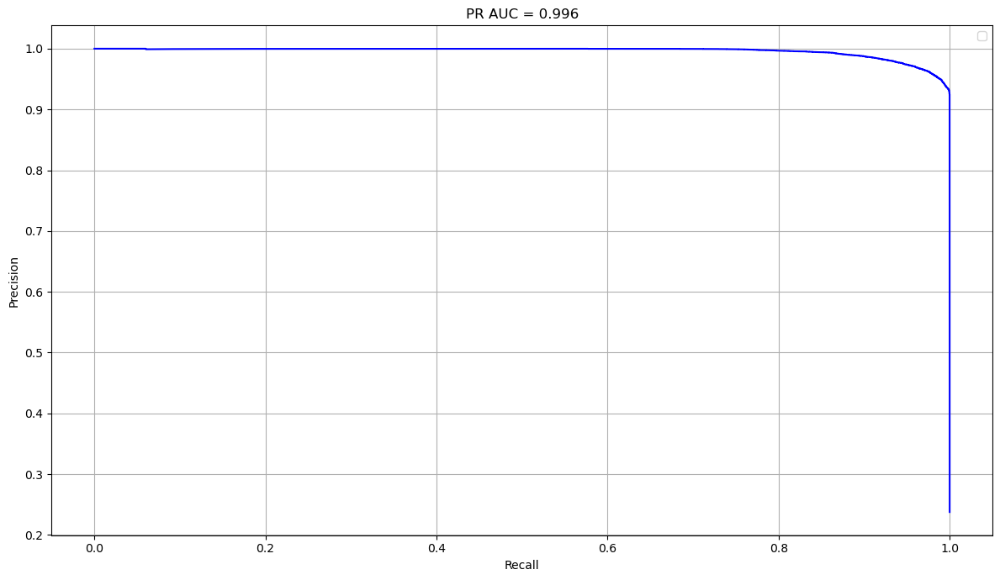


Result saved to scorecard


In [117]:
model_validation(XGBClassifier(**best_xg),x_train,y_train,x_test,y_test)

In [118]:
scorecard

,Model,Accuracy,Recall,Precision,F1_score,Cohen_kappa
0,LogisticRegression(),0.872,0.892,0.676,0.769,0.683
1,DecisionTreeClassifier(),0.980,0.958,0.958,0.958,0.945
2,"DecisionTreeClassifier(max_depth=6, min_sample...",0.981,1.000,0.925,0.961,0.948
3,BaggingClassifier(),0.983,0.972,0.959,0.965,0.955
4,"BaggingClassifier(max_samples=6, n_estimators=...",0.966,0.964,0.899,0.930,0.908
5,RandomForestClassifier(),0.984,0.984,0.952,0.968,0.958
6,AdaBoostClassifier(),0.980,0.995,0.927,0.960,0.947
7,GradientBoostingClassifier(),0.981,0.998,0.927,0.961,0.949
8,"XGBClassifier(base_score=None, booster=None, c...",0.986,0.986,0.955,0.970,0.961
9,"XGBClassifier(base_score=None, booster=None, c...",0.985,0.989,0.949,0.969,0.959


<div style="background-color: #FFEE77; padding: 10px;"> 

# **`Final Model`**

In [136]:
final_model = XGBClassifier(**best_bg)
final_model.fit(x_test, y_test)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              max_samples=6, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=400,
              n_jobs=None, num_parallel_tree=None, ...)

Confusion Matrix : 
 [[55255   742]
 [  343 17119]]

 Classification Report : 
               precision    recall  f1-score   support

           0       0.99      0.99      0.99     55997
           1       0.96      0.98      0.97     17462

    accuracy                           0.99     73459
   macro avg       0.98      0.98      0.98     73459
weighted avg       0.99      0.99      0.99     73459



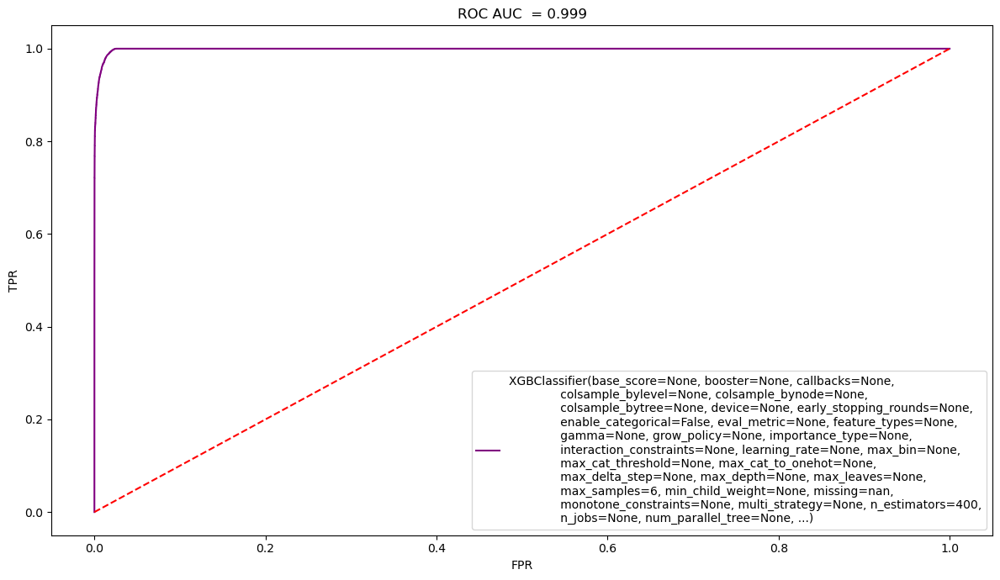

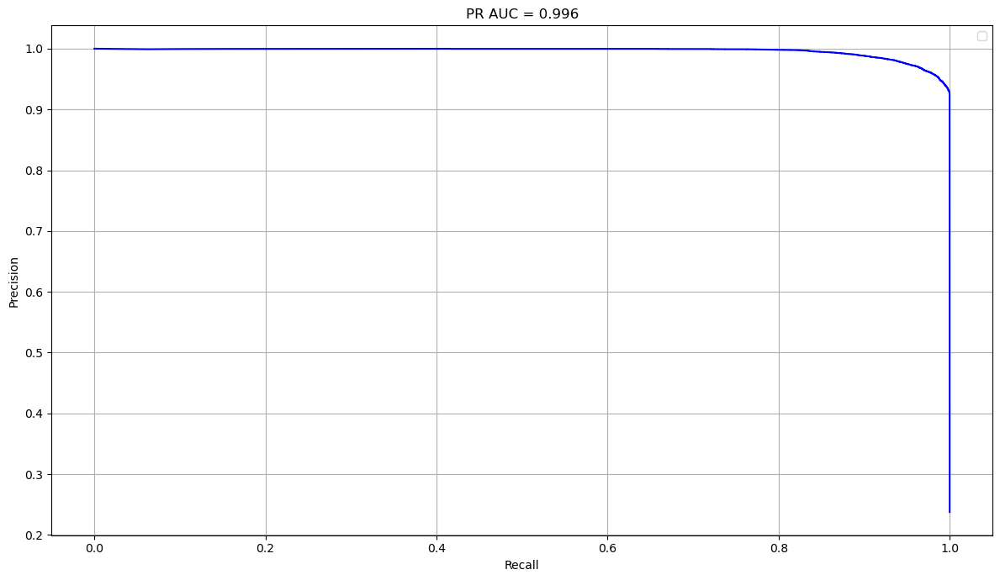


Result saved to scorecard


In [137]:
model_validation(final_model,x_train,y_train,x_test,y_test)

In [138]:
scorecard

,Model,Accuracy,Recall,Precision,F1_score,Cohen_kappa
0,LogisticRegression(),0.872,0.892,0.676,0.769,0.683
1,DecisionTreeClassifier(),0.980,0.958,0.958,0.958,0.945
2,"DecisionTreeClassifier(max_depth=6, min_sample...",0.981,1.000,0.925,0.961,0.948
3,BaggingClassifier(),0.983,0.972,0.959,0.965,0.955
4,"BaggingClassifier(max_samples=6, n_estimators=...",0.966,0.964,0.899,0.930,0.908
5,RandomForestClassifier(),0.984,0.984,0.952,0.968,0.958
6,AdaBoostClassifier(),0.980,0.995,0.927,0.960,0.947
7,GradientBoostingClassifier(),0.981,0.998,0.927,0.961,0.949
8,"XGBClassifier(base_score=None, booster=None, c...",0.986,0.986,0.955,0.970,0.961
9,"XGBClassifier(base_score=None, booster=None, c...",0.985,0.989,0.949,0.969,0.959


## **`KFold Cross Validation`**

In [141]:
model = final_model
kfold_validation = KFold(n_splits=20,shuffle=True,random_state=42)
results = cross_val_score(model, x_train, y_train, cv=kfold_validation, scoring='f1')

# Cross-validation scores
print("Cross-Validation f1 scores:", results)
print("Mean f1:", results.mean())
print("Standard deviation of cross-validation scores:", np.std(results))

Cross-Validation f1 scores: [0.98410314 0.98619455 0.98527932 0.98524009 0.98585909 0.98597019
 0.98613661 0.98482829 0.98652532 0.98592621 0.9859389  0.98657846
 0.98536892 0.98636911 0.9870361  0.98580018 0.9869672  0.98603598
 0.98582616 0.98730301]
Mean f1: 0.9859643404655495
Standard deviation of cross-validation scores: 0.00074337597337919


<div style="background-color: #ccf2ff; padding: 10px;">

#### **Inferences**
1. **Low Variance Across Folds:**  
   The low standard deviation (**`0.00074`**) indicates consistent performance across folds, suggesting the model is not overfitting to specific data subsets.

2. **High and Stable F1 Scores:**  
   A high mean F1 score (**`0.9859`**) with minimal fluctuation across folds implies that the model generalizes well and is not overly tailored to the training data.

3. **No Overfitting Evidence:**  
   The stable cross-validation results show no significant signs of overfitting; the model is robust and performs similarly across different data splits.


## **`Buisness Importance`**

In [139]:
importance = final_model.get_booster().get_score(importance_type='weight')

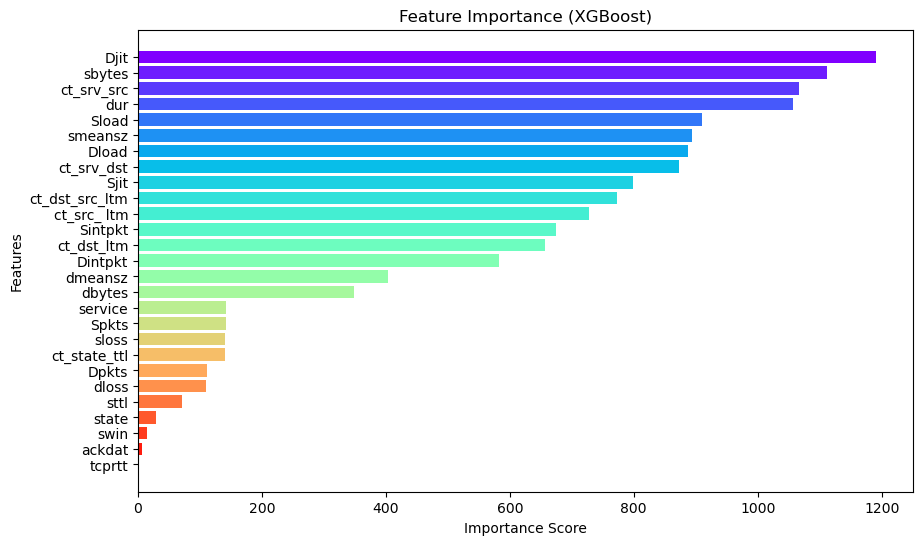

In [140]:
sorted_importance = sorted(importance.items(), key=lambda x: x[1], reverse=True)
features = [x[0] for x in sorted_importance]
scores = [x[1] for x in sorted_importance]

# Create a bar chart
plt.figure(figsize=(10, 6))
colors = plt.cm.rainbow(np.linspace(0, 1, len(features)))
plt.barh(features, scores, color=colors)
plt.xlabel('Importance Score')
plt.ylabel('Features')
plt.title('Feature Importance (XGBoost)')
plt.gca().invert_yaxis() 
plt.show()

<div style="background-color: #ccf2ff; padding: 10px;">

### **Inferences from XGBoost Feature Importance**

1. **Top Influential Features:**
   - `Djit`, `sbytes`, and `ct_srv_src` are the most significant features, heavily influencing the model's predictions. These features are critical for distinguishing between benign and malicious traffic.

2. **Moderately Important Features:**
   - Features like `dur`, `Sload`, `smeansz`, and `Dload` contribute meaningfully but are less critical than the top-ranked features. They provide additional insights into network traffic behavior.

3. **Low-Contribution Features:**
   - Features such as `tcprtt`, `ackdat`, and `swin` have minimal importance. These can be considered for removal to reduce model complexity without affecting performance significantly.

4. **Model Optimization:**
   - The high importance of a few key features indicates the potential for dimensionality reduction. This can enhance computational efficiency and interpretability while maintaining predictive accuracy.

5. **Domain Insights:**
   - Top-ranked features likely capture network characteristics crucial for identifying malicious activities. These insights can inform network security measures and monitoring strategies.

6. **Balanced Feature Contributions:**
   - While the model relies on a handful of highly important features, moderately important features add depth to the predictions. Streamlining the model by focusing on the top features could simplify deployment and maintenance.
